In [ ]:
## cluster analysis/segmentation

In [198]:
dataset_name = "W19_comb"
df_list = 'BES_Panel|BES_reduced'
#           ]#,"BESnumeric"]

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

Toggle code

In [ ]:
(var_type, cat_dictionary, new_old_col_names, old_new_col_names) = get_small_files(data_subfolder, encoding)

In [2]:
# get full set of inferred "cross wave" auth-lib/left-right values and ages
pan_dataset_allr_values = pd.read_csv(BES_small_data_files + "pan_dataset_allr_valuesW19"+".csv")
pan_dataset_ages = pd.read_csv( BES_small_data_files + "pan_dataset_ages"+".csv" )
pan_dataset_votes = pd.read_pickle(BES_small_data_files + "pan_dataset_votes"+".zip", compression='zip')

In [217]:
pan_dataset_allr_values = pan_dataset_allr_values.set_index("id")

In [18]:
pan_dataset_allr_values.columns

Index(['id', 'Economic: Left(0) <-> Right(200){uniform}',
       'Social: Liberalism(0) <-> Conservatism(200){uniform}',
       'Economic: Left <-> Right{gaussian-ish}',
       'Social: Liberalism <-> Conservatism{gaussian-ish}',
       'Economic: Left <-> Right{gaussian-ish}completish',
       'Economic: Left <-> Right{gaussian-ish}complete',
       'Social: Liberalism <-> Conservatism{gaussian-ish}completish',
       'Social: Liberalism <-> Conservatism{gaussian-ish}complete',
       'Economic: Left <-> Right{gaussian-ish}complete_fully',
       'Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully'],
      dtype='object')

In [19]:
df = pan_dataset_allr_values[ pan_dataset_allr_values.columns[-2:] ]

 1     6734
 3      596
 4      216
 5      154
 2      108
-1      101
 6       54
-3       46
-4       20
 8       19
-99      19
 9        7
 0        4
 7        1
Name: type, dtype: int64

In [21]:
X = df.copy()

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(df) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

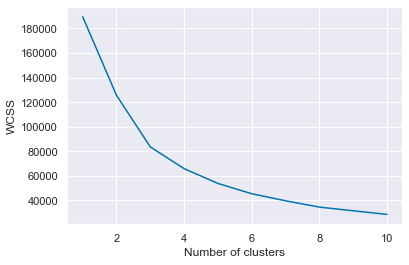

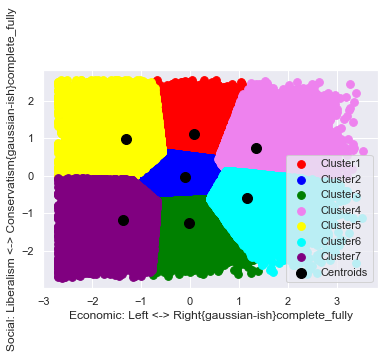

In [39]:
kmeans = KMeans(n_clusters = 7, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 60, c = 'red', label = 'Cluster1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 60, c = 'blue', label = 'Cluster2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 60, c = 'green', label = 'Cluster3')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 60, c = 'violet', label = 'Cluster4')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s = 60, c = 'yellow', label = 'Cluster5')
plt.scatter(X[y_kmeans == 5, 0], X[y_kmeans == 5, 1], s = 60, c = 'cyan', label = 'Cluster6')
plt.scatter(X[y_kmeans == 6, 0], X[y_kmeans == 6, 1], s = 60, c = 'purple', label = 'Cluster7')



plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'black', label = 'Centroids')
plt.xlabel(df.columns[0])
plt.ylabel(df.columns[1])
plt.legend() 

plt.show()

In [32]:
X.columns = [0,1]
X = X.values

For n_clusters = 2 The average silhouette_score is : 0.31996245976781557
For n_clusters = 3 The average silhouette_score is : 0.33897769958213414
For n_clusters = 4 The average silhouette_score is : 0.32782611801531636
For n_clusters = 5 The average silhouette_score is : 0.3272101837716752
For n_clusters = 6 The average silhouette_score is : 0.3295136520237925
For n_clusters = 7 The average silhouette_score is : 0.32445177687696136


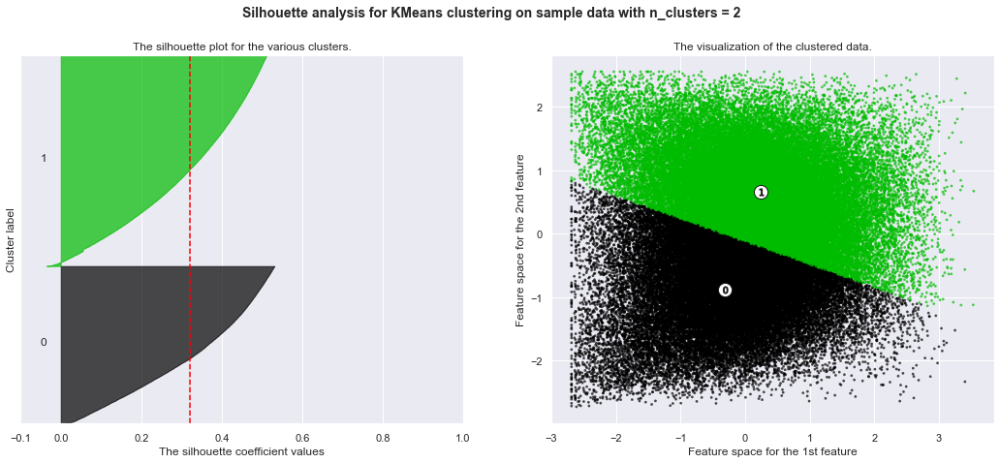

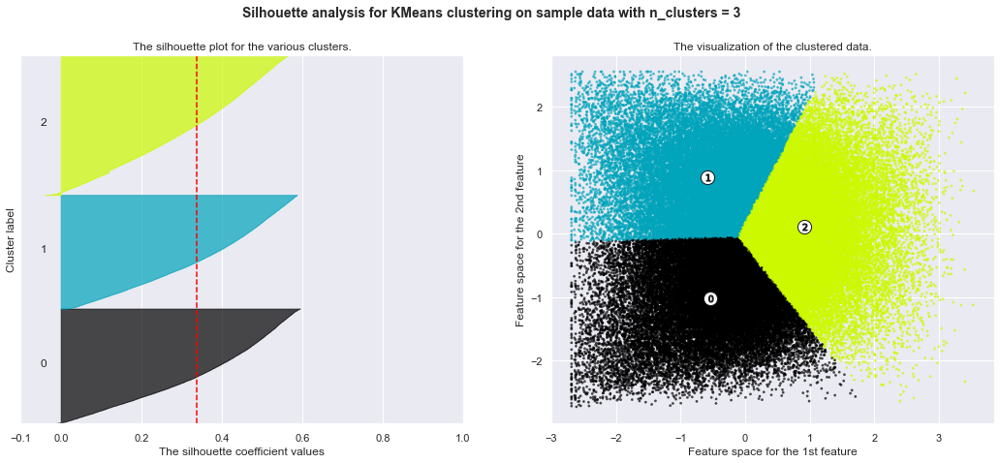

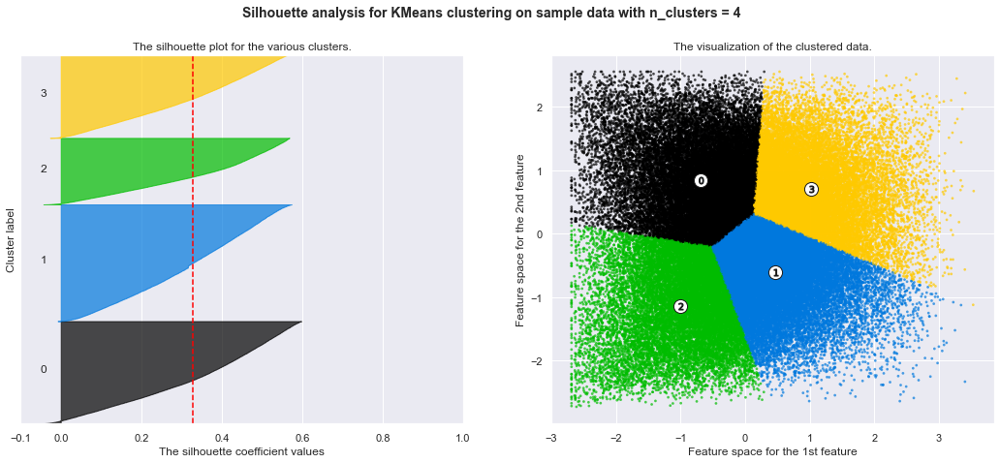

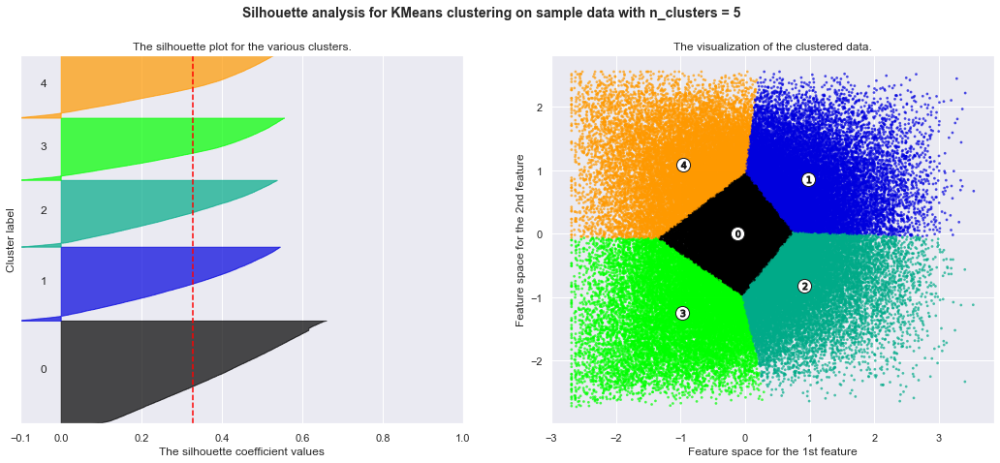

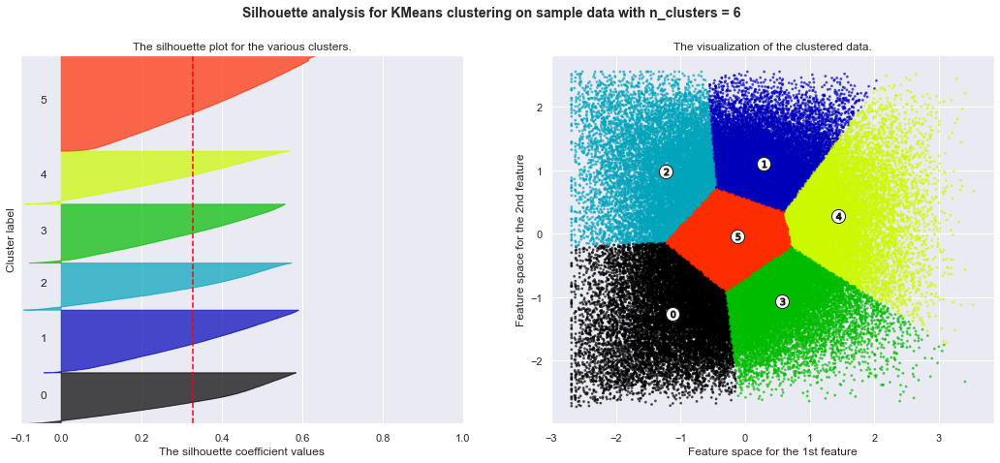

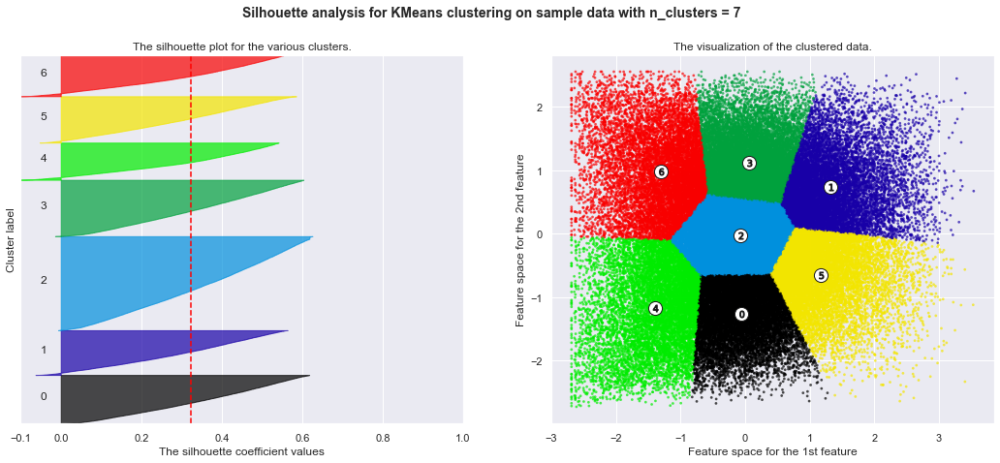

Wall time: 16min 41s


In [42]:
%%time
from sklearn.metrics import silhouette_samples, silhouette_score
range_n_clusters = [2, 3, 4, 5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [48]:
al_scale = amalgamate_waves(BES_Panel,"al_scale")

Amalgamating variables: 
{1: 'al_scaleW1_W5', 6: 'al_scaleW6', 7: 'al_scaleW7_W9', 10: 'al_scaleW10_W12', 13: 'al_scaleW13', 14: 'al_scaleW14W15', 16: 'al_scaleW16', 17: 'al_scaleW17'} ['al_scaleW1_W5', 'al_scaleW6', 'al_scaleW7_W9', 'al_scaleW10_W12', 'al_scaleW13', 'al_scaleW14W15', 'al_scaleW16', 'al_scaleW17']


In [49]:
lr_scale = amalgamate_waves(BES_Panel,"lr_scale")

Amalgamating variables: 
{1: 'lr_scaleW1_W5', 6: 'lr_scaleW6', 7: 'lr_scaleW7_W9', 10: 'lr_scaleW10_W12', 13: 'lr_scaleW13', 14: 'lr_scaleW14W15', 16: 'lr_scaleW16', 17: 'lr_scaleW17'} ['lr_scaleW1_W5', 'lr_scaleW6', 'lr_scaleW7_W9', 'lr_scaleW10_W12', 'lr_scaleW13', 'lr_scaleW14W15', 'lr_scaleW16', 'lr_scaleW17']


In [53]:
al_scale = al_scale.cat.codes

In [54]:
lr_scale = lr_scale.cat.codes

In [57]:
al_scale = al_scale.replace(-1,np.nan)
lr_scale = lr_scale.replace(-1,np.nan)

In [58]:
al_scale.isnull().sum(),lr_scale.isnull().sum(),

(7026, 6438)

In [150]:
df = pd.concat([lr_scale,al_scale],axis=1)
df = df[df.notnull().all(axis=1)]

In [151]:
al_lr_scale = df.copy()

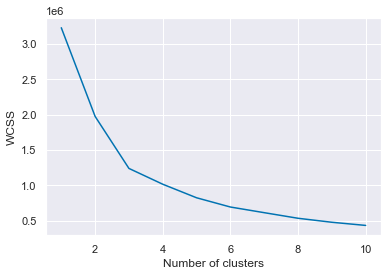

In [64]:
X = df.copy()

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(df) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

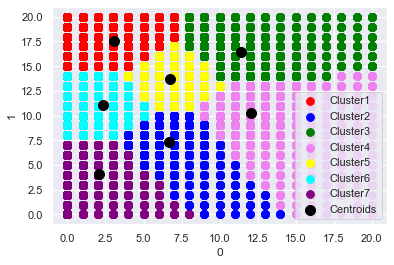

In [66]:
X.columns = [0,1]
X = X.values

kmeans = KMeans(n_clusters = 7, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 60, c = 'red', label = 'Cluster1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 60, c = 'blue', label = 'Cluster2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 60, c = 'green', label = 'Cluster3')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 60, c = 'violet', label = 'Cluster4')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s = 60, c = 'yellow', label = 'Cluster5')
plt.scatter(X[y_kmeans == 5, 0], X[y_kmeans == 5, 1], s = 60, c = 'cyan', label = 'Cluster6')
plt.scatter(X[y_kmeans == 6, 0], X[y_kmeans == 6, 1], s = 60, c = 'purple', label = 'Cluster7')



plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'black', label = 'Centroids')
plt.xlabel(df.columns[0])
plt.ylabel(df.columns[1])
plt.legend() 

plt.show()

In [ ]:
al1 = amalgamate_waves(BES_Panel,"^al1")

In [79]:
al1 = amalgamate_waves(BES_Panel, "^al1", low_priority_values = ["Don't know"])
al2 = amalgamate_waves(BES_Panel, "^al2", low_priority_values = ["Don't know"])
al3 = amalgamate_waves(BES_Panel, "^al3", low_priority_values = ["Don't know"])
al4 = amalgamate_waves(BES_Panel, "^al4", low_priority_values = ["Don't know"])
al5 = amalgamate_waves(BES_Panel, "^al5", low_priority_values = ["Don't know"])

lr1 = amalgamate_waves(BES_Panel, "^lr1", low_priority_values = ["Don't know"])
lr2 = amalgamate_waves(BES_Panel, "^lr2", low_priority_values = ["Don't know"])
lr3 = amalgamate_waves(BES_Panel, "^lr3", low_priority_values = ["Don't know"])
lr4 = amalgamate_waves(BES_Panel, "^lr4", low_priority_values = ["Don't know"])
lr5 = amalgamate_waves(BES_Panel, "^lr5", low_priority_values = ["Don't know"])


Amalgamating variables: 
{6: 'al1W6', 13: 'al1W13', 16: 'al1W16', 17: 'al1W17', 1: 'al1W1_W5', 14: 'al1W14W15', 7: 'al1W7_W9', 10: 'al1W10_W12'} ['al1W1_W5', 'al1W6', 'al1W7_W9', 'al1W10_W12', 'al1W13', 'al1W14W15', 'al1W16', 'al1W17']
Amalgamating variables: 
{6: 'al2W6', 13: 'al2W13', 16: 'al2W16', 17: 'al2W17', 1: 'al2W1_W5', 14: 'al2W14W15', 7: 'al2W7_W9', 10: 'al2W10_W12'} ['al2W1_W5', 'al2W6', 'al2W7_W9', 'al2W10_W12', 'al2W13', 'al2W14W15', 'al2W16', 'al2W17']
Amalgamating variables: 
{6: 'al3W6', 13: 'al3W13', 16: 'al3W16', 17: 'al3W17', 1: 'al3W1_W5', 14: 'al3W14W15', 7: 'al3W7_W9', 10: 'al3W10_W12'} ['al3W1_W5', 'al3W6', 'al3W7_W9', 'al3W10_W12', 'al3W13', 'al3W14W15', 'al3W16', 'al3W17']
Amalgamating variables: 
{6: 'al4W6', 13: 'al4W13', 16: 'al4W16', 17: 'al4W17', 1: 'al4W1_W5', 14: 'al4W14W15', 7: 'al4W7_W9', 10: 'al4W10_W12'} ['al4W1_W5', 'al4W6', 'al4W7_W9', 'al4W10_W12', 'al4W13', 'al4W14W15', 'al4W16', 'al4W17']
Amalgamating variables: 
{6: 'al5W6', 13: 'al5W13', 16: 

In [145]:
allr_num = pd.concat( [al1,al2,al3,al4,al5,lr1,lr2,lr3,lr4,lr5],axis=1  ).apply(lambda x: x.cat.codes)
allr_num.columns = [x.split("W")[0] for x in allr_num.columns]
allr_num = allr_num.loc[al_lr_scale.index]

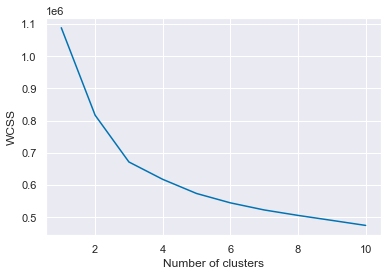

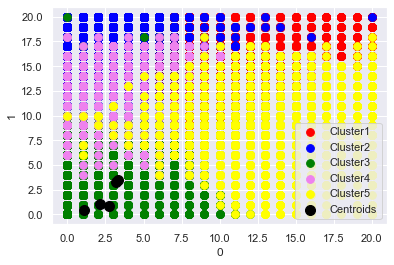

In [159]:
X = allr_num.copy()

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(allr_num) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
X = X.values

kmeans = KMeans(n_clusters = 5, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(al_lr_scale.loc[y_kmeans == 0, 0], al_lr_scale.loc[y_kmeans == 0, 1], s = 60, c = 'red', label = 'Cluster1')
plt.scatter(al_lr_scale.loc[y_kmeans == 1, 0], al_lr_scale.loc[y_kmeans == 1, 1], s = 60, c = 'blue', label = 'Cluster2')
plt.scatter(al_lr_scale.loc[y_kmeans == 2, 0], al_lr_scale.loc[y_kmeans == 2, 1], s = 60, c = 'green', label = 'Cluster3')
plt.scatter(al_lr_scale.loc[y_kmeans == 3, 0], al_lr_scale.loc[y_kmeans == 3, 1], s = 60, c = 'violet', label = 'Cluster4')
plt.scatter(al_lr_scale.loc[y_kmeans == 4, 0], al_lr_scale.loc[y_kmeans == 4, 1], s = 60, c = 'yellow', label = 'Cluster5')
# plt.scatter(al_lr_scale.loc[y_kmeans == 5, 0], al_lr_scale.loc[y_kmeans == 5, 1], s = 60, c = 'cyan', label = 'Cluster6')
# plt.scatter(al_lr_scale.loc[y_kmeans == 6, 0], al_lr_scale.loc[y_kmeans == 6, 1], s = 60, c = 'purple', label = 'Cluster7')



plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'black', label = 'Centroids')
plt.xlabel(al_lr_scale.columns[0])
plt.ylabel(al_lr_scale.columns[1])
plt.legend() 

plt.show()

In [157]:
al_lr_scale.loc[y_kmeans == 0, 0]

1        2.0
3        5.0
26       0.0
30       2.0
56       7.0
        ... 
98353    1.0
98366    6.0
98435    8.0
98450    0.0
98451    4.0
Name: 0, Length: 9448, dtype: float64

In [160]:
pd.concat( [al1,al2,al3,al4,al5,lr1,lr2,lr3,lr4,lr5],axis=1  )

,al1W1&6&7&10&13&14&16&17,al2W1&6&7&10&13&14&16&17,al3W1&6&7&10&13&14&16&17,al4W1&6&7&10&13&14&16&17,al5W1&6&7&10&13&14&16&17,lr1W1&6&7&10&13&14&16&17,lr2W1&6&7&10&13&14&16&17,lr3W1&6&7&10&13&14&16&17,lr4W1&6&7&10&13&14&16&17,lr5W1&6&7&10&13&14&16&17
1,Strongly agree,Strongly agree,Strongly agree,Strongly disagree,Strongly agree,Neither agree nor disagree,Strongly agree,Strongly agree,Strongly agree,Strongly agree
2,Neither agree nor disagree,Disagree,Agree,Disagree,Neither agree nor disagree,Disagree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Disagree
3,Agree,Agree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Agree,Strongly agree,Agree,Agree
4,Agree,Strongly agree,Agree,Neither agree nor disagree,Strongly agree,Agree,Agree,Neither agree nor disagree,Agree,Neither agree nor disagree
5,Agree,Agree,Agree,Disagree,Neither agree nor disagree,Neither agree nor disagree,Disagree,Neither agree nor disagree,Disagree,Agree
...,...,...,...,...,...,...,...,...,...,...
98447,Disagree,Neither agree nor disagree,Neither agree nor disagree,Disagree,Disagree,Neither agree nor disagree,Neither agree nor disagree,Disagree,Neither agree nor disagree,Neither agree nor disagree
98448,Disagree,Disagree,Disagree,Disagree,Disagree,Disagree,Disagree,Disagree,Agree,Disagree
98449,Disagree,Neither agree nor disagree,Disagree,Disagree,Neither agree nor disagree,Agree,Neither agree nor disagree,Agree,Agree,Agree
98450,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree


In [ ]:
###########################

In [165]:
allr_dum = pd.concat( [al1,al2,al3,al4,al5,lr1,lr2,lr3,lr4,lr5],axis=1  )
allr_dum.columns = [x.split("W")[0] for x in allr_dum.columns]
allr_dum = allr_dum.loc[al_lr_scale.index]
allr_dum = pd.get_dummies(allr_dum)

allr_dum = allr_dum.drop(allr_dum.columns[allr_dum.var()==0],axis=1)
# drop all don't knows!

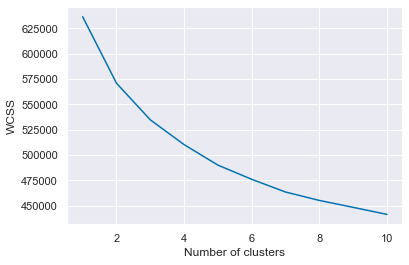

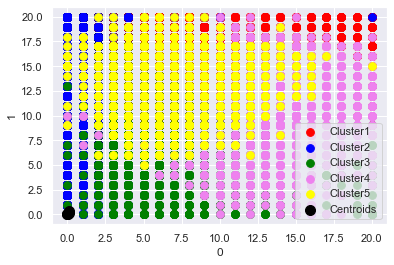

In [167]:
X = allr_dum.copy()

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
X = X.values

kmeans = KMeans(n_clusters = 5, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(al_lr_scale.loc[y_kmeans == 0, 0], al_lr_scale.loc[y_kmeans == 0, 1], s = 60, c = 'red', label = 'Cluster1')
plt.scatter(al_lr_scale.loc[y_kmeans == 1, 0], al_lr_scale.loc[y_kmeans == 1, 1], s = 60, c = 'blue', label = 'Cluster2')
plt.scatter(al_lr_scale.loc[y_kmeans == 2, 0], al_lr_scale.loc[y_kmeans == 2, 1], s = 60, c = 'green', label = 'Cluster3')
plt.scatter(al_lr_scale.loc[y_kmeans == 3, 0], al_lr_scale.loc[y_kmeans == 3, 1], s = 60, c = 'violet', label = 'Cluster4')
plt.scatter(al_lr_scale.loc[y_kmeans == 4, 0], al_lr_scale.loc[y_kmeans == 4, 1], s = 60, c = 'yellow', label = 'Cluster5')
# plt.scatter(al_lr_scale.loc[y_kmeans == 5, 0], al_lr_scale.loc[y_kmeans == 5, 1], s = 60, c = 'cyan', label = 'Cluster6')
# plt.scatter(al_lr_scale.loc[y_kmeans == 6, 0], al_lr_scale.loc[y_kmeans == 6, 1], s = 60, c = 'purple', label = 'Cluster7')



plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'black', label = 'Centroids')
plt.xlabel(al_lr_scale.columns[0])
plt.ylabel(al_lr_scale.columns[1])
plt.legend() 

plt.show()

In [192]:
# 

match(BES_Panel,"al\dW|lr\dW|redistSelf|locus\d|tolUncertain|riskScale|riskTaking|ethno|aom|competitiveness|benevolentSexism|hostileSexism|community|incremental|discrim|sdo|groupempathy|empathy|childvalues|zerosum|auth|socialDes|traditionalism|respectAuth")

redistSelfW1     30518
redistSelfW2     30238
redistSelfW3     27831
redistSelfW4     31530
redistSelfW6     30253
                 ...  
al2W10_W12       34991
al3W10_W12       34991
al4W10_W12       34991
al5W10_W12       34991
zeroSumIRTW14     7776
Length: 228, dtype: int64

In [200]:
match(BES_reduced,"al\dW|lr\dW|redistSelf|locus\d|tolUncertain|riskScale|riskTaking|ethno|aom|competitiveness|benevolentSexism|hostileSexism|community|incremental|discrim|sdo|groupempathy|empathy|childvalues|zerosum|auth|socialDes|traditionalism|respectAuth")

redistSelfW1__Government should be less concerned about equal incomes                                                        97006
redistSelfW2__Government should be less concerned about equal incomes                                                        97006
redistSelfW3__Government should be less concerned about equal incomes                                                        97006
redistSelfW4__Government should be less concerned about equal incomes                                                        97006
redistSelfW6__Government should be less concerned about equal incomes                                                        97006
                                                                                                                             ...  
incremental2W19_If ideas have been around for a long time, they probably have wisdom in them.                                97006
incremental1W19_Established traditions provide the wisdom necessary to understand t

In [226]:
X = BES_reduced[match(BES_reduced,"al\dW|lr\dW|redistSelf|locus\d|tolUncertain|riskScale|riskTaking|ethno|aom|competitiveness|benevolentSexism|hostileSexism|community|incremental|discrim|sdo|groupempathy|empathy|childvalues|zerosum|auth|socialDes|traditionalism|respectAuth").index]

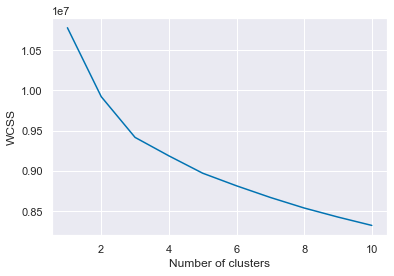

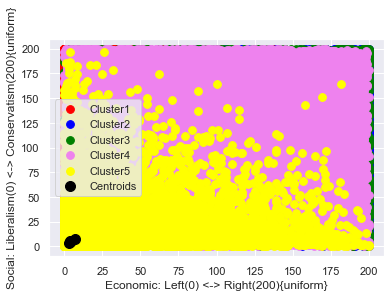

Wall time: 1min 51s


In [228]:
%%time
# X = X.loc[al_lr_scale.index]

# X = allr_dum.copy()
values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
X = X.values

kmeans = KMeans(n_clusters = 5, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X)

# plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 0, values_x], pan_dataset_allr_values.loc[y_kmeans == 0, values_y], s = 60, c = 'red', label = 'Cluster1')
# plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 1, values_x], pan_dataset_allr_values.loc[y_kmeans == 1, values_y], s = 60, c = 'blue', label = 'Cluster2')
# plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 2, values_x], pan_dataset_allr_values.loc[y_kmeans == 2, values_y], s = 60, c = 'green', label = 'Cluster3')
# plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 3, values_x], pan_dataset_allr_values.loc[y_kmeans == 3, values_y], s = 60, c = 'violet', label = 'Cluster4')
# plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 4, values_x], pan_dataset_allr_values.loc[y_kmeans == 4, values_y], s = 60, c = 'yellow', label = 'Cluster5')
# # plt.scatter(al_lr_scale.loc[y_kmeans == 5, 0], al_lr_scale.loc[y_kmeans == 5, 1], s = 60, c = 'cyan', label = 'Cluster6')
# # plt.scatter(al_lr_scale.loc[y_kmeans == 6, 0], al_lr_scale.loc[y_kmeans == 6, 1], s = 60, c = 'purple', label = 'Cluster7')



# # plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'black', label = 'Centroids')
# plt.xlabel(pan_dataset_allr_values.columns[0])
# plt.ylabel(pan_dataset_allr_values.columns[1])
# plt.legend() 

plt.show()

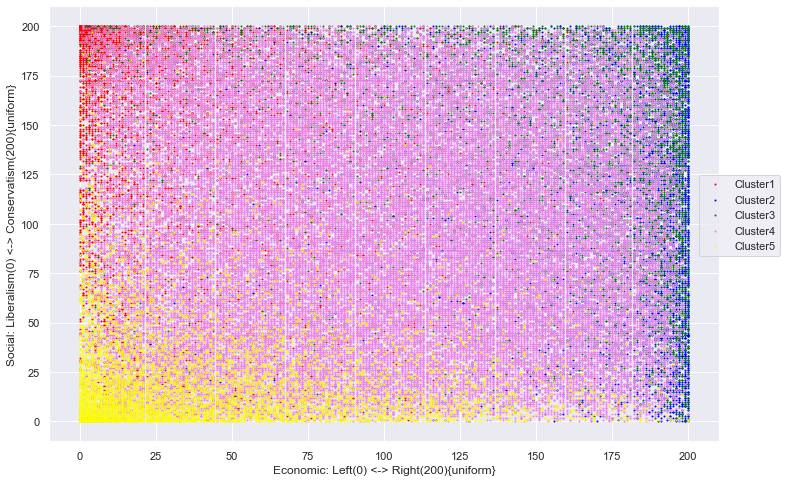

In [233]:
plt.figure(figsize=(12,8));
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 0, values_x], pan_dataset_allr_values.loc[y_kmeans == 0, values_y], s = 1, c = 'red', label = 'Cluster1')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 1, values_x], pan_dataset_allr_values.loc[y_kmeans == 1, values_y], s = 1, c = 'blue', label = 'Cluster2')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 2, values_x], pan_dataset_allr_values.loc[y_kmeans == 2, values_y], s = 1, c = 'green', label = 'Cluster3')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 3, values_x], pan_dataset_allr_values.loc[y_kmeans == 3, values_y], s = 1, c = 'violet', label = 'Cluster4')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 4, values_x], pan_dataset_allr_values.loc[y_kmeans == 4, values_y], s = 1, c = 'yellow', label = 'Cluster5')
# plt.scatter(al_lr_scale.loc[y_kmeans == 5, 0], al_lr_scale.loc[y_kmeans == 5, 1], s = 60, c = 'cyan', label = 'Cluster6')
# plt.scatter(al_lr_scale.loc[y_kmeans == 6, 0], al_lr_scale.loc[y_kmeans == 6, 1], s = 60, c = 'purple', label = 'Cluster7')



# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'black', label = 'Centroids')
plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.show()

In [239]:
X.shape
X[:,0:2]

(97006, 2)

In [240]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z2 = tsne.fit_transform(X[:,0:2]) 

# 142

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 97006 samples in 3.888s...
[t-SNE] Computed neighbors for 97006 samples in 31.986s...
[t-SNE] Computed conditional probabilities for sample 1000 / 97006
[t-SNE] Computed conditional probabilities for sample 2000 / 97006
[t-SNE] Computed conditional probabilities for sample 3000 / 97006
[t-SNE] Computed conditional probabilities for sample 4000 / 97006
[t-SNE] Computed conditional probabilities for sample 5000 / 97006
[t-SNE] Computed conditional probabilities for sample 6000 / 97006
[t-SNE] Computed conditional probabilities for sample 7000 / 97006
[t-SNE] Computed conditional probabilities for sample 8000 / 97006
[t-SNE] Computed conditional probabilities for sample 9000 / 97006
[t-SNE] Computed conditional probabilities for sample 10000 / 97006
[t-SNE] Computed conditional probabilities for sample 11000 / 97006
[t-SNE] Computed conditional probabilities for sample 12000 / 97006
[t-SNE] Computed conditional probabilities for sa

In [234]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(X) 

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 97006 samples in 0.018s...
[t-SNE] Computed neighbors for 97006 samples in 192.179s...
[t-SNE] Computed conditional probabilities for sample 1000 / 97006
[t-SNE] Computed conditional probabilities for sample 2000 / 97006
[t-SNE] Computed conditional probabilities for sample 3000 / 97006
[t-SNE] Computed conditional probabilities for sample 4000 / 97006
[t-SNE] Computed conditional probabilities for sample 5000 / 97006
[t-SNE] Computed conditional probabilities for sample 6000 / 97006
[t-SNE] Computed conditional probabilities for sample 7000 / 97006
[t-SNE] Computed conditional probabilities for sample 8000 / 97006
[t-SNE] Computed conditional probabilities for sample 9000 / 97006
[t-SNE] Computed conditional probabilities for sample 10000 / 97006
[t-SNE] Computed conditional probabilities for sample 11000 / 97006
[t-SNE] Computed conditional probabilities for sample 12000 / 97006
[t-SNE] Computed conditional probabilities for s

[Text(0.5, 1.0, 'Iris data T-SNE projection')]

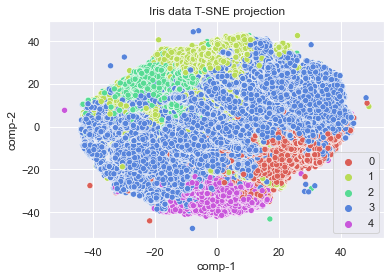

In [207]:
%%time
df = pd.DataFrame()
df["y"] = y_kmeans
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=df).set(title="Iris data T-SNE projection") 

In [235]:
from sklearn.metrics import davies_bouldin_score
davies_bouldin_score(z, y_kmeans)

1.6176190017570327

In [ ]:
## remember how to use hyperopt!



In [243]:
y_kmeans

array([0, 1, 3, ..., 3, 3, 3])

In [249]:
X.shape

(97006, 227)

Wall time: 1min 49s


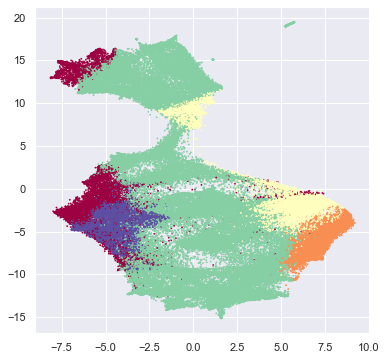

In [246]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_transformed[:, 0], X_transformed[:, 1], cmap="Spectral", c=y_kmeans, s=0.6)

2.5414670956210488

In [310]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
#     clf = KNeighborsClassifier(**params)
    
    embedding = pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})
#         pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})
        #n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0) 

# fit the data (The index of transformed data corresponds to the index of the original data)
    X_transformed = embedding.fit_transform(X, init=params["init"])
    
    return davies_bouldin_score(X_transformed, y_kmeans)

space4knn = {
#     'n_neighbors': hp.choice('n_neighbors', range(1,50))
    'n_components': 2,
    'n_neighbors':hp.choice('n_neighbors', range(2,50)),
    'MN_ratio':0.5,
    'FP_ratio':2.0,
    'apply_pca':True,
    #hp.choice('apply_pca', [True,False]),
    'lr':1.0,
    'init':'pca',
    
    #hp.choice('init', ['pca','random']),
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=15, trials=trials)
print('best:')
print(best)

100%|████████████████████████████████████████████████| 15/15 [23:53<00:00, 95.57s/trial, best loss: 1.5201085083547765]
best:
{'n_neighbors': 0}


In [308]:
10+15*(np.log10(X.shape[0])-4)

24.8019789551747

In [262]:
trials.trials

[{'state': 2,
  'tid': 0,
  'spec': None,
  'result': {'loss': 2.550753490079163, 'status': 'ok'},
  'misc': {'tid': 0,
   'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'workdir': None,
   'idxs': {'apply_pca': [0], 'init': [0]},
   'vals': {'apply_pca': [0], 'init': [0]}},
  'exp_key': None,
  'owner': None,
  'version': 0,
  'book_time': datetime.datetime(2022, 6, 3, 22, 18, 27, 676000),
  'refresh_time': datetime.datetime(2022, 6, 3, 22, 20, 16, 507000)},
 {'state': 2,
  'tid': 1,
  'spec': None,
  'result': {'loss': 2.644650200492234, 'status': 'ok'},
  'misc': {'tid': 1,
   'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'workdir': None,
   'idxs': {'apply_pca': [1], 'init': [1]},
   'vals': {'apply_pca': [0], 'init': [1]}},
  'exp_key': None,
  'owner': None,
  'version': 0,
  'book_time': datetime.datetime(2022, 6, 3, 22, 20, 16, 510000),
  'refresh_time': datetime.datetime(2022, 6, 3, 22, 22, 4, 732000)},
 {'state': 2,
  'tid': 2,
  'spec': None,
  'result': {'loss': 

Wall time: 29.9 s


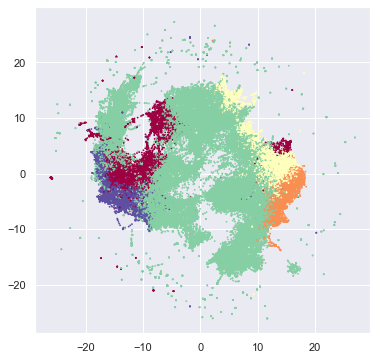

In [312]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=2, MN_ratio=0.5, FP_ratio=2.0, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_transformed[:, 0], X_transformed[:, 1], cmap="Spectral", c=y_kmeans, s=0.6)

In [314]:
davies_bouldin_score(X_transformed, y_kmeans)

1.5326042515978848

Wall time: 2min 40s


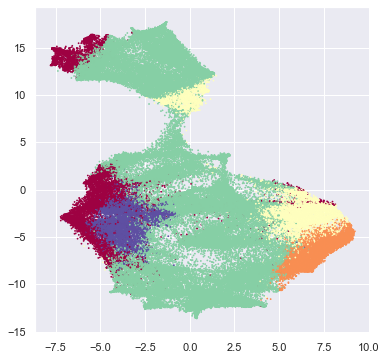

In [316]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=40, MN_ratio=0.5, FP_ratio=2.0, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_transformed[:, 0], X_transformed[:, 1], cmap="Spectral", c=y_kmeans, s=0.6)
print(davies_bouldin_score(X_transformed, y_kmeans))

In [317]:
davies_bouldin_score(X_transformed, y_kmeans)

2.445601464066372

In [ ]:
## too slow, got to speed this up!

In [318]:
variances = pd.DataFrame(X).var()

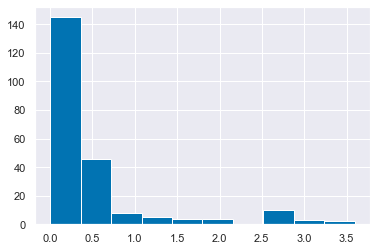

In [320]:
variances.hist()

In [322]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 10)
X_red = pca.fit_transform(X)
print(("Explained Variance: %s") % (pca.explained_variance_ratio_))
# print(fit.components_)

Explained Variance: [0.16587983 0.06634234 0.05521776 0.03948875 0.03200082 0.03055959
 0.02670432 0.02059892 0.0197103  0.01809449]


2.319144820225229
Wall time: 2min 27s


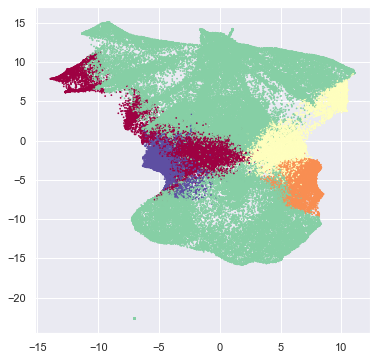

In [323]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=40, MN_ratio=0.5, FP_ratio=2.0, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_red, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_transformed[:, 0], X_transformed[:, 1], cmap="Spectral", c=y_kmeans, s=0.6)
print(davies_bouldin_score(X_transformed, y_kmeans))

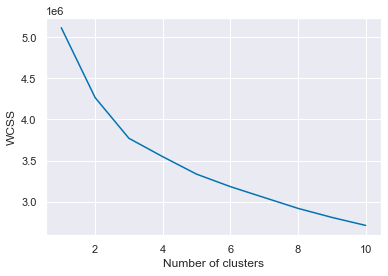

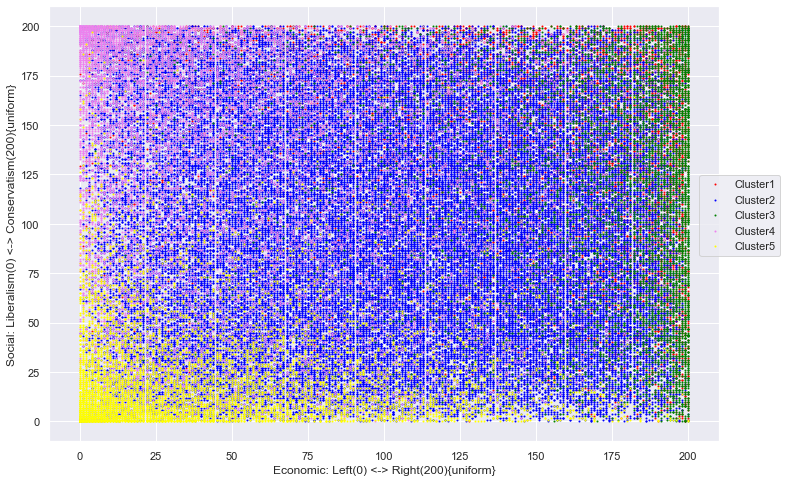

Wall time: 24.1 s


In [326]:
%%time
# X = X.loc[al_lr_scale.index]

# X = allr_dum.copy()
values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X_red) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
# X = X.values

kmeans = KMeans(n_clusters = 5, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X_red)

plt.figure(figsize=(12,8));
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 0, values_x], pan_dataset_allr_values.loc[y_kmeans == 0, values_y], s = 1, c = 'red', label = 'Cluster1')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 1, values_x], pan_dataset_allr_values.loc[y_kmeans == 1, values_y], s = 1, c = 'blue', label = 'Cluster2')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 2, values_x], pan_dataset_allr_values.loc[y_kmeans == 2, values_y], s = 1, c = 'green', label = 'Cluster3')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 3, values_x], pan_dataset_allr_values.loc[y_kmeans == 3, values_y], s = 1, c = 'violet', label = 'Cluster4')
plt.scatter(pan_dataset_allr_values.loc[y_kmeans == 4, values_x], pan_dataset_allr_values.loc[y_kmeans == 4, values_y], s = 1, c = 'yellow', label = 'Cluster5')


plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.show()

In [327]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(X_red) 


df = pd.DataFrame()
df["y"] = y_kmeans
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=df).set(title="Iris data T-SNE projection") 

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 97006 samples in 0.242s...
[t-SNE] Computed neighbors for 97006 samples in 38.514s...
[t-SNE] Computed conditional probabilities for sample 1000 / 97006
[t-SNE] Computed conditional probabilities for sample 2000 / 97006
[t-SNE] Computed conditional probabilities for sample 3000 / 97006
[t-SNE] Computed conditional probabilities for sample 4000 / 97006
[t-SNE] Computed conditional probabilities for sample 5000 / 97006
[t-SNE] Computed conditional probabilities for sample 6000 / 97006
[t-SNE] Computed conditional probabilities for sample 7000 / 97006
[t-SNE] Computed conditional probabilities for sample 8000 / 97006
[t-SNE] Computed conditional probabilities for sample 9000 / 97006
[t-SNE] Computed conditional probabilities for sample 10000 / 97006
[t-SNE] Computed conditional probabilities for sample 11000 / 97006
[t-SNE] Computed conditional probabilities for sample 12000 / 97006
[t-SNE] Computed conditional probabilities for sa

UsageError: Line magic function `%%time` not found.


[Text(0.5, 1.0, 'Iris data T-SNE projection')]

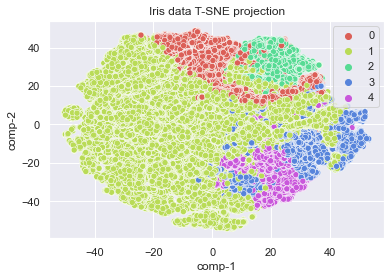

In [328]:
df = pd.DataFrame()
df["y"] = y_kmeans
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=df).set(title="Iris data T-SNE projection") 

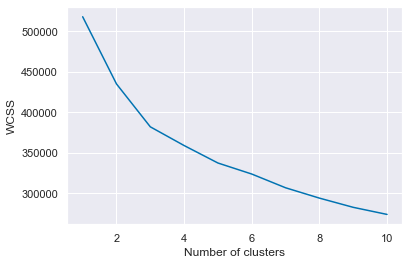

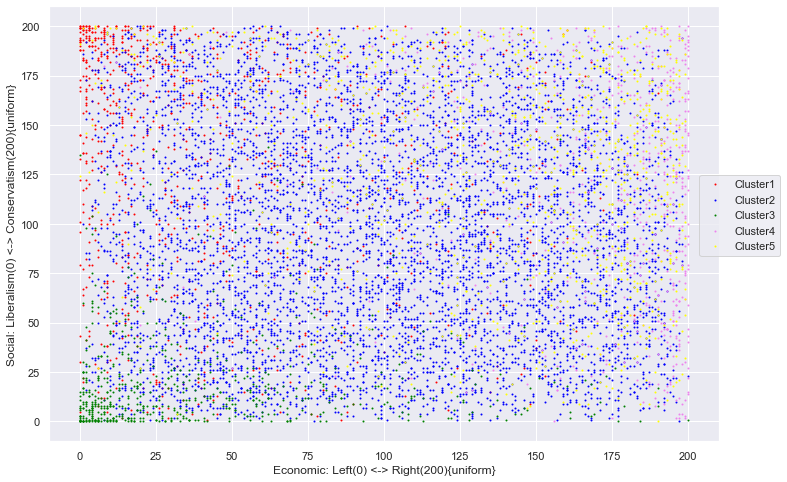

In [356]:
# %%time
X_train_ind, X_test_ind, y_train, y_test = train_test_split(BES_Panel.index, y_kmeans, test_size=0.1, random_state=42, stratify=y_kmeans)
X_test = pd.DataFrame(X_red,index=BES_Panel.index).loc[X_test_ind]

values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]
value_df = pan_dataset_allr_values.loc[X_test_ind]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X_test) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
# X = X.values

kmeans = KMeans(n_clusters = 5, init = "k-means++", random_state = 42)
y_test = kmeans.fit_predict(X_test)

plt.figure(figsize=(12,8));
plt.scatter(value_df.loc[y_test == 0, values_x], value_df.loc[y_test == 0, values_y], s = 1, c = 'red', label = 'Cluster1')
plt.scatter(value_df.loc[y_test == 1, values_x], value_df.loc[y_test == 1, values_y], s = 1, c = 'blue', label = 'Cluster2')
plt.scatter(value_df.loc[y_test == 2, values_x], value_df.loc[y_test == 2, values_y], s = 1, c = 'green', label = 'Cluster3')
plt.scatter(value_df.loc[y_test == 3, values_x], value_df.loc[y_test == 3, values_y], s = 1, c = 'violet', label = 'Cluster4')
plt.scatter(value_df.loc[y_test == 4, values_x], value_df.loc[y_test == 4, values_y], s = 1, c = 'yellow', label = 'Cluster5')


plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.show()
pd.Series(y_test).value_counts()

In [357]:
# pan_dataset_allr_values.loc[y_test == 1, values_x]
pd.Series(y_test).value_counts()

1    6398
4    1045
0     960
3     661
2     637
dtype: int64

2.0450392955269754
Wall time: 11.1 s


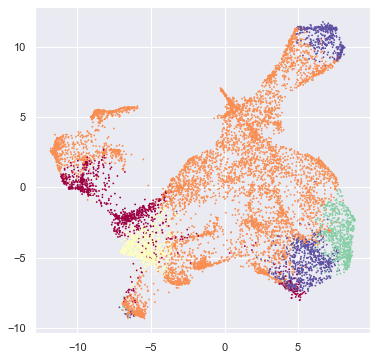

In [332]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=40, MN_ratio=0.5, FP_ratio=2.0, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_test, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_transformed[:, 0], X_transformed[:, 1], cmap="Spectral", c=y_test, s=0.6)
print(davies_bouldin_score(X_transformed, y_test))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9701 samples in 0.022s...
[t-SNE] Computed neighbors for 9701 samples in 1.062s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9701
[t-SNE] Computed conditional probabilities for sample 2000 / 9701
[t-SNE] Computed conditional probabilities for sample 3000 / 9701
[t-SNE] Computed conditional probabilities for sample 4000 / 9701
[t-SNE] Computed conditional probabilities for sample 5000 / 9701
[t-SNE] Computed conditional probabilities for sample 6000 / 9701
[t-SNE] Computed conditional probabilities for sample 7000 / 9701
[t-SNE] Computed conditional probabilities for sample 8000 / 9701
[t-SNE] Computed conditional probabilities for sample 9000 / 9701
[t-SNE] Computed conditional probabilities for sample 9701 / 9701
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.929474
[t-SNE] KL divergence after 1000 iterations: 1.579489
1.5717740021183568
Wall time: 35.7 s


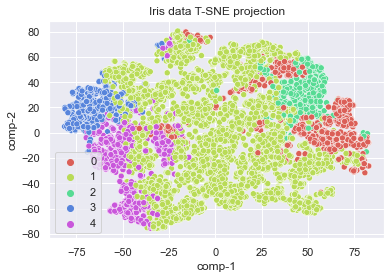

In [335]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

In [365]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
    embedding = pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})

# fit the data (The index of transformed data corresponds to the index of the original data)
    X_transformed = embedding.fit_transform(X_test.values, init=params["init"])
    
    return davies_bouldin_score(X_transformed, y_test)

space4knn = {
#     'n_neighbors': hp.choice('n_neighbors', range(1,50))
    'n_components': 2,
    'n_neighbors':hp.choice('n_neighbors', range(2,100)),
    'MN_ratio':0.5,
    'FP_ratio':2.0,
#     'apply_pca':True,
    'apply_pca':hp.choice('apply_pca', [True,False]),
    'lr':1.0,
#     'init':'pca',
    
    'init':hp.choice('init', ['pca','random']),
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=50, trials=trials)
print('best:')
print(best)

100%|█████████████████████████████████████████████████| 50/50 [10:11<00:00, 12.23s/trial, best loss: 1.373177826845351]
best:
{'apply_pca': 0, 'init': 0, 'n_neighbors': 1}


1.4090775904989612
Wall time: 2.16 s


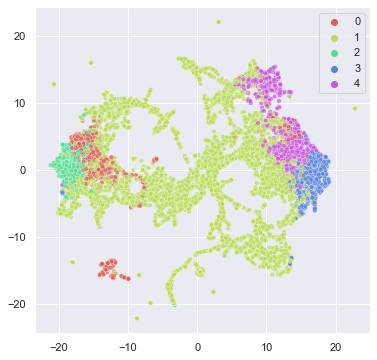

In [372]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=3, MN_ratio=0.5, FP_ratio=2.0, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_test.values, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# ax.scatter(X_transformed[:, 0], X_transformed[:, 1],
#            cmap="Spectral",
#            c=y_test, s=0.6)
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1],
#            cmap="Spectral",
           palette=sns.color_palette("hls", 5),
           hue=y_test, s=20,alpha=.7)

print(davies_bouldin_score(X_transformed, y_test))

In [373]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
#     embedding = pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})

# fit the data (The index of transformed data corresponds to the index of the original data)
#     X_transformed = embedding.fit_transform(X_test.values, init=params["init"])
    
    tsne = TSNE( **params)
    X_transformed = tsne.fit_transform(X_test) 

    
    return davies_bouldin_score(X_transformed, y_test)

space4knn = {
# #     'n_neighbors': hp.choice('n_neighbors', range(1,50))
#     'n_components': 2,
#     'n_neighbors':hp.choice('n_neighbors', range(2,100)),
#     'MN_ratio':0.5,
#     'FP_ratio':2.0,
# #     'apply_pca':True,
#     'apply_pca':hp.choice('apply_pca', [True,False]),
#     'lr':1.0,
# #     'init':'pca',
    
#     'init':hp.choice('init', ['pca','random']),
    
    'n_components':2,
    'verbose':0,
    'random_state':123,
    'perplexity':hp.choice('perplexity', range(5,50)),
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=20, trials=trials)
print('best:')
print(best)

100%|████████████████████████████████████████████████| 20/20 [11:04<00:00, 33.21s/trial, best loss: 1.2720402749585404]
best:
{'perplexity': 12}


1.2720402749585404
Wall time: 31.7 s


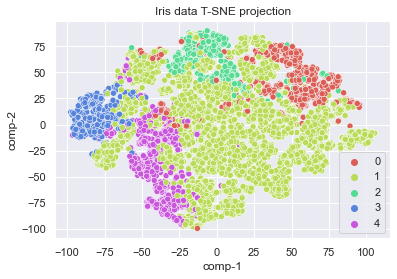

In [374]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0, random_state=123,perplexity=5+12)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", 5),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

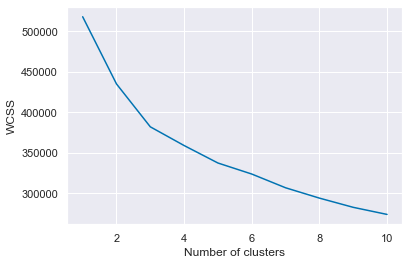

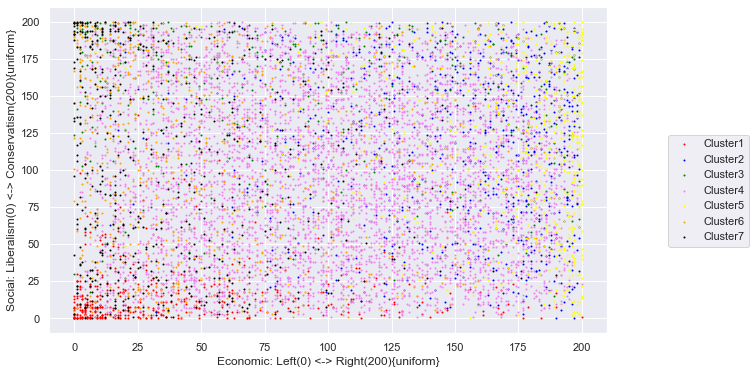

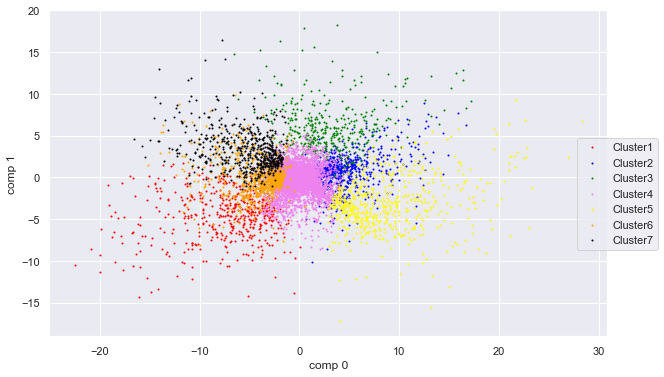

3    5961
1     841
5     801
4     647
6     564
0     499
2     388
dtype: int64

In [379]:
# %%time
n_clusters = 7

X_train_ind, X_test_ind, y_train, y_test = train_test_split(BES_Panel.index, y_kmeans, test_size=0.1, random_state=42, stratify=y_kmeans)
X_test = pd.DataFrame(X_red,index=BES_Panel.index).loc[X_test_ind]

values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]
value_df = pan_dataset_allr_values.loc[X_test_ind]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X_test) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
# X = X.values

kmeans = KMeans(n_clusters = n_clusters, init = "k-means++", random_state = 42)
y_test = kmeans.fit_predict(X_test)

colour_list=  ['red','blue','green','violet','yellow','orange','black']

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(value_df.loc[y_test == cluster, values_x], value_df.loc[y_test == cluster, values_y],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(X_test.loc[y_test == cluster, 0], X_test.loc[y_test == cluster, 1],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel("comp 0")
plt.ylabel("comp 1")
plt.legend(bbox_to_anchor =(1.1,.625)) 


plt.show()
pd.Series(y_test).value_counts()

In [380]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
#     embedding = pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})

# fit the data (The index of transformed data corresponds to the index of the original data)
#     X_transformed = embedding.fit_transform(X_test.values, init=params["init"])
    
    tsne = TSNE( **params)
    X_transformed = tsne.fit_transform(X_test) 

    
    return davies_bouldin_score(X_transformed, y_test)

space4knn = {
# #     'n_neighbors': hp.choice('n_neighbors', range(1,50))
#     'n_components': 2,
#     'n_neighbors':hp.choice('n_neighbors', range(2,100)),
#     'MN_ratio':0.5,
#     'FP_ratio':2.0,
# #     'apply_pca':True,
#     'apply_pca':hp.choice('apply_pca', [True,False]),
#     'lr':1.0,
# #     'init':'pca',
    
#     'init':hp.choice('init', ['pca','random']),
    
    'n_components':2,
    'verbose':0,
    'random_state':123,
    'perplexity':hp.choice('perplexity', range(5,50)),
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=50, trials=trials)
print('best:')
print(best)

100%|████████████████████████████████████████████████| 50/50 [27:13<00:00, 32.67s/trial, best loss: 1.1966480301906004]
best:
{'perplexity': 5}


1.1966480301906004
Wall time: 26.8 s


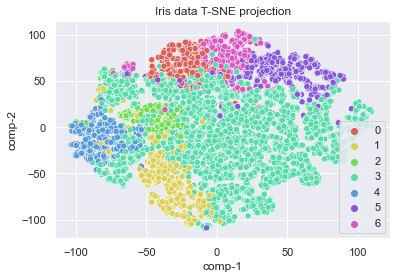

In [382]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0, random_state=123,perplexity=5+5)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", n_clusters),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

In [ ]:
#############################################################################

In [385]:
X_varset = BES_Panel[match(BES_Panel,"al\dW|lr\dW|redistSelf|locus\d|tolUncertain|riskScale|riskTaking|ethno|aom|competitiveness|benevolentSexism|hostileSexism|community|incremental|discrim|sdo|groupempathy|empathy|childvalues|zerosum|auth|socialDes|traditionalism|respectAuth").index]

In [392]:
X_varset.replace("Don't know",np.nan).notnull().sum().sort_values().head(50)
#.stack().value_counts().head(20)

empathy1W14         5898
sdoantiegal2W15     6082
sdoantiegal1W15     6146
sdodominance1W15    6181
sdoantiegal3W15     6294
sdodominance2W15    6319
sdodominance4W15    6429
sdodominance3W15    6446
sdoantiegal4W15     6447
empathy6W14         6818
auth1W10            6879
ethno5W9            6885
empathy9W14         6930
empathy7W14         6976
ethno1W9            7024
ethno2W9            7053
empathy4W14         7054
empathy5W14         7058
auth1W11            7061
empathy10W14        7089
auth2W10            7104
auth1W7             7106
empathy2W14         7113
zeroSum9W14         7115
auth1W14            7148
ethno6W9            7163
ethno4W9            7178
authLong2W10        7197
empathy8W14         7213
authLong3W10        7216
auth2W11            7229
auth4W10            7237
ethno3W9            7261
aom7W7              7291
aom1W7              7293
empathy3W14         7293
authLong1W10        7294
auth1W19            7302
aom6W7              7305
auth2W7             7306


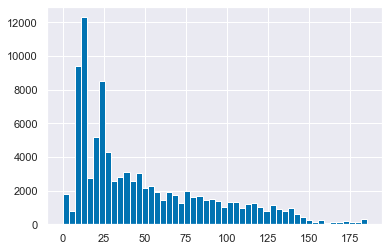

In [402]:
X_varset.replace("Don't know",np.nan).notnull().sum(axis=1).hist(bins=50)

In [397]:
X_varset.replace("Don't know",np.nan).notnull().sum(axis=1).median()

35.0

In [404]:
fuller_indices = X_varset.replace("Don't know",np.nan).notnull().sum(axis=1)[X_varset.replace("Don't know",np.nan).notnull().sum(axis=1)>30].index

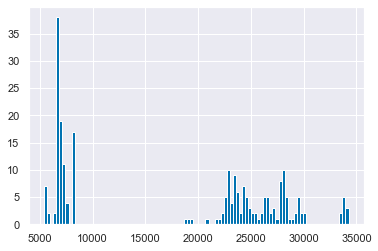

In [409]:
X_varset.loc[fuller_indices].replace("Don't know",np.nan).notnull().sum().hist(bins=100)

In [413]:
fuller_columns = X_varset.columns[X_varset.loc[fuller_indices].replace("Don't know",np.nan).notnull().sum()>10000]

In [417]:
X_varset.loc[fuller_indices,fuller_columns].columns[ X_varset.loc[fuller_indices,fuller_columns].notnull().sum()>20000 ]

Index(['redistSelfW1', 'redistSelfW2', 'redistSelfW3', 'redistSelfW4',
       'redistSelfW6', 'lr1W6', 'lr2W6', 'lr3W6', 'lr4W6', 'lr5W6',
       ...
       'lr1W10_W12', 'lr2W10_W12', 'lr3W10_W12', 'lr4W10_W12', 'lr5W10_W12',
       'al1W10_W12', 'al2W10_W12', 'al3W10_W12', 'al4W10_W12', 'al5W10_W12'],
      dtype='object', length=118)

In [423]:
X_varset.loc[fuller_indices,fuller_columns].notnull().sum().sort_values()

redistSelfW1       20591
redistSelfW3       21461
redistSelfW2       21635
tolUncertain1W8    23385
tolUncertain2W8    23385
                   ...  
lr3W7_W9           35042
lr2W7_W9           35042
lr1W7_W9           35042
al3W7_W9           35042
al4W7_W9           35042
Length: 128, dtype: int64

In [441]:
fuller_indices = X_varset.loc[fuller_indices,fuller_columns][X_varset.loc[fuller_indices,fuller_columns].notnull().sum(axis=1)>90].index

In [444]:
fuller_columns = X_varset.loc[fuller_indices,fuller_columns].columns[ X_varset.loc[fuller_indices,fuller_columns].replace("Don't know",np.nan).notnull().sum()>5000 ]

In [455]:
fuller_indices = X_varset.loc[fuller_indices,fuller_columns][ X_varset.loc[fuller_indices,fuller_columns].replace("Don't know",np.nan).notnull().sum(axis=1)>90 ].index

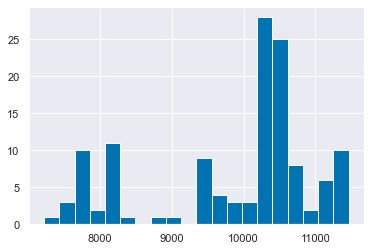

In [458]:
X_varset.loc[fuller_indices,fuller_columns].replace("Don't know",np.nan).notnull().sum().hist(bins=20)

In [471]:
# BES_reduced.loc[fuller_indices,fuller_columns]

var_type (8079, 14)


In [472]:
fuller_new_columns = [old_new_col_names[x] if x in old_new_col_names.keys() else x for x in fuller_columns]

In [509]:
X_varset.loc[fuller_indices,fuller_columns].replace("Don't know",np.nan).isnull().sum().sum()/(len(fuller_indices)*len(fuller_columns))

0.14888048027962372

In [486]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 10)
X_red = pca.fit_transform(BES_reduced.loc[fuller_indices,fuller_new_columns])
X_red = pd.DataFrame(X_red,index=fuller_indices)
print(("Explained Variance: %s") % (pca.explained_variance_ratio_))

Explained Variance: [0.28119252 0.10053088 0.0522942  0.03258685 0.03029104 0.0250799
 0.02330374 0.02223834 0.01923894 0.01727503]


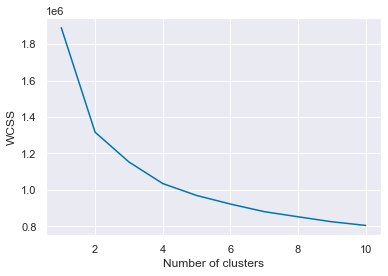

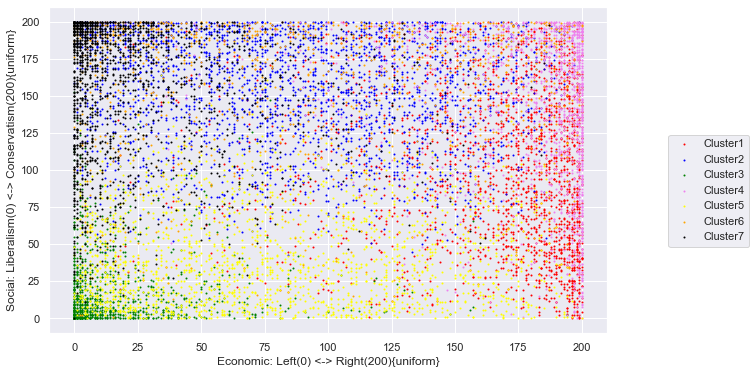

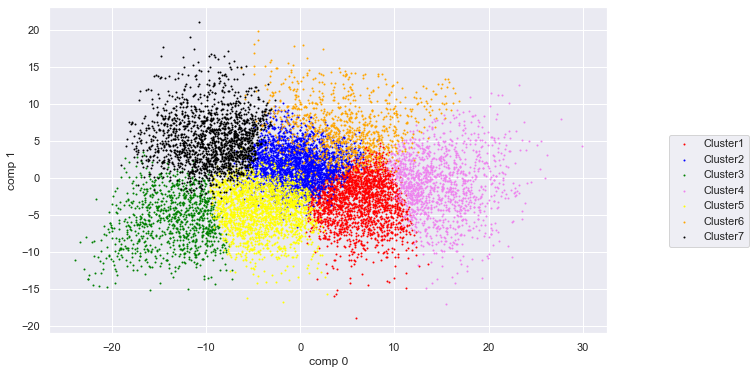

1    2466
0    2127
4    1919
6    1678
3    1357
5    1048
2     992
dtype: int64

In [493]:
# %%time
n_clusters = 7

# X_train_ind, X_test_ind, y_train, y_test = train_test_split(fuller_indices,
#                                                             pd.Series(y_kmeans,index=BES_Panel.index).loc[fuller_indices],
#                                                             test_size=0.1, random_state=42,
#                                                             stratify=pd.Series(y_kmeans,index=BES_Panel.index).loc[fuller_indices])
# X_test = BES_reduced.loc[fuller_indices,fuller_new_columns].loc[X_test_ind]
X_test = X_red.copy()

values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]
value_df = pan_dataset_allr_values.loc[X_test.index]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X_test) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
# X = X.values

kmeans = KMeans(n_clusters = n_clusters, init = "k-means++", random_state = 42)
y_test = kmeans.fit_predict(X_test)

colour_list=  ['red','blue','green','violet','yellow','orange','black']

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(value_df.loc[y_test == cluster, values_x], value_df.loc[y_test == cluster, values_y],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(X_test.loc[y_test == cluster, 0], X_test.loc[y_test == cluster, 1],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel("comp 0")
plt.ylabel("comp 1")
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.show()
pd.Series(y_test).value_counts()

1.0829226766960702
Wall time: 33 s


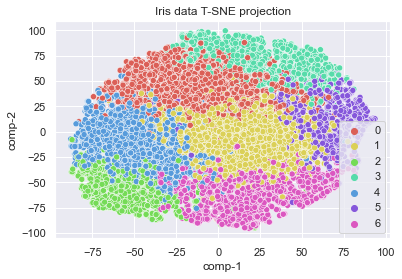

In [494]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0, random_state=123,perplexity=5+5)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", n_clusters),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

0.8926865560838131
Wall time: 4.9 s


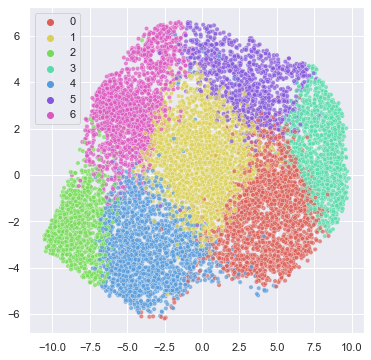

In [496]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_test.values, init="pca")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# ax.scatter(X_transformed[:, 0], X_transformed[:, 1],
#            cmap="Spectral",
#            c=y_test, s=0.6)
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1],
#            cmap="Spectral",
           palette=sns.color_palette("hls", 7),
           hue=y_test, s=20,alpha=.7)

print(davies_bouldin_score(X_transformed, y_test))

In [503]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
    embedding = pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})

# fit the data (The index of transformed data corresponds to the index of the original data)
    X_transformed = embedding.fit_transform(X_test.values, init=params["init"])
    
    return davies_bouldin_score(X_transformed, y_test)

space4knn = {
#     'n_neighbors': hp.choice('n_neighbors', range(1,50))
    'n_components': 2,
    'n_neighbors':hp.choice('n_neighbors', range(2,150)),
    'MN_ratio':hp.uniform('MN_ratio', .15, .85),
    #0.5,
    'FP_ratio':hp.uniform('FP_ratio', 1.25, 3.0),
#     'apply_pca':True,
    'apply_pca':hp.choice('apply_pca', [True,False]),
    'lr':1.0,
#     'init':'pca',
    
    'init':hp.choice('init', ['pca','random']),
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=150, trials=trials)
print('best:')
print(best)

100%|█████████████████████████████████████████████| 150/150 [1:08:44<00:00, 27.50s/trial, best loss: 0.846281433845231]
best:
{'FP_ratio': 2.9092771476624555, 'MN_ratio': 0.6426328965880335, 'apply_pca': 0, 'init': 0, 'n_neighbors': 145}


In [504]:
trials.trials

[{'state': 2,
  'tid': 0,
  'spec': None,
  'result': {'loss': 0.8782212819655107, 'status': 'ok'},
  'misc': {'tid': 0,
   'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'workdir': None,
   'idxs': {'FP_ratio': [0],
    'MN_ratio': [0],
    'apply_pca': [0],
    'init': [0],
    'n_neighbors': [0]},
   'vals': {'FP_ratio': [1.3563870092789334],
    'MN_ratio': [0.2008639282475132],
    'apply_pca': [0],
    'init': [0],
    'n_neighbors': [24]}},
  'exp_key': None,
  'owner': None,
  'version': 0,
  'book_time': datetime.datetime(2022, 6, 5, 9, 26, 14, 360000),
  'refresh_time': datetime.datetime(2022, 6, 5, 9, 26, 21, 531000)},
 {'state': 2,
  'tid': 1,
  'spec': None,
  'result': {'loss': 0.8481398058131887, 'status': 'ok'},
  'misc': {'tid': 1,
   'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'workdir': None,
   'idxs': {'FP_ratio': [1],
    'MN_ratio': [1],
    'apply_pca': [1],
    'init': [1],
    'n_neighbors': [1]},
   'vals': {'FP_ratio': [2.0874313499303874],
    

0.8561848872798673
Wall time: 30.2 s


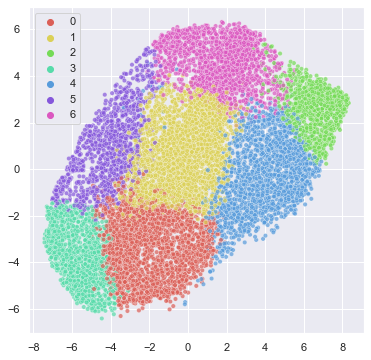

In [502]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=88+2, MN_ratio=0.6187685212521202, FP_ratio=2.2091940784070223, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_test.values, init="random")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# ax.scatter(X_transformed[:, 0], X_transformed[:, 1],
#            cmap="Spectral",
#            c=y_test, s=0.6)
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1],
#            cmap="Spectral",
           palette=sns.color_palette("hls", 7),
           hue=y_test, s=20,alpha=.7)

print(davies_bouldin_score(X_transformed, y_test))

In [505]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
#     embedding = pacmap.PaCMAP(**{k:v for k,v in params.items() if "init" not in k})

# fit the data (The index of transformed data corresponds to the index of the original data)
#     X_transformed = embedding.fit_transform(X_test.values, init=params["init"])
    
    tsne = TSNE( **params)
    X_transformed = tsne.fit_transform(X_test) 
    
    return davies_bouldin_score(X_transformed, y_test)

space4knn = {
# #     'n_neighbors': hp.choice('n_neighbors', range(1,50))
#     'n_components': 2,
#     'n_neighbors':hp.choice('n_neighbors', range(2,100)),
#     'MN_ratio':0.5,
#     'FP_ratio':2.0,
# #     'apply_pca':True,
#     'apply_pca':hp.choice('apply_pca', [True,False]),
#     'lr':1.0,
# #     'init':'pca',
    
#     'init':hp.choice('init', ['pca','random']),
    
    'n_components':2,
    'verbose':0,
    'random_state':123,
    'perplexity':hp.uniform('perplexity', 5,50),
    'early_exaggeration':hp.uniform('early_exaggeration', 3.0,36.0),
    'learning_rate':hp.uniform('learning_rate',10.0,1000.0),
    'init':hp.choice('init', ['pca','random']),
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=50, trials=trials)
print('best:')
print(best)

100%|████████████████████████████████████████████████| 50/50 [36:28<00:00, 43.77s/trial, best loss: 0.9874807266871947]
best:
{'early_exaggeration': 30.50561325686447, 'init': 0, 'learning_rate': 166.34416785183936, 'perplexity': 46.387968420192266}


1.0061166671045292
Wall time: 48.5 s


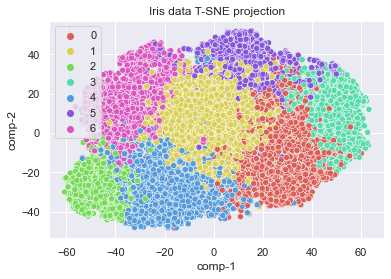

In [506]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0, random_state=123,init='pca',
            learning_rate=166.34416785183936,perplexity=5+46.387968420192266,early_exaggeration=30.50561325686447)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", n_clusters),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

In [ ]:
### using imputed-complete dataset without PCA

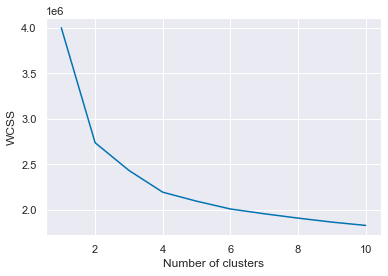

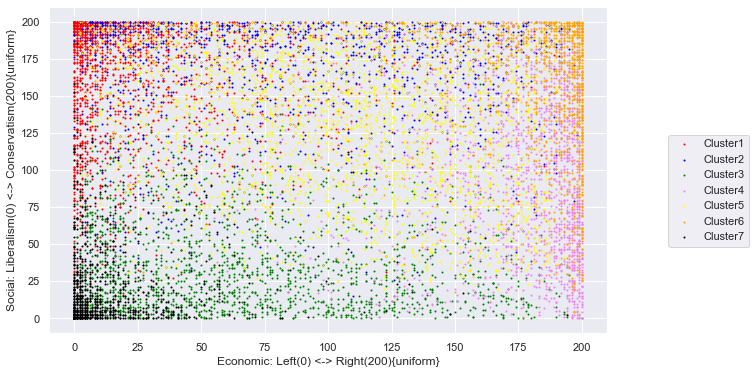

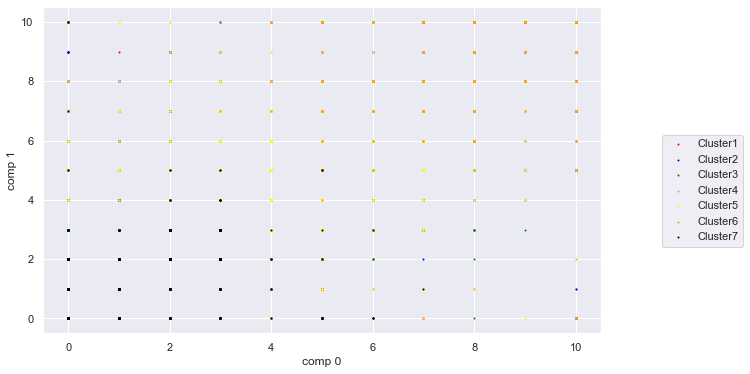

4    2432
0    1940
3    1824
2    1793
5    1361
1    1238
6     999
dtype: int64

In [789]:
# %%time
n_clusters = 7


X = df_simp_imp.apply(lambda x: x.cat.remove_categories("Don't know") if (x.name!='riskScaleW8') and ("Don't know" in x.cat.categories) else x)
X_test = X.apply(lambda x: x.cat.codes if x.dtype=='category' else x)

values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]
value_df = pan_dataset_allr_values.loc[X_test.index]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X_test) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
# X = X.values

kmeans = KMeans(n_clusters = n_clusters, init = "k-means++", random_state = 42)
y_test = kmeans.fit_predict(X_test)

colour_list=  ['red','blue','green','violet','yellow','orange','black']

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(value_df.loc[y_test == cluster, values_x], value_df.loc[y_test == cluster, values_y],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(X_test.loc[y_test == cluster, X_test.columns[0]], X_test.loc[y_test == cluster, X_test.columns[1]],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel("comp 0")
plt.ylabel("comp 1")
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.show()
pd.Series(y_test).value_counts()

0.8857100026470092
Wall time: 32.3 s


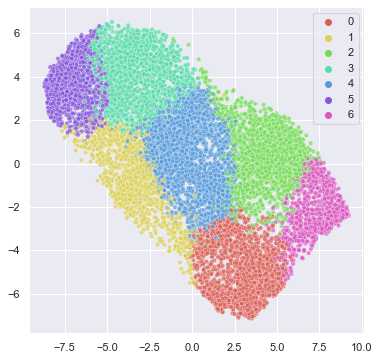

In [791]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=88+2, MN_ratio=0.6187685212521202, FP_ratio=2.2091940784070223, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_test.values, init="random")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# ax.scatter(X_transformed[:, 0], X_transformed[:, 1],
#            cmap="Spectral",
#            c=y_test, s=0.6)
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1],
#            cmap="Spectral",
           palette=sns.color_palette("hls", 7),
           hue=y_test, s=20,alpha=.7)

print(davies_bouldin_score(X_transformed, y_test))

0.9596596455323726
Wall time: 59.6 s


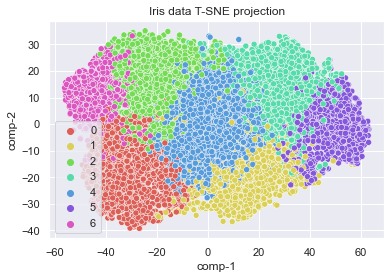

In [792]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0, random_state=123,init='pca',
            learning_rate=166.34416785183936,perplexity=5+46.387968420192266,early_exaggeration=30.50561325686447)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", n_clusters),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

In [793]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 10)
X_test = pca.fit_transform(X_test)
X_test = pd.DataFrame(X_test,index=fuller_indices)
print(("Explained Variance: %s") % (pca.explained_variance_ratio_))

Explained Variance: [0.4522954  0.13640383 0.05852246 0.034067   0.02853116 0.02422969
 0.0211475  0.01688842 0.01546261 0.01418694]


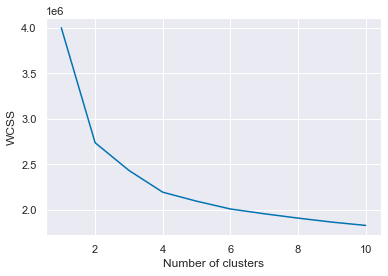

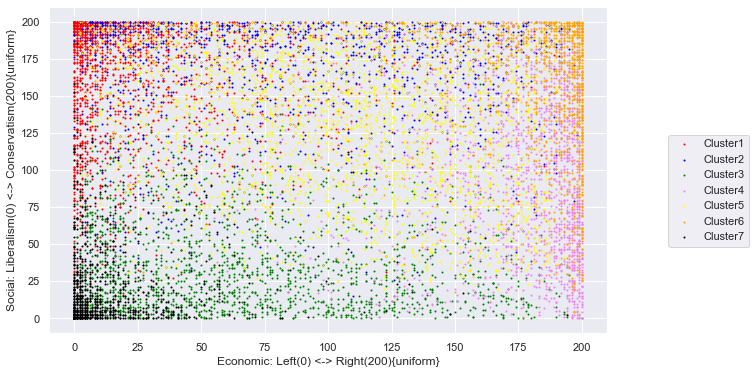

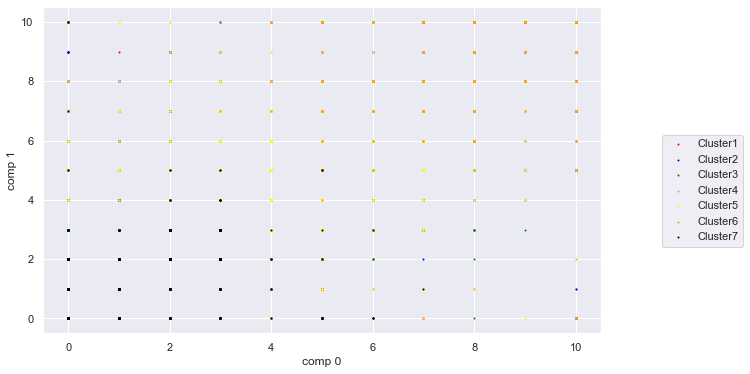

4    2432
0    1940
3    1824
2    1793
5    1361
1    1238
6     999
dtype: int64

In [841]:
# %%time
n_clusters = 7


X = df_simp_imp.apply(lambda x: x.cat.remove_categories("Don't know") if (x.name!='riskScaleW8') and ("Don't know" in x.cat.categories) else x)
X_test = X.apply(lambda x: x.cat.codes if x.dtype=='category' else x)

values_x = pan_dataset_allr_values.columns[0]
values_y = pan_dataset_allr_values.columns[1]
value_df = pan_dataset_allr_values.loc[X_test.index]

from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X_test) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

# X.columns = [0,1]
# X = X.values

kmeans = KMeans(n_clusters = n_clusters, init = "k-means++", random_state = 42)
y_test = kmeans.fit_predict(X_test)

colour_list=  ['red','blue','green','violet','yellow','orange','black']

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(value_df.loc[y_test == cluster, values_x], value_df.loc[y_test == cluster, values_y],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel(pan_dataset_allr_values.columns[0])
plt.ylabel(pan_dataset_allr_values.columns[1])
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.figure(figsize=(10,6));
for cluster in range(0,n_clusters):
    plt.scatter(X_test.loc[y_test == cluster, X_test.columns[0]], X_test.loc[y_test == cluster, X_test.columns[1]],
                s = 1, c = colour_list[cluster], label = 'Cluster'+str(cluster+1))
    
plt.xlabel("comp 0")
plt.ylabel("comp 1")
plt.legend(bbox_to_anchor =(1.1,.625)) 

plt.show()
pd.Series(y_test).value_counts()

0.8850593103948766
Wall time: 31.5 s


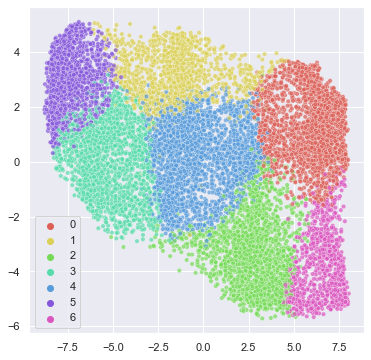

In [797]:
%%time
import pacmap

# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=88+2, MN_ratio=0.6187685212521202, FP_ratio=2.2091940784070223, apply_pca=True) 

# fit the data (The index of transformed data corresponds to the index of the original data)
X_transformed = embedding.fit_transform(X_test.values, init="random")

# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# ax.scatter(X_transformed[:, 0], X_transformed[:, 1],
#            cmap="Spectral",
#            c=y_test, s=0.6)
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1],
#            cmap="Spectral",
           palette=sns.color_palette("hls", 7),
           hue=y_test, s=20,alpha=.7)

print(davies_bouldin_score(X_transformed, y_test))

0.9596596455323726
Wall time: 1min


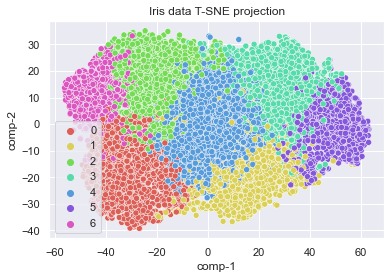

In [798]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0, random_state=123,init='pca',
            learning_rate=166.34416785183936,perplexity=5+46.387968420192266,early_exaggeration=30.50561325686447)
z = tsne.fit_transform(X_test) 


df = pd.DataFrame()
df["y"] = y_test
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2",
                hue=df.y.tolist(),
                palette=sns.color_palette("hls", n_clusters),
                data=df).set(title="Iris data T-SNE projection") 
print(davies_bouldin_score(z, y_test))

In [ ]:


# pd.Series(list(set([x.split("W")[0] for x in X_test.columns]))).sort_values().values

In [806]:
import umap
import trimap

(11587, 2)
Wall time: 16.3 s


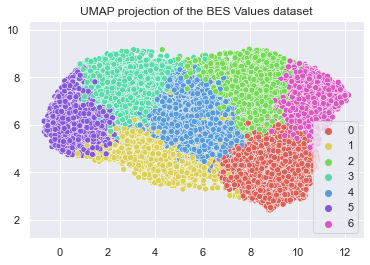

In [817]:
%%time
reducer = umap.UMAP(min_dist = 0.2705453531894932, n_neighbors= 134)
# X_test_std = StandardScaler().fit_transform(X_test)
embedding = reducer.fit_transform(X_test)
print( embedding.shape )

sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1],
                hue=y_test,
                palette=sns.color_palette("hls", n_clusters)).set(title="UMAP projection of the BES Values dataset") 

plt.gca().set_aspect('equal', 'datalim')
print(davies_bouldin_score(embedding, y_test))

0.9254915130130206
Wall time: 9.39 s


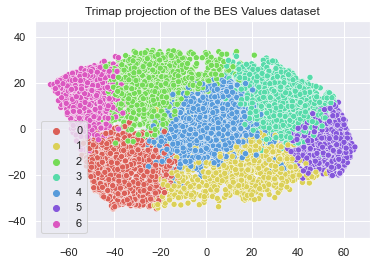

In [827]:
%%time
# 'distance': 0, 'lr': 0.28587089446695935, 'n_inliers': 10.0, 'n_outliers': 6.0, 'n_random': 3.0,
#                     'standardization': 0, 'weight_temp': 0.28672226224267294
embedding = trimap.TRIMAP(distance='euclidean',lr=.28,n_inliers=10,n_outliers=6,n_random=3,weight_temp=.28)\
                    .fit_transform(X_test)

sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1],
                hue=y_test,
                palette=sns.color_palette("hls", n_clusters)).set(title="Trimap projection of the BES Values dataset") 

plt.gca().set_aspect('equal', 'datalim')
print(davies_bouldin_score(embedding, y_test))

In [ ]:
## add standardisation as an option!

In [ ]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
    if params["standardization"]:
        X = StandardScaler().fit_transform(X_test)
    else:
        X = X_test.copy()
    
    reducer = umap.UMAP(**{k:v for k,v in params.items() if k!='standardization'})
    
    return davies_bouldin_score(reducer.fit_transform(X), y_test)

space4knn = {
      'n_neighbors': hp.quniform('n_neighbors', 2,200,1),
      'min_dist':hp.uniform('min_dist', 0.0,0.99),
      # metric - quite a big list here!
      'n_components': 2,
#     'n_neighbors':hp.choice('n_neighbors', range(2,100)),
#     'MN_ratio':0.5,
#     'FP_ratio':2.0,
# #     'apply_pca':True,
#     'apply_pca':hp.choice('apply_pca', [True,False]),
#     'lr':1.0,
# #     'init':'pca',
    
#     'init':hp.choice('init', ['pca','random']),
    
#     'n_components':2,
#     'verbose':0,
#     'random_state':123,
#     'perplexity':hp.uniform('perplexity', 5,50),
#     'early_exaggeration':hp.uniform('early_exaggeration', 3.0,36.0),
#     'learning_rate':hp.uniform('learning_rate',10.0,1000.0),
#     'init':hp.choice('init', ['pca','random']),
    
    'standardization':hp.choice('standardization', [False,True]),
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=20, trials=trials)
print('best:')
print(best)

In [851]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
    if params["standardization"]:
        X = StandardScaler().fit_transform(X_test)
    else:
        X = X_test.copy().values
    #**{k:v for k,v in params.items() if k!='standardization'}
    return davies_bouldin_score(trimap.TRIMAP(n_inliers=int(params['n_inliers']),
                                              n_outliers=int(params['n_outliers']),
                                              n_random=int(params['n_random']),
                                              weight_temp=params['weight_temp'],
                                              lr=params['lr'],
                                              n_iters=params['n_iters'],
                                              distance=params['distance'],
                                              n_dims=params['n_dims'],
                                             )\
                                    .fit_transform(X),
                                        y_test)

space4knn = {
      'n_inliers': hp.quniform('n_inliers', 2,20,1),
      'n_outliers': hp.quniform('n_outliers', 1,10,1),
      'n_random': hp.quniform('n_random', 1,5,1),
      'weight_temp':hp.uniform('weight_temp', 0.0,0.99),
      'lr':hp.uniform('lr', 0.01,0.99),
      'n_iters':400,
      'distance':hp.choice('distance', ['euclidean','manhattan','angular','hamming']),
      # metric - quite a big list here!
      'n_dims': 2,
    
      'standardization':hp.choice('standardization', [False,True]),
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=100, trials=trials)
print('best:')
print(best)

100%|██████████████████████████████████████████████| 100/100 [23:00<00:00, 13.80s/trial, best loss: 0.9087751560550659]
best:
{'distance': 0, 'lr': 0.380693419992037, 'n_inliers': 20.0, 'n_outliers': 8.0, 'n_random': 2.0, 'standardization': 0, 'weight_temp': 0.8436950927711212}


In [829]:
from sklearn.metrics import calinski_harabasz_score
print(calinski_harabasz_score(embedding, y_test))



13849.257779043966


In [856]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def hyperopt_train_test(params):
    
    if params["standardization"]:
        X = StandardScaler().fit_transform(X_test)
    else:
        X = X_test.copy().values
    #**{k:v for k,v in params.items() if k!='standardization'}
    print(params)
    return -calinski_harabasz_score(trimap.TRIMAP(n_inliers=int(params['n_inliers']),
                                              n_outliers=int(params['n_outliers']),
                                              n_random=int(params['n_random']),
                                              weight_temp=params['weight_temp'],
                                              lr=params['lr'],
                                              n_iters=params['n_iters'],
                                              distance=params['distance'],
                                              n_dims=params['n_dims'],
                                             )\
                                    .fit_transform(X),
                                        y_test)

space4knn = {
      'n_inliers': hp.quniform('n_inliers', 2,20,1),
      'n_outliers': hp.quniform('n_outliers', 1,10,1),
      'n_random': hp.quniform('n_random', 1,5,1),
      'weight_temp':hp.uniform('weight_temp', 0.0,0.99),
      'lr':hp.uniform('lr', 0.01,0.99),
      'n_iters':400,
      'distance':hp.choice('distance', ['euclidean','manhattan','angular']),
    # ,'hamming' may be bugged?
      # metric - quite a big list here!
      'n_dims': 2,
    
      'standardization':hp.choice('standardization', [False,True]),
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=100, trials=trials)
print('best:')
print(best)

{'distance': 'euclidean', 'lr': 0.6649002332556609, 'n_dims': 2, 'n_inliers': 12.0, 'n_iters': 400, 'n_outliers': 7.0, 'n_random': 2.0, 'standardization': True, 'weight_temp': 0.6190126378129859}
{'distance': 'angular', 'lr': 0.8603330573820759, 'n_dims': 2, 'n_inliers': 7.0, 'n_iters': 400, 'n_outliers': 7.0, 'n_random': 2.0, 'standardization': False, 'weight_temp': 0.5126696042029254}
{'distance': 'angular', 'lr': 0.8727646723875293, 'n_dims': 2, 'n_inliers': 7.0, 'n_iters': 400, 'n_outliers': 7.0, 'n_random': 1.0, 'standardization': False, 'weight_temp': 0.8690507179779531}
{'distance': 'manhattan', 'lr': 0.9219857256052877, 'n_dims': 2, 'n_inliers': 2.0, 'n_iters': 400, 'n_outliers': 4.0, 'n_random': 3.0, 'standardization': True, 'weight_temp': 0.007591497050171072}
{'distance': 'manhattan', 'lr': 0.019382361624495643, 'n_dims': 2, 'n_inliers': 3.0, 'n_iters': 400, 'n_outliers': 7.0, 'n_random': 4.0, 'standardization': False, 'weight_temp': 0.15967109967416923}
{'distance': 'manhat

{'distance': 'euclidean', 'lr': 0.07038230279632265, 'n_dims': 2, 'n_inliers': 17.0, 'n_iters': 400, 'n_outliers': 3.0, 'n_random': 5.0, 'standardization': False, 'weight_temp': 0.2591396586692488}
{'distance': 'angular', 'lr': 0.17820173429981817, 'n_dims': 2, 'n_inliers': 15.0, 'n_iters': 400, 'n_outliers': 10.0, 'n_random': 2.0, 'standardization': False, 'weight_temp': 0.36344089858731177}
{'distance': 'euclidean', 'lr': 0.6210754137763748, 'n_dims': 2, 'n_inliers': 19.0, 'n_iters': 400, 'n_outliers': 6.0, 'n_random': 3.0, 'standardization': False, 'weight_temp': 0.05014860399881223}
{'distance': 'angular', 'lr': 0.4056524120461832, 'n_dims': 2, 'n_inliers': 9.0, 'n_iters': 400, 'n_outliers': 1.0, 'n_random': 5.0, 'standardization': False, 'weight_temp': 0.19689138208995255}
{'distance': 'euclidean', 'lr': 0.34768796105777705, 'n_dims': 2, 'n_inliers': 6.0, 'n_iters': 400, 'n_outliers': 4.0, 'n_random': 4.0, 'standardization': True, 'weight_temp': 0.14010137054009408}
{'distance': '

{'distance': 'euclidean', 'lr': 0.31090466158913477, 'n_dims': 2, 'n_inliers': 12.0, 'n_iters': 400, 'n_outliers': 3.0, 'n_random': 5.0, 'standardization': False, 'weight_temp': 0.33306054877396696}
{'distance': 'manhattan', 'lr': 0.37114946973776447, 'n_dims': 2, 'n_inliers': 6.0, 'n_iters': 400, 'n_outliers': 1.0, 'n_random': 3.0, 'standardization': False, 'weight_temp': 0.11367967096321266}
{'distance': 'euclidean', 'lr': 0.1386645986783825, 'n_dims': 2, 'n_inliers': 11.0, 'n_iters': 400, 'n_outliers': 3.0, 'n_random': 2.0, 'standardization': True, 'weight_temp': 0.21019675862648413}
{'distance': 'euclidean', 'lr': 0.20213418639760733, 'n_dims': 2, 'n_inliers': 9.0, 'n_iters': 400, 'n_outliers': 5.0, 'n_random': 4.0, 'standardization': False, 'weight_temp': 0.38707362492344766}
{'distance': 'euclidean', 'lr': 0.9878696794596931, 'n_dims': 2, 'n_inliers': 8.0, 'n_iters': 400, 'n_outliers': 2.0, 'n_random': 5.0, 'standardization': False, 'weight_temp': 0.43338019831487584}
{'distance'

0.9100892884380933
Wall time: 19.6 s


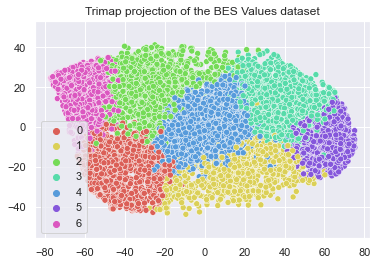

In [857]:
%%time
# {'distance': 0, 'lr': 0.380693419992037, 'n_inliers': 20.0,
#  'n_outliers': 8.0, 'n_random': 2.0, 'standardization': 0, 'weight_temp': 0.8436950927711212}
embedding = trimap.TRIMAP(distance='euclidean',lr=.38,n_inliers=20,n_outliers=8,n_random=2,weight_temp=.84)\
                    .fit_transform(X_test)

sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1],
                hue=y_test,
                palette=sns.color_palette("hls", n_clusters)).set(title="Trimap projection of the BES Values dataset") 

plt.gca().set_aspect('equal', 'datalim')
print(davies_bouldin_score(embedding, y_test))

0.9368106506873228
Wall time: 4.92 s


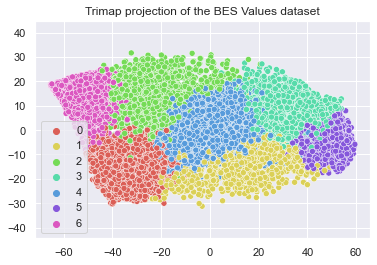

In [858]:
%%time
# {'distance': 0, 'lr': 0.6693581495232805, 'n_inliers': 15.0, 'n_outliers': 1.0,
#  'n_random': 4.0, 'standardization': 0, 'weight_temp': 0.0739833629830095}
embedding = trimap.TRIMAP(distance='euclidean',lr=.67,n_inliers=15,n_outliers=1,n_random=4,weight_temp=.07)\
                    .fit_transform(X_test)

sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1],
                hue=y_test,
                palette=sns.color_palette("hls", n_clusters)).set(title="Trimap projection of the BES Values dataset") 

plt.gca().set_aspect('equal', 'datalim')
print(davies_bouldin_score(embedding, y_test))

In [ ]:
## Jubilee fluff

In [80]:
search(BES_Panel,"ukAttach")

ukAttach1W19    8105
ukAttach2W19    8105
ukAttach3W19    8105
ukAttach4W19    8105
ukAttach5W19    8105
ukAttach6W19    8105
dtype: int64

In [81]:
BES_Panel["ukAttach1W19"].value_counts()

Yes           4593
No            2387
Don't know    1125
Name: ukAttach1W19, dtype: int64

Text(0.5, 1.0, "When someone criticizes Britain, I don't take it as a personal insult.")

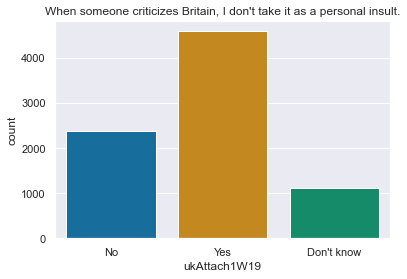

In [89]:
sns.countplot(BES_Panel["ukAttach1W19"]);
plt.title("When someone criticizes Britain, I don't take it as a personal insult.");

In [82]:
BES_Panel["ukAttach2W19"].value_counts()

No            3850
Yes           3003
Don't know    1252
Name: ukAttach2W19, dtype: int64

In [83]:
BES_Panel["ukAttach3W19"].value_counts()

No            4683
Don't know    1811
Yes           1611
Name: ukAttach3W19, dtype: int64

In [84]:
BES_Panel["ukAttach4W19"].value_counts()

Yes           3263
No            2955
Don't know    1887
Name: ukAttach4W19, dtype: int64

In [85]:
BES_Panel["ukAttach5W19"].value_counts()

No            3352
Yes           3239
Don't know    1514
Name: ukAttach5W19, dtype: int64

In [86]:
BES_Panel["ukAttach6W19"].value_counts()

Yes           4760
Don't know    1955
No            1390
Name: ukAttach6W19, dtype: int64

In [95]:
search(BES_Panel,"ethnicity")

discussantEthnicity1W2    24933
discussantEthnicity2W2    18238
discussantEthnicity3W2    13210
p_ethnicityW1             30279
p_ethnicityW2             30160
p_ethnicityW3             28072
p_ethnicityW4             31442
p_ethnicityW5             30822
p_ethnicityW6             30145
p_ethnicityW7             30783
p_ethnicityW8             33443
p_ethnicityW9             30000
p_ethnicityW10            30227
p_ethnicityW11            30925
p_ethnicityW12            34358
p_ethnicityW13            31124
p_ethnicityW14            31015
p_ethnicityW15            30766
p_ethnicityW16            37745
p_ethnicityW17            34013
p_ethnicityW18            37635
p_ethnicityW19            32029
dtype: int64

In [96]:
BES_Panel["ukAttach1W19"].groupby(BES_Panel["p_ethnicityW19"]).value_counts()

p_ethnicityW19              ukAttach1W19
White British               Yes             4164
                            No              2157
                            Don't know      1006
Any other white background  Yes              197
                            No                77
                            Don't know        30
White and Black Caribbean   No                 7
                            Don't know         7
                            Yes                6
White and Black African     Yes                2
                            No                 1
                            Don't know         1
White and Asian             Yes               10
                            No                 8
                            Don't know         4
Any other mixed background  Yes               19
                            No                 8
                            Don't know         5
Indian                      Yes               37
                            

In [120]:
ethnicity_lazy = BES_Panel["p_ethnicityW19"].copy()

ethnicity_lazy = ethnicity_lazy=="White British"
ethnicity_lazy.loc[:] = 1
ethnicity_lazy
# ethnicity_lazy.loc[:] = 1
ethnicity_lazy.loc[BES_Panel["p_ethnicityW19"]=="White British"  ] = 0
ethnicity_lazy.loc[BES_Panel["p_ethnicityW19"]=="Prefer not to say"  ] = np.nan
ethnicity_lazy.loc[BES_Panel["p_ethnicityW19"]=="Any other white background"  ] = np.nan


In [121]:
BES_Panel["ukAttach1W19"].groupby(ethnicity_lazy).value_counts()

p_ethnicityW19  ukAttach1W19
0               Yes             4164
                No              2157
                Don't know      1006
1               Yes              195
                No               135
                Don't know        65
Name: ukAttach1W19, dtype: int64

In [94]:
BES_Panel["ukAttach3W19"].groupby(BES_Panel["p_socgradeW19"]).value_counts()

p_socgradeW19  ukAttach3W19
A              No               794
               Yes              250
               Don't know       216
B              No              1088
               Don't know       360
               Yes              323
C1             No              1199
               Don't know       457
               Yes              430
C2             No               677
               Don't know       300
               Yes              233
D              No               420
               Don't know       228
               Yes              150
E              No               498
               Don't know       246
               Yes              223
Unknown        No                 7
               Don't know         4
               Yes                2
Name: ukAttach3W19, dtype: int64

In [122]:
search(BES_Panel,"monarch")

monarchW8    33502
dtype: int64

In [128]:
(BES_Panel["monarchW8"].groupby(BES_Panel["p_socgradeW8"]).value_counts(normalize=True).round(2)*100).astype(int)

p_socgradeW8  monarchW8                 
A             Strongly agree                 43
              Agree                          25
              Neither agree nor disagree     12
              Strongly disagree              10
              Disagree                        9
              Don't know                      2
B             Strongly agree                 40
              Agree                          25
              Neither agree nor disagree     14
              Strongly disagree              10
              Disagree                       10
              Don't know                      2
C1            Strongly agree                 40
              Agree                          25
              Neither agree nor disagree     14
              Strongly disagree              10
              Disagree                        9
              Don't know                      2
C2            Strongly agree                 43
              Agree                          26

In [129]:
ethnicity_lazy = BES_Panel["p_ethnicityW8"].copy()

ethnicity_lazy = ethnicity_lazy=="White British"
ethnicity_lazy.loc[:] = 1
ethnicity_lazy
# ethnicity_lazy.loc[:] = 1
ethnicity_lazy.loc[BES_Panel["p_ethnicityW8"]=="White British"  ] = 0
ethnicity_lazy.loc[BES_Panel["p_ethnicityW8"]=="Prefer not to say"  ] = np.nan
ethnicity_lazy.loc[BES_Panel["p_ethnicityW8"]=="Any other white background"  ] = np.nan


In [131]:
(BES_Panel["monarchW8"].groupby(ethnicity_lazy).value_counts(normalize=True).round(2)*100).astype(int)

p_ethnicityW8  monarchW8                 
0              Strongly agree                43
               Agree                         25
               Neither agree nor disagree    14
               Strongly disagree              9
               Disagree                       8
               Don't know                     2
1              Agree                         27
               Strongly agree                22
               Neither agree nor disagree    20
               Strongly disagree             13
               Disagree                      10
               Don't know                     8
Name: monarchW8, dtype: int32

In [132]:
search(BES_Panel,"pride")

conPrideW4         31551
labPrideW4         31551
ldPrideW4          31551
snpPrideW4          5426
pcPrideW4           2931
ukipPrideW4        31551
grnPrideW4         31551
conPrideW6         30258
labPrideW6         30258
ldPrideW6          30258
snpPrideW6          5357
pcPrideW6           2879
ukipPrideW6        30258
grnPrideW6         30258
conPrideW14         7632
labPrideW14         7632
ldPrideW14          7632
snpPrideW14          834
pcPrideW14           485
ukipPrideW14        7632
grnPrideW14         7632
britishPrideW15    30842
britishPrideW16    37959
britishPrideW17    34366
dtype: int64

In [133]:
eth_var = "p_ethnicityW16"

ethnicity_lazy = BES_Panel[eth_var].copy()

ethnicity_lazy = ethnicity_lazy=="White British"
ethnicity_lazy.loc[:] = 1
ethnicity_lazy
# ethnicity_lazy.loc[:] = 1
ethnicity_lazy.loc[BES_Panel[eth_var]=="White British"  ] = 0
ethnicity_lazy.loc[BES_Panel[eth_var]=="Prefer not to say"  ] = np.nan
ethnicity_lazy.loc[BES_Panel[eth_var]=="Any other white background"  ] = np.nan


(BES_Panel["britishPrideW16"].groupby(ethnicity_lazy).value_counts(normalize=True).round(2)*100).astype(int)

p_ethnicityW16  britishPrideW16           
0               Agree                         33
                Neither agree nor disagree    24
                Strongly agree                18
                Disagree                      15
                Strongly disagree              7
                Don't know                     3
1               Agree                         28
                Neither agree nor disagree    26
                Strongly agree                15
                Disagree                      12
                Don't know                     9
                Strongly disagree              8
Name: britishPrideW16, dtype: int32

In [134]:
(BES_Panel["britishPrideW16"].groupby(BES_Panel["p_socgradeW16"]).value_counts(normalize=True).round(2)*100).astype(int)

p_socgradeW16  britishPrideW16           
A              Agree                         32
               Neither agree nor disagree    23
               Strongly agree                18
               Disagree                      16
               Strongly disagree              8
               Don't know                     3
B              Agree                         32
               Neither agree nor disagree    26
               Disagree                      16
               Strongly agree                15
               Strongly disagree              8
               Don't know                     4
C1             Agree                         33
               Neither agree nor disagree    25
               Strongly agree                15
               Disagree                      15
               Strongly disagree              8
               Don't know                     4
C2             Agree                         33
               Neither agree nor disagree    2

In [141]:
BES_Panel["p_gross_householdW16"].value_counts()

Prefer not to answer             7338
£20,000 to £24,999 per year      3018
£25,000 to £29,999 per year      2817
£15,000 to £19,999 per year      2805
£10,000 to £14,999 per year      2800
£30,000 to £34,999 per year      2475
£50,000 to £59,999 per year      2047
£35,000 to £39,999 per year      2009
Don't know                       1925
£40,000 to £44,999 per year      1798
£70,000 to £99,999 per year      1792
£5,000 to £9,999 per year        1629
£45,000 to £49,999 per year      1485
£60,000 to £69,999 per year      1353
under £5,000 per year             756
£100,000 to £149,999 per year     690
£150,000 and over                 269
Name: p_gross_householdW16, dtype: int64

In [140]:
(BES_Panel["britishPrideW16"].groupby(BES_Panel["p_gross_householdW16"]).value_counts(normalize=True).round(2)*100).astype(int).head(50)

p_gross_householdW16         britishPrideW16           
under £5,000 per year        Neither agree nor disagree    27
                             Agree                         25
                             Disagree                      16
                             Strongly agree                13
                             Strongly disagree             11
                             Don't know                     8
£5,000 to £9,999 per year    Agree                         28
                             Neither agree nor disagree    26
                             Strongly agree                18
                             Disagree                      13
                             Strongly disagree              9
                             Don't know                     5
£10,000 to £14,999 per year  Agree                         31
                             Neither agree nor disagree    26
                             Strongly agree                21
              

In [137]:
search(BES_Panel,"^p_").head(50)

p_disabilityW1         21129
p_education_ageW1      30379
p_educationW1          30383
p_ethnicityW1          30279
p_gross_householdW1    30362
p_gross_personalW1     30372
p_hh_sizeW1            30381
p_housingW1            30289
p_maritalW1            30316
p_paper_readW1         30383
p_religionW1           30299
p_sexualityW1          23411
p_socgradeW1           30383
p_work_statW1          30383
p_disabilityW2         28142
p_education_ageW2      30239
p_educationW2          30239
p_ethnicityW2          30160
p_gross_householdW2    30235
p_gross_personalW2     30237
p_hh_sizeW2            30238
p_housingW2            30226
p_maritalW2            30229
p_paper_readW2         30239
p_religionW2           30225
p_sexualityW2          29093
p_socgradeW2           30239
p_work_statW2          30239
p_disabilityW3         26834
p_education_ageW3      28119
p_educationW3          28120
p_ethnicityW3          28072
p_gross_householdW3    28120
p_gross_personalW3     28120
p_hh_sizeW3   

In [281]:
search(BES_Panel,"monarch|p_past_vote_2019|wt_new_W19_result|britishPride")

wt_new_W19_result    32177
monarchW8            33502
britishPrideW15      30842
britishPrideW16      37959
britishPrideW17      34366
p_past_vote_2019     28345
dtype: int64

In [280]:
(pd.crosstab( BES_Panel["monarchW8"],BES_Panel["p_past_vote_2019"],values=BES_Panel["wt_new_W19_result"],
            aggfunc=sum,normalize='index' )*100).astype(int)
## "Britain should continue to have a monarchy"

p_past_vote_2019,Conservative,Labour,Liberal Democrat,Scottish National Party (SNP),Plaid Cymru,Green Party,Other,Brexit Party,Don't know
monarchW8,,,,,,,,,
Strongly disagree,20,45,10,14,1,3,1,2,0
Disagree,21,47,12,10,0,2,1,1,1
Neither agree nor disagree,31,40,12,6,1,2,1,2,1
Agree,44,30,13,3,0,2,1,2,1
Strongly agree,65,15,10,1,0,2,1,2,0
Don't know,31,45,6,3,0,3,1,2,4


In [299]:
(pd.crosstab( BES_Panel["britishPrideW17"],BES_Panel["p_past_vote_2019"],values=BES_Panel["wt_new_W19_result"],
            aggfunc=sum,normalize='all' )*100).astype(int)
## "I feel proud to be British"

p_past_vote_2019,Conservative,Labour,Liberal Democrat,Scottish National Party (SNP),Plaid Cymru,Green Party,Other,Brexit Party,Don't know
britishPrideW17,,,,,,,,,
Strongly disagree,1,2,0,1,0,0,0,0,0
Disagree,3,7,2,0,0,0,0,0,0
Neither agree nor disagree,8,9,3,1,0,0,0,0,0
Agree,18,9,3,0,0,0,0,0,0
Strongly agree,11,3,1,0,0,0,0,0,0
Don't know,0,0,0,0,0,0,0,0,0


In [305]:
(pd.crosstab( BES_Panel["britishPrideW17"],pan_dataset_ages["standardAgeGroup_at_W19"],values=BES_Panel["wt_new_W19_result"],
            aggfunc=sum,normalize='all',margins=True )*100).astype(int)
## "I feel proud to be British"

standardAgeGroup_at_W19,18-25,26-35,36-45,46-55,56-65,66+,All
britishPrideW17,,,,,,,
Strongly disagree,1,1,1,1,0,0,6
Disagree,2,2,3,2,1,1,13
Neither agree nor disagree,2,3,5,5,4,4,25
Agree,3,4,6,6,5,7,33
Strongly agree,1,1,2,2,2,5,16
Don't know,1,1,1,0,0,0,5
All,12,13,20,18,15,18,100


In [298]:
(pd.crosstab( BES_Panel["britishPrideW17"],BES_Panel["p_socgradeW19"],values=BES_Panel["wt_new_W19_result"],
            aggfunc=sum,normalize='columns' )*100).astype(int)

p_socgradeW19,A,B,C1,C2,D,E,Unknown
britishPrideW17,,,,,,,
Strongly disagree,6,6,6,4,5,6,6
Disagree,13,16,15,10,12,13,13
Neither agree nor disagree,24,24,24,25,26,27,20
Agree,34,34,34,35,30,27,34
Strongly agree,17,15,14,17,16,19,7
Don't know,3,3,4,5,8,6,16


In [295]:
pan_dataset_ages.index = BES_Panel.index

In [296]:
pan_dataset_ages

,Age_at_W1_rounded,Age_at_W1,Age_at_W2,Age_at_W3,Age_at_W4,Age_at_W5,Age_at_W6,Age_at_W7,Age_at_W8,Age_at_W9,...,standardAgeGroup_at_W1,equalisedAgeGroup_at_W1,equalisedAgeGroup_at_W1_detailed,equalLengthAgeGroup_at_W1,standardAgeGroup_at_W19,equalisedAgeGroup_at_W19,equalisedAgeGroup_at_W19_detailed,equalLengthAgeGroup_at_W19,rough_predictions,Age_at_W1_missing_values
id,,,,,,,,,,,,,,,,,,,,,
1,58,57.850863,57.855603,58.335336,58.833221,58.909397,58.970528,59.900456,60.019697,60.106970,...,56-65,"(57.0, 65.0]","(57.0, 61.0]","(55, 60]",56-65,"(63.0, 71.0]","(63.0, 67.0]","(60, 65]",61.709015,57.872400
2,62,61.847247,61.851987,62.331720,62.829605,62.905781,62.966912,63.896840,64.016081,64.103355,...,56-65,"(57.0, 65.0]","(61.0, 65.0]","(60, 65]",66+,"(63.0, 71.0]","(67.0, 71.0]","(65, 70]",61.180430,61.868784
3,76,75.812681,75.817421,76.297154,76.795039,76.871215,76.932346,77.862274,77.981515,78.068788,...,66+,"(65.0, 100.0]","(69.0, 100.0]","(75, 80]",66+,"(71.0, 106.0]","(75.0, 106.0]","(80, 85]",71.241910,75.834218
4,51,50.984062,50.988802,51.468535,51.966419,52.042595,52.103727,53.033655,53.152896,53.240169,...,46-55,"(49.0, 57.0]","(49.0, 54.0]","(50, 55]",56-65,"(55.0, 63.0]","(55.0, 59.0]","(55, 60]",50.193882,51.005599
5,68,67.984062,67.988802,68.468535,68.966419,69.042595,69.103727,70.033655,70.152896,70.240169,...,66+,"(65.0, 100.0]","(65.0, 69.0]","(65, 70]",66+,"(71.0, 106.0]","(71.0, 75.0]","(70, 75]",67.017960,68.005599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,23,23.378732,23.383472,23.863205,24.361089,24.437265,24.498397,25.428324,25.547566,25.634839,...,18-25,"(22.0, 31.0]","(22.0, 27.0]","(20, 25]",26-35,"(28.0, 37.0]","(28.0, 33.0]","(25, 30]",28.690456,23.400269
98448,24,24.378732,24.383472,24.863205,25.361089,25.437265,25.498397,26.428324,26.547566,26.634839,...,18-25,"(22.0, 31.0]","(22.0, 27.0]","(20, 25]",26-35,"(28.0, 37.0]","(28.0, 33.0]","(30, 35]",15.019540,24.400269
98449,30,30.331278,30.336018,30.815751,31.313636,31.389812,31.450943,32.380871,32.500112,32.587385,...,26-35,"(22.0, 31.0]","(27.0, 31.0]","(25, 30]",36-45,"(28.0, 37.0]","(33.0, 37.0]","(35, 40]",33.571175,30.352815


In [ ]:
### mass imputation!

In [ ]:
X_varset.loc[fuller_indices,fuller_columns].replace("Don't know",np.nan).isnull().sum().sum()/(len(fuller_indices)*len(fuller_columns)),pd.Series(fuller_columns).head(50)

In [1044]:
var_type.loc["redistSelfW1","type"]

1

In [677]:
# 5 cols -> 7 mins
# 7*len(fuller_columns)/5
fuller_columns[0:1]
df_simp[target_var].replace(target_var_replace_dict) 

id
2          8
3          5
7          2
8          8
15       NaN
        ... 
50916    NaN
50919    NaN
50971    NaN
50998    NaN
51026    NaN
Name: redistSelfW1, Length: 11587, dtype: category
Categories (11, object): ['Government should try to make incomes equal' < '1' < '2' < '3' ... '7' < '8' < '9' < 'Government should be less concerned about equ...]

In [ ]:
df_simp = X_varset.loc[fuller_indices,fuller_columns].replace("Don't know",np.nan)
df_simp_imp = df_simp.copy()
metric_dict = {}

In [919]:
X_varset = BES_Panel[match(BES_Panel,"al\dW|lr\dW|redistSelf|locus\d|tolUncertain|riskScale|riskTaking|ethno|aom|competitiveness|benevolentSexism|hostileSexism|community|incremental|discrim|sdo|groupempathy|empathy|childvalues|zerosum|auth|socialDes|traditionalism|respectAuth").index]
# X_varset = X_varset[search(BES_Panel,"redistSelf").index]
df_simp = X_varset.replace("Don't know",np.nan)
df_simp_imp = df_simp.copy()
metric_dict = {}
fuller_columns = X_varset.columns

In [920]:
X_varset.shape

(97006, 228)

2

In [939]:
# %%time

for target_var in [fuller_columns[30]]:

    mask = df_simp[target_var].notnull()

    # target_var = fuller_columns[0]
    target_var_replace_dict = {}
    target_var_drop_list = []
    target_var_title_pair = None

    var_stub = target_var
    min_features = 30
#     drop_std_thresh = .1
    drop_vars = []
    specific_vars = []


#     ### def on variable type
    if (df_simp[target_var].dtype.name=="category") and (len(df_simp[target_var].cat.categories)>2):
        multi_class_target = True
        eval_metric = 'mlogloss'
        inv_wt_classes = True
        alg = get_xgboost_alg(classification_problem=multi_class_target,
                     max_depth=5,learning_rate=.028,min_child_weight=5,subsample=.1)            
        
    elif (df_simp[target_var].dtype.name=="category") and (len(df_simp[target_var].cat.categories)==2):
        
        multi_class_target = False
        inv_wt_classes = True
        objective = "binary:logistic"
#         eval_metric = 'mlogloss'
        eval_metric = 'logloss'
        alg = get_xgboost_alg(classification_problem=multi_class_target,
                     max_depth=5,learning_rate=.028,min_child_weight=5,subsample=.1,)        
        
# objective = "binary:logistic"        
    elif (df_simp[target_var].dtype.name=="category") and (len(df_simp[target_var].cat.categories)==1):
        print("Categorical variable with only one category!")
        continue

    else:
#         alg = get_xgboost_alg(classification_problem=False)
        multi_class_target = False
        eval_metric = 'rmse'
        alg = get_xgboost_alg(classification_problem=multi_class_target,
                     max_depth=5,learning_rate=.028,min_child_weight=5,subsample=.1)

    
    
    

    # find variables with no coverage/variation in focal instances (mask)
    df_pred = prep_dataset_only(df_simp,
                                target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
           var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                                multi_class_target=multi_class_target,)
    
    if multi_class_target:
        corrs = df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan))
    else:
        corrs = df_pred.corrwith(df_pred[target_var])
    print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.1].index))
    df_pred = df_pred[list(set(list(corrs[corrs.abs()>.1].index)+[target_var]))]
    
    
#     stds = df_pred[mask].std()
#     df_pred[mask].std()[df_pred[mask].std()<1].hist(bins=100)

#     low_var_list = list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
    # temp = ["(".join(x.split("(")[:-1]) if (x not in BES_label_list[ge].values() and "(" in x) else x for x in low_var_list]
    # reverse_label_list = {v:k for k,v in BES_label_list[ge].items()}


    # drop_vars = drop_vars + list(set([reverse_label_list[x]  if x in BES_label_list[ge].values() else x for x in temp]))
    # drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

#     (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = prep_dataset(df_simp,target_var,target_var_replace_dict,
#                                                                                          target_var_drop_list,target_var_title_pair,
#            var_stub,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,
#                                                             alg=alg,multi_class_target=multi_class_target,specific_vars=False)

    colname = var_stub
    if target_var_title_pair is not None:
        title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
    else:
        title = ""
    var_list = [var_stub]
    var_stub_list = [var_stub,]        
        
#     if wt_col =="wt":
#         wt_cols = ["wt"]
#         wt_ser = df_simp["wt"]
#     else:
#         wt_cols = ["wt",wt_col]
#         wt_ser = df_simp[wt_col]        
#     mask = df_pred[var_stub].notnull()# & df_simp[wt_col].notnull()

#          'max_depth':5,
#          'learning_rate':0.028,    
#          'min_child_weight':5,
#          'subsample':0.1,



    
    if inv_wt_classes:
        freq = df_pred.loc[mask,target_var].value_counts(normalize=True)
        wts = df_pred.loc[mask,target_var].apply(lambda x: 1/freq[x]).astype(float)
    else:
        wts = df_pred.loc[mask,target_var].notnull().astype(float)    
    
    (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
        xgboost_run(subdir=colname,dataset=df_pred[mask],
#                     .drop(wt_cols,axis=1),
                var_list=var_list,var_stub_list=var_stub_list,
                use_specific_weights=wts,
                min_features = min(df_pred.shape[1]-1,min_features),verbosity=0,
                skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
                title = title,print_shap_chart=False)
    
#     return (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)        
    
    
    # setup df back up
#     df_pred = prep_dataset_only(df_simp,
#                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
#            var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,multi_class_target=multi_class_target,)
    # use fitted algorithm to predict values

    df_simp_imp[target_var] = pd.Series(alg.predict(df_pred[train_columns]),index = df_simp.index)
    metric_dict[target_var] = metrics

# kind_of_school1l_pred = pd.Series(alg.predict(df_pred[train_columns]),index=f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"kind_of_school1l"].index)

# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

reduction: (97006, 1415) 187
MSE: 0.15, MAE: 0.32, EV: 0.39, R2: 0.37


In [938]:
df_simp[target_var]

id
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
        ... 
98447    NaN
98448    NaN
98449    NaN
98450    NaN
98451    NaN
Name: auth1W7, Length: 97006, dtype: category
Categories (2, object): ['Independence' < 'Respect for elders']

In [934]:
df_pred[target_var].value_counts()

1.0    4188
0.0    2918
Name: auth1W7, dtype: int64

In [926]:
df_simp[target_var]

id
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
        ... 
98447    NaN
98448    NaN
98449    NaN
98450    NaN
98451    NaN
Name: auth1W7, Length: 97006, dtype: category
Categories (2, object): ['Independence' < 'Respect for elders']

In [912]:
BES_Panel[target_var].value_counts()

Respect for elders    4188
Independence          2918
Don't know             723
Name: auth1W7, dtype: int64

In [914]:
list(fuller_columns).index(target_var)

30

In [918]:
# df_simp_imp_backup = df_simp_imp.copy()

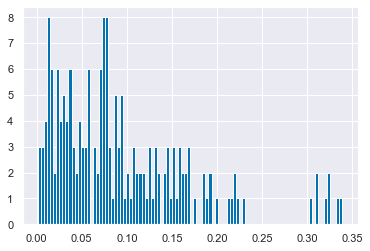

In [895]:
df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan)).abs().sort_values().hist(bins=100)

In [906]:
print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.05].index))

reduction: (97006, 393) 392


In [888]:
df_pred.shape

(97006, 181)

In [904]:
8*60/128

3.75

In [875]:
128*10/60

21.333333333333332

In [ ]:
## high density dataset with only 10,000 entries!
# 10 cols, 14 mins (ACC .34)
# 100 cols, 2h 16mins

## normal length dataset with value columns
# (97006, 228)
# 1 cols, 10 mins (ACC .36)

## what if we process the dataset by variable set chunks (selfRedistW1 .... )
# (97006, 16) -> df_pred (97006, 181)
# 1 col, 1min 20s (ACC .32)

## don't do it manually, how about just include columns with corr >.1
# reduction: (97006, 1406) 192
# 2min 4s (ACC: 0.33,  F1: 0.33)

# reduction: (97006, 1406) 392
# Wall time: 4min 5s (ACC: 0.33,  F1: 0.33)

In [722]:
metric_dict

{'redistSelfW1': (0.34420015163002277, 0.34420015163002277),
 'redistSelfW2': (0.36213841083852066, 0.3621384108385207),
 'redistSelfW3': (0.3912261776339446, 0.3912261776339446),
 'redistSelfW4': (0.39773442416614224, 0.3977344241661422),
 'redistSelfW6': (0.38974201474201475, 0.38974201474201475),
 'lr1W6': (0.638905238375515, 0.638905238375515),
 'lr2W6': (0.7047508015155931, 0.7047508015155931),
 'lr3W6': (0.6885389326334208, 0.6885389326334208),
 'lr4W6': (0.683584686774942, 0.683584686774942),
 'lr5W6': (0.6527575138605194, 0.6527575138605194),
 'al1W6': (0.6328630217519107, 0.6328630217519107),
 'al2W6': (0.6909413854351687, 0.6909413854351687),
 'al3W6': (0.6602787456445993, 0.6602787456445993),
 'al4W6': (0.5743499853929301, 0.5743499853929301),
 'al5W6': (0.6931851418543433, 0.6931851418543433),
 'ethno1W7': (0.4281798245614035, 0.4281798245614035),
 'ethno2W7': (0.5476973684210527, 0.5476973684210527),
 'ethno3W7': (0.5531857451403888, 0.5531857451403888),
 'ethno4W7': (0.49

In [734]:
from pandas.api.types import CategoricalDtype
df_simp_imp = df_simp_imp.apply(lambda x: x.astype(CategoricalDtype(df_simp[x.name].cat.categories, ordered=True)) if x.name!='riskScaleW8' else x)
df_simp_imp.to_pickle(BES_small_data_files + "imputed_data1"+".zip", compression='zip')
accuracy_ser = pd.Series(metric_dict).apply(lambda x: x[0])
accuracy_ser.to_pickle(BES_small_data_files + "accuracy_ser1"+".zip", compression='zip')

## saved!

In [750]:
df_simp_imp = pd.read_pickle(BES_small_data_files + "imputed_data1"+".zip", compression='zip')

In [ ]:
# ACC: 0.36,  F1: 0.36

In [652]:

def get_xgboost_alg(learning_rate =0.05,
     n_estimators= 500,
     max_depth=6,
     min_child_weight=6,
     gamma=0.00065, # aka min_split_loss
     subsample=0.8,
     colsample_bytree=0.7,
     colsample_bylevel=.9,
     colsample_bynode=.85,
     objective= 'reg:squarederror',
   #  scale_pos_weight=1.09,
     reg_alpha=1.075,
     reg_lambda=1.011,
     sketch_eps=0.0,
     refresh_leaf=0,
     nthread=8,
     n_jobs =8,
     random_state=27**2, 
     classification_problem = False):
     
    if classification_problem==False:
        alg = XGBRegressor(
         learning_rate =learning_rate,
         n_estimators= n_estimators,
         max_depth = max_depth,
         min_child_weight = min_child_weight,
         gamma = gamma,
         subsample = subsample,
         colsample_bytree = colsample_bytree,
         colsample_bylevel = colsample_bylevel,
         colsample_bynode = colsample_bynode,
         objective = objective,
      #   scale_pos_weight = scale_pos_weight,
         reg_alpha=reg_alpha,
         reg_lambda=reg_lambda,
         sketch_eps=sketch_eps,
         refresh_leaf=refresh_leaf,
         nthread = nthread,
         n_jobs  = n_jobs ,
         random_state = random_state)
    else:
        alg = XGBClassifier(
         learning_rate =learning_rate,
         n_estimators= n_estimators,
         max_depth = max_depth,
         min_child_weight = min_child_weight,
         gamma = gamma,
         subsample = subsample,
         colsample_bytree = colsample_bytree,
         colsample_bylevel = colsample_bylevel,
         colsample_bynode = colsample_bynode,
         objective = objective,
      #   scale_pos_weight = scale_pos_weight,
         reg_alpha=reg_alpha,
         reg_lambda=reg_lambda,
         sketch_eps=sketch_eps,
         refresh_leaf=refresh_leaf,
         nthread = nthread,
         n_jobs  = n_jobs ,
         random_state = random_state)        
    return alg

In [993]:
%%time
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

target_var = fuller_columns[0]

mask = df_simp[target_var].notnull()

# target_var = fuller_columns[0]
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = None

var_stub = target_var
min_features = 30
#     drop_std_thresh = .1
drop_vars = []
specific_vars = []


### def on variable type
if df_simp[target_var].dtype.name=="category":
    alg = get_xgboost_alg(classification_problem=True)
    multi_class_target = True
else:
    alg = get_xgboost_alg(classification_problem=False)
    multi_class_target = False

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_dataset_only(df_simp,
                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                            multi_class_target=multi_class_target,)

df_pred = df_pred[search(df_pred,"redistSelf").index]

# if multi_class_target:
#     corrs = df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan))
# else:
#     corrs = df_pred.corrwith(df_pred[target_var])
# print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.1].index))
# df_pred = df_pred[list(set(list(corrs[corrs.abs()>.1].index)+[target_var]))]


colname = var_stub
if target_var_title_pair is not None:
    title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
else:
    title = ""
var_list = [var_stub]
var_stub_list = [var_stub,]   

eval_metric = 'mlogloss'

def hyperopt_train_test(params):
    alg = get_xgboost_alg(classification_problem=multi_class_target,
                         max_depth = int(params["max_depth"]),
                         n_estimators =int(params['n_estimators']),
                         min_child_weight=int(params['min_child_weight']),
                          
                         reg_alpha = int(params['reg_alpha']),
                         reg_lambda = int(params['reg_lambda']), 
                         gamma = int(params["max_depth"]),  
                         colsample_bytree=params['colsample_bytree'], 
                         
                         learning_rate=params['learning_rate'], 
                         subsample=  params['subsample'],
                         colsample_bylevel = params['colsample_bylevel'],
                         colsample_bynode = params['colsample_bynode'],
                          
                         )
    if params["inv_wt_classes"]:
        freq = df_pred.loc[mask,target_var].value_counts(normalize=True)
        wts = df_pred.loc[mask,target_var].apply(lambda x: 1/freq[x]).astype(float)
    else:
        wts = df_pred.loc[mask,target_var].notnull().astype(float)
    
    (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
        xgboost_run(subdir=colname,dataset=df_pred[mask],
                var_list=var_list,var_stub_list=var_stub_list,
                use_specific_weights=wts,
                min_features = min(df_pred.shape[1]-1,min_features),verbosity=0,
                skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
                title = title,print_shap_chart=False)
    print("********")

    
    predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories)
    pred_dist = predictions[df_simp[target_var].isnull()].value_counts(normalize=True).sort_index()
    gt_dist = df_pred[target_var].value_counts(normalize=True).sort_index()
    
    err_dist = (pred_dist - gt_dist).apply(lambda x: x**2).sum()/gt_dist.shape[0]    
#     MSE = mean_squared_error(y_test, predictions)
#     MAE = mean_absolute_error(y_test, predictions)
#     EV = explained_variance_score(y_test, predictions)
#     R2 = r2_score(y_test, predictions)

#     print("MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2) )        
    print(params)
    display(pred_dist)
#     display(gt_dist)
    print("err_dist:",err_dist)
    return -metrics[0]+(err_dist*10)

space4knn = {
    
#     max_depth=5,learning_rate=.028,min_child_weight=5,subsample=.1
    
#         'learning_rate':hp.uniform('learning_rate', .005,.5),
        'learning_rate':hp.uniform('learning_rate', .005,.5),
        'max_depth':hp.quniform("max_depth", 1, 7, 1),
        'min_child_weight':hp.quniform("min_child_weight", 0, 10, 1),
        'subsample':hp.uniform('subsample', .01,.99),
    
        
    

    #hp.uniform('learning_rate', .001,.1),
    #0.05,
         'n_estimators': 500,
    
    #hp.quniform("max_depth", 1, 6, 1),    
#          'max_depth':5,
#          'learning_rate':0.028,    
#          'min_child_weight':5,
#          'subsample':0.1,
    
    #hp.quniform("min_child_weight", 0, 10, 1),
         'gamma':hp.uniform ('gamma', 0,9),
    #0.00065, # aka min_split_loss

    # hp.uniform("subsample", 0.05, .95),
    #0.8,
         'colsample_bytree':hp.uniform('colsample_bytree', .5,.99),
    #0.7,
         'colsample_bylevel':hp.uniform('colsample_bylevel', .5,.99),
    #.9,
         'colsample_bynode':hp.uniform('colsample_bynode', .5,.99),
#     .85,
#          'objective= 'reg:squarederror',
       #  scale_pos_weight=1.09,
         'reg_alpha': hp.quniform('reg_alpha', 1,180,1),
    #1.075,
         'reg_lambda':hp.uniform('reg_lambda', 0,2),
    #1.011,    
         'inv_wt_classes': True,
    # hp.choice("inv_wt_classes",[False,True]),
    
#         'max_depth': hp.quniform("max_depth", 1, 6, 1),
#         'gamma': hp.uniform ('gamma', 0,9),
#         'reg_alpha' : hp.quniform('reg_alpha', 1,180,1),
#         'reg_lambda' : hp.uniform('reg_lambda', 0,2),
#         'colsample_bytree' : hp.uniform('colsample_bytree', 0.25,1),
#         'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
    
#      learning_rate =hp.uniform('learning_rate',.0001,.1),
#         'n_estimators': hp.quniform('n_estimators', 10,500,1),
#      max_depth=hp.quniform('max_depth', 1,10,1),
#      min_child_weight=hp.quniform('min_child_weight', 1,10,1),

#      subsample=hp.uniform('subsample', .25,.95),
#      objective= 'reg:squarederror',
    
#      gamma=0.00065, # aka min_split_loss    
#      colsample_bytree=0.7,
#      colsample_bylevel=.9,
#      colsample_bynode=.85,
     
#      scale_pos_weight=1.09,
#      reg_alpha=1.075,
#      reg_lambda=1.011,
#      sketch_eps=0.0,
#      refresh_leaf=0,
#      nthread=8,
#      n_jobs =8,
#      random_state=27**2,     
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=300, trials=trials)
print('best:')
print(best)

ACC: 0.32,  F1: 0.32                                                                                                   
[14:56:01] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9480440179677987, 'colsample_bynode': 0.9571772791705693, 'colsample_bytree': 0.7254865115816034, 'gamma': 4.832809218687244, 'inv_wt_classes': True, 'learning_rate': 0.03770804354262279, 'max_depth': 7.0, 'min_child_weight': 3.0, 'n_estimators': 500, 'reg_alpha': 62.0, 'reg_lambda': 1.9507813374374836, 'subsample': 0.5665402865116825}
  0%|                                                                          | 0/300 [03:02<?, ?trial/s, best loss=?]

Government should try to make incomes equal                0.755052
1                                                          0.019679
2                                                          0.023790
3                                                          0.029419
4                                                          0.031782
5                                                          0.045403
6                                                          0.034933
7                                                          0.012160
8                                                          0.016428
9                                                          0.008737
Government should be less concerned about equal incomes    0.022616
dtype: float64

err_dist:                                                                                                              
0.03332780748582297                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[14:58:34] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7814617523215993, 'colsample_bynode': 0.9378554405697037, 'colsample_bytree': 0.7446292686336226, 'gamma': 2.382510055229274, 'inv_wt_classes': True, 'learning_rate': 0.09720924923697144, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.754365
1                                                          0.018892
2                                                          0.024478
3                                                          0.029519
4                                                          0.031725
5                                                          0.046463
6                                                          0.035836
7                                                          0.011315
8                                                          0.008737
9                                                          0.016528
Government should be less concerned about equal incomes    0.022143
dtype: float64

err_dist:                                                                                                              
0.03329950875416341                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[14:59:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8373955970964735, 'colsample_bynode': 0.5961561079126594, 'colsample_bytree': 0.510471619024246, 'gamma': 7.249677148879081, 'inv_wt_classes': True, 'learning_rate': 0.3914167671726187, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimators'

Government should try to make incomes equal                0.046320
1                                                          0.012518
2                                                          0.024993
3                                                          0.014509
4                                                          0.015454
5                                                          0.824002
6                                                          0.012833
7                                                          0.010814
8                                                          0.006746
9                                                          0.010785
Government should be less concerned about equal incomes    0.021026
dtype: float64

err_dist:                                                                                                              
0.04670584361235474                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[14:59:35] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6854348381591974, 'colsample_bynode': 0.7762560574147415, 'colsample_bytree': 0.8016422134241604, 'gamma': 3.5180064462210976, 'inv_wt_classes': True, 'learning_rate': 0.3737838258913174, 'max_depth': 2.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.047738
1                                                          0.024821
2                                                          0.016643
3                                                          0.030522
4                                                          0.030350
5                                                          0.767742
6                                                          0.021799
7                                                          0.014194
8                                                          0.005844
9                                                          0.017030
Government should be less concerned about equal incomes    0.023317
dtype: float64

err_dist:                                                                                                              
0.03946197242705291                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[14:59:59] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7892586603438423, 'colsample_bynode': 0.7226798995395014, 'colsample_bytree': 0.7322074822464033, 'gamma': 2.2588557274170618, 'inv_wt_classes': True, 'learning_rate': 0.4017722936351262, 'max_depth': 5.0, 'min_child_weight': 9.0, 'n_estimator

Government should try to make incomes equal                0.754780
1                                                          0.018304
2                                                          0.022873
3                                                          0.029204
4                                                          0.032785
5                                                          0.047824
6                                                          0.038815
7                                                          0.010713
8                                                          0.013148
9                                                          0.008694
Government should be less concerned about equal incomes    0.022859
dtype: float64

err_dist:                                                                                                              
0.033292120390411524                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:00:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7848141108503051, 'colsample_bynode': 0.8767533956126138, 'colsample_bytree': 0.900612570371352, 'gamma': 3.8037971922808085, 'inv_wt_classes': True, 'learning_rate': 0.11050282051964852, 'max_depth': 2.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.047809
1                                                          0.025709
2                                                          0.014896
3                                                          0.031109
4                                                          0.030966
5                                                          0.754422
6                                                          0.035535
7                                                          0.013635
8                                                          0.006030
9                                                          0.016743
Government should be less concerned about equal incomes    0.023146
dtype: float64

err_dist:                                                                                                              
0.037874328372789604                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:01:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7445316943302108, 'colsample_bynode': 0.7046277096305014, 'colsample_bytree': 0.9097346902922636, 'gamma': 2.6635160136634743, 'inv_wt_classes': True, 'learning_rate': 0.07136734469253546, 'max_depth': 4.0, 'min_child_weight': 1.0, 'n_estimato

Government should try to make incomes equal                0.047637
1                                                          0.017373
2                                                          0.024392
3                                                          0.029963
4                                                          0.031539
5                                                          0.754551
6                                                          0.034589
7                                                          0.012131
8                                                          0.008236
9                                                          0.016400
Government should be less concerned about equal incomes    0.023189
dtype: float64

err_dist:                                                                                                              
0.03786407292038769                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:02:04] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6323367386885049, 'colsample_bynode': 0.9461258900968652, 'colsample_bytree': 0.5579527894943874, 'gamma': 4.7170197429380245, 'inv_wt_classes': True, 'learning_rate': 0.13528481360285297, 'max_depth': 2.0, 'min_child_weight': 8.0, 'n_estimato

Government should try to make incomes equal                0.047193
1                                                          0.024807
2                                                          0.014910
3                                                          0.030980
4                                                          0.030751
5                                                          0.757903
6                                                          0.036208
7                                                          0.014437
8                                                          0.006116
9                                                          0.013521
Government should be less concerned about equal incomes    0.023174
dtype: float64

err_dist:                                                                                                              
0.038270751076782454                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:02:54] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8714246132117225, 'colsample_bynode': 0.9195619850117163, 'colsample_bytree': 0.8104830874611195, 'gamma': 4.557597279865886, 'inv_wt_classes': True, 'learning_rate': 0.02021326460260803, 'max_depth': 5.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.048411
1                                                          0.017130
2                                                          0.023847
3                                                          0.030178
4                                                          0.031754
5                                                          0.753176
6                                                          0.034618
7                                                          0.014437
8                                                          0.006116
9                                                          0.016528
Government should be less concerned about equal incomes    0.023804
dtype: float64

err_dist:                                                                                                              
0.03767267156199021                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:04:51] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8665614731610443, 'colsample_bynode': 0.5597818203139835, 'colsample_bytree': 0.7617368265919192, 'gamma': 8.098381943304611, 'inv_wt_classes': True, 'learning_rate': 0.01198164704470587, 'max_depth': 5.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.048884
1                                                          0.015812
2                                                          0.024778
3                                                          0.029777
4                                                          0.031281
5                                                          0.766955
6                                                          0.022372
7                                                          0.013950
8                                                          0.007305
9                                                          0.015068
Government should be less concerned about equal incomes    0.023819
dtype: float64

err_dist:                                                                                                              
0.0393029701234986                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:06:14] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5159062233263385, 'colsample_bynode': 0.6574592051252032, 'colsample_bytree': 0.8844576430283535, 'gamma': 2.1835825217533804, 'inv_wt_classes': True, 'learning_rate': 0.46150423498871923, 'max_depth': 2.0, 'min_child_weight': 3.0, 'n_estimato

Government should try to make incomes equal                0.753964
1                                                          0.043584
2                                                          0.014538
3                                                          0.012518
4                                                          0.033974
5                                                          0.047423
6                                                          0.036609
7                                                          0.010098
8                                                          0.007806
9                                                          0.017717
Government should be less concerned about equal incomes    0.021771
dtype: float64

err_dist:                                                                                                              
0.033506684587702035                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:06:28] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7389112728118283, 'colsample_bynode': 0.7467926326609406, 'colsample_bytree': 0.7531202063942978, 'gamma': 1.3994618680987743, 'inv_wt_classes': True, 'learning_rate': 0.3144233615487681, 'max_depth': 5.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.754193
1                                                          0.028760
2                                                          0.013406
3                                                          0.033157
4                                                          0.029304
5                                                          0.047881
6                                                          0.035707
7                                                          0.012318
8                                                          0.016185
9                                                          0.006803
Government should be less concerned about equal incomes    0.022286
dtype: float64

err_dist:                                                                                                              
0.03322626723602507                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:06:56] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5540280008952206, 'colsample_bynode': 0.5774916855999249, 'colsample_bytree': 0.8485140619775176, 'gamma': 0.28517177933388294, 'inv_wt_classes': True, 'learning_rate': 0.10125705067038042, 'max_depth': 6.0, 'min_child_weight': 2.0, 'n_estimat

Government should try to make incomes equal                0.755024
1                                                          0.018820
2                                                          0.024363
3                                                          0.030135
4                                                          0.031725
5                                                          0.044544
6                                                          0.035535
7                                                          0.011974
8                                                          0.010713
9                                                          0.015512
Government should be less concerned about equal incomes    0.021656
dtype: float64

err_dist:                                                                                                              
0.03337657192769649                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:07:46] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5554145084589776, 'colsample_bynode': 0.6448124779417794, 'colsample_bytree': 0.5594580119408316, 'gamma': 8.409292258048179, 'inv_wt_classes': True, 'learning_rate': 0.3184163393717825, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.754293
1                                                          0.028474
2                                                          0.014566
3                                                          0.030307
4                                                          0.032470
5                                                          0.045990
6                                                          0.036093
7                                                          0.010384
8                                                          0.008808
9                                                          0.016815
Government should be less concerned about equal incomes    0.021799
dtype: float64

err_dist:                                                                                                              
0.033348402881184666                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:08:09] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8250875342368815, 'colsample_bynode': 0.9509668372041289, 'colsample_bytree': 0.9305242440384578, 'gamma': 4.353580864010176, 'inv_wt_classes': True, 'learning_rate': 0.25227001389448256, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.759593
1                                                          0.012776
2                                                          0.025910
3                                                          0.029276
4                                                          0.032069
5                                                          0.064925
6                                                          0.024965
7                                                          0.010828
8                                                          0.009181
9                                                          0.008322
Government should be less concerned about equal incomes    0.022157
dtype: float64

err_dist:                                                                                                              
0.033675884501395886                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:08:23] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6311176968342705, 'colsample_bynode': 0.8306802275854239, 'colsample_bytree': 0.6996344564141486, 'gamma': 8.418130296390347, 'inv_wt_classes': True, 'learning_rate': 0.35726690300949265, 'max_depth': 3.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.047136
1                                                          0.018892
2                                                          0.024922
3                                                          0.027958
4                                                          0.032384
5                                                          0.753104
6                                                          0.036208
7                                                          0.012446
8                                                          0.015182
9                                                          0.009210
Government should be less concerned about equal incomes    0.022558
dtype: float64

err_dist:                                                                                                              
0.03766585299899573                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:08:42] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7938286030453585, 'colsample_bynode': 0.6466655890997994, 'colsample_bytree': 0.52550409727309, 'gamma': 4.04465061785942, 'inv_wt_classes': True, 'learning_rate': 0.24656297514495573, 'max_depth': 4.0, 'min_child_weight': 0.0, 'n_estimators':

Government should try to make incomes equal                0.754909
1                                                          0.018978
2                                                          0.024105
3                                                          0.029562
4                                                          0.032169
5                                                          0.045661
6                                                          0.035563
7                                                          0.012848
8                                                          0.006904
9                                                          0.016901
Government should be less concerned about equal incomes    0.022401
dtype: float64

err_dist:                                                                                                              
0.033361112137199764                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:09:17] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.560448214379656, 'colsample_bynode': 0.7516530238328247, 'colsample_bytree': 0.5598331876610653, 'gamma': 0.5103784416921555, 'inv_wt_classes': True, 'learning_rate': 0.2700568584846233, 'max_depth': 4.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.051963
1                                                          0.022386
2                                                          0.015569
3                                                          0.029448
4                                                          0.031839
5                                                          0.754136
6                                                          0.035778
7                                                          0.011243
8                                                          0.008565
9                                                          0.016299
Government should be less concerned about equal incomes    0.022773
dtype: float64

err_dist:                                                                                                              
0.03778751146517304                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:09:48] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5866699359100205, 'colsample_bynode': 0.977125983132744, 'colsample_bytree': 0.872875664738505, 'gamma': 2.233205429869882, 'inv_wt_classes': True, 'learning_rate': 0.32408354489759733, 'max_depth': 6.0, 'min_child_weight': 7.0, 'n_estimators'

Government should try to make incomes equal                0.784529
1                                                          0.012504
2                                                          0.024105
3                                                          0.031496
4                                                          0.015655
5                                                          0.045088
6                                                          0.034188
7                                                          0.013406
8                                                          0.008995
9                                                          0.008236
Government should be less concerned about equal incomes    0.021799
dtype: float64

err_dist:                                                                                                              
0.036725765024185675                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:10:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6739754598053737, 'colsample_bynode': 0.8128834311759722, 'colsample_bytree': 0.7632496395949255, 'gamma': 4.1235331021941235, 'inv_wt_classes': True, 'learning_rate': 0.34117856827110393, 'max_depth': 2.0, 'min_child_weight': 8.0, 'n_estimato

Government should try to make incomes equal                0.757086
1                                                          0.025896
2                                                          0.015311
3                                                          0.029276
4                                                          0.031968
5                                                          0.048225
6                                                          0.035363
7                                                          0.012933
8                                                          0.005572
9                                                          0.015368
Government should be less concerned about equal incomes    0.023002
dtype: float64

err_dist:                                                                                                              
0.033606764055893676                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:10:41] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9282737979887001, 'colsample_bynode': 0.6676344083313073, 'colsample_bytree': 0.9883968978232099, 'gamma': 1.0544119000244447, 'inv_wt_classes': True, 'learning_rate': 0.47351171950577253, 'max_depth': 1.0, 'min_child_weight': 4.0, 'n_estimato

Government should try to make incomes equal                0.045890
1                                                          0.025724
2                                                          0.012088
3                                                          0.014409
4                                                          0.016858
5                                                          0.819562
6                                                          0.014165
7                                                          0.007963
8                                                          0.005171
9                                                          0.019379
Government should be less concerned about equal incomes    0.018791
dtype: float64

err_dist:                                                                                                              
0.046269953345829264                                                                                                   
ACC: 0.33,  F1: 0.33                                                                                                   
[15:10:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.70855028897723, 'colsample_bynode': 0.5075908313037263, 'colsample_bytree': 0.6527768001555844, 'gamma': 1.3555855185633352, 'inv_wt_classes': True, 'learning_rate': 0.4956671191463422, 'max_depth': 3.0, 'min_child_weight': 0.0, 'n_estimators'

Government should try to make incomes equal                0.754780
1                                                          0.026712
2                                                          0.018262
3                                                          0.027013
4                                                          0.031854
5                                                          0.044945
6                                                          0.037812
7                                                          0.012146
8                                                          0.014351
9                                                          0.009081
Government should be less concerned about equal incomes    0.023045
dtype: float64

err_dist:                                                                                                              
0.03334951487860804                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:11:23] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7196069084195315, 'colsample_bynode': 0.5280191065239862, 'colsample_bytree': 0.6590880996665601, 'gamma': 5.758863261990742, 'inv_wt_classes': True, 'learning_rate': 0.1854101837301436, 'max_depth': 3.0, 'min_child_weight': 0.0, 'n_estimators

Government should try to make incomes equal                0.754308
1                                                          0.026955
2                                                          0.015497
3                                                          0.029992
4                                                          0.031453
5                                                          0.046649
6                                                          0.036766
7                                                          0.011931
8                                                          0.008121
9                                                          0.015426
Government should be less concerned about equal incomes    0.022902
dtype: float64

err_dist:                                                                                                              
0.03331432567851597                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:12:02] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6899201452701029, 'colsample_bynode': 0.5037305754130114, 'colsample_bytree': 0.6295488892921107, 'gamma': 1.202310588927844, 'inv_wt_classes': True, 'learning_rate': 0.4371945724435482, 'max_depth': 3.0, 'min_child_weight': 0.0, 'n_estimators

Government should try to make incomes equal                0.755067
1                                                          0.026110
2                                                          0.016371
3                                                          0.028488
4                                                          0.032685
5                                                          0.046406
6                                                          0.034618
7                                                          0.014065
8                                                          0.006431
9                                                          0.017574
Government should be less concerned about equal incomes    0.022186
dtype: float64

err_dist:                                                                                                              
0.033406215965882995                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:12:27] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7289479732984125, 'colsample_bynode': 0.7953510490189467, 'colsample_bytree': 0.6297917592500359, 'gamma': 1.3842905146205986, 'inv_wt_classes': True, 'learning_rate': 0.4949193183096167, 'max_depth': 7.0, 'min_child_weight': 10.0, 'n_estimato

Government should try to make incomes equal                0.754666
1                                                          0.017918
2                                                          0.028187
3                                                          0.027242
4                                                          0.031438
5                                                          0.045876
6                                                          0.035707
7                                                          0.011616
8                                                          0.008250
9                                                          0.016729
Government should be less concerned about equal incomes    0.022372
dtype: float64

err_dist:                                                                                                              
0.03334580493797658                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:13:00] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6413395099079718, 'colsample_bynode': 0.8825821995208858, 'colsample_bytree': 0.6569391442225192, 'gamma': 2.985012472586785, 'inv_wt_classes': True, 'learning_rate': 0.1872126551241529, 'max_depth': 3.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.048038
1                                                          0.018247
2                                                          0.022372
3                                                          0.030250
4                                                          0.032069
5                                                          0.753749
6                                                          0.038328
7                                                          0.010527
8                                                          0.006116
9                                                          0.017302
Government should be less concerned about equal incomes    0.023002
dtype: float64

err_dist:                                                                                                              
0.03779468147991843                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:13:43] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9022136133065829, 'colsample_bynode': 0.6134416991312637, 'colsample_bytree': 0.6843990603795538, 'gamma': 5.629406764904863, 'inv_wt_classes': True, 'learning_rate': 0.420428274191994, 'max_depth': 1.0, 'min_child_weight': 1.0, 'n_estimators'

Government should try to make incomes equal                0.054140
1                                                          0.025695
2                                                          0.017918
3                                                          0.029992
4                                                          0.028889
5                                                          0.755897
6                                                          0.037425
7                                                          0.013206
8                                                          0.006374
9                                                          0.006503
Government should be less concerned about equal incomes    0.023962
dtype: float64

err_dist:                                                                                                              
0.037890200032003794                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:14:09] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9857268015187673, 'colsample_bynode': 0.7052472699458652, 'colsample_bytree': 0.6072981089866536, 'gamma': 1.5490667565554521, 'inv_wt_classes': True, 'learning_rate': 0.2952575634141001, 'max_depth': 6.0, 'min_child_weight': 1.0, 'n_estimator

Government should try to make incomes equal                0.754938
1                                                          0.018634
2                                                          0.024692
3                                                          0.029276
4                                                          0.032026
5                                                          0.047365
6                                                          0.033931
7                                                          0.013449
8                                                          0.008364
9                                                          0.015784
Government should be less concerned about equal incomes    0.021541
dtype: float64

err_dist:                                                                                                              
0.03333410512981243                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:14:44] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5989404684723652, 'colsample_bynode': 0.845736856600756, 'colsample_bytree': 0.8047181031939639, 'gamma': 0.07477108395806109, 'inv_wt_classes': True, 'learning_rate': 0.4381043813670216, 'max_depth': 7.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.762128
1                                                          0.020295
2                                                          0.025609
3                                                          0.027385
4                                                          0.032627
5                                                          0.045532
6                                                          0.034647
7                                                          0.013879
8                                                          0.007333
9                                                          0.007792
Government should be less concerned about equal incomes    0.022773
dtype: float64

err_dist:                                                                                                              
0.034123732580834926                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:15:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.708818481023452, 'colsample_bynode': 0.7520780194822223, 'colsample_bytree': 0.7037211842615659, 'gamma': 3.1416665234362045, 'inv_wt_classes': True, 'learning_rate': 0.18946431532506694, 'max_depth': 3.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.755153
1                                                          0.026898
2                                                          0.014509
3                                                          0.029791
4                                                          0.031252
5                                                          0.047709
6                                                          0.036122
7                                                          0.011945
8                                                          0.006159
9                                                          0.017259
Government should be less concerned about equal incomes    0.023203
dtype: float64

err_dist:                                                                                                              
0.03341663954483575                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:16:01] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7625912166437007, 'colsample_bynode': 0.6818588498626009, 'colsample_bytree': 0.9567097324033091, 'gamma': 0.7270022991994459, 'inv_wt_classes': True, 'learning_rate': 0.49992776475588985, 'max_depth': 4.0, 'min_child_weight': 6.0, 'n_estimato

Government should try to make incomes equal                0.046363
1                                                          0.020453
2                                                          0.021312
3                                                          0.031009
4                                                          0.032813
5                                                          0.754408
6                                                          0.035263
7                                                          0.009954
8                                                          0.008608
9                                                          0.017517
Government should be less concerned about equal incomes    0.022301
dtype: float64

err_dist:                                                                                                              
0.03790031085659663                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:16:18] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.658221926017878, 'colsample_bynode': 0.6148748557573094, 'colsample_bytree': 0.5924276360487527, 'gamma': 0.0003084153423065228, 'inv_wt_classes': True, 'learning_rate': 0.22612320173601508, 'max_depth': 5.0, 'min_child_weight': 1.0, 'n_estima

Government should try to make incomes equal                0.752976
1                                                          0.027872
2                                                          0.015139
3                                                          0.030049
4                                                          0.031496
5                                                          0.047480
6                                                          0.035234
7                                                          0.012160
8                                                          0.008866
9                                                          0.016056
Government should be less concerned about equal incomes    0.022673
dtype: float64

err_dist:                                                                                                              
0.033159972204029636                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:16:36] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8294583117741253, 'colsample_bynode': 0.5015938680619617, 'colsample_bytree': 0.7838907815479514, 'gamma': 5.494684609633264, 'inv_wt_classes': True, 'learning_rate': 0.382119732162828, 'max_depth': 4.0, 'min_child_weight': 10.0, 'n_estimators

Government should try to make incomes equal                0.055472
1                                                          0.011286
2                                                          0.023060
3                                                          0.036036
4                                                          0.024850
5                                                          0.755453
6                                                          0.023317
7                                                          0.024721
8                                                          0.006660
9                                                          0.016715
Government should be less concerned about equal incomes    0.022429
dtype: float64

err_dist:                                                                                                              
0.03774327170226789                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:16:52] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.755953808613769, 'colsample_bynode': 0.7858247708856909, 'colsample_bytree': 0.7253047405543702, 'gamma': 1.7389923870457382, 'inv_wt_classes': True, 'learning_rate': 0.2923628391757655, 'max_depth': 3.0, 'min_child_weight': 4.0, 'n_estimators

Government should try to make incomes equal                0.050946
1                                                          0.025179
2                                                          0.020009
3                                                          0.024821
4                                                          0.031310
5                                                          0.753964
6                                                          0.038585
7                                                          0.011458
8                                                          0.006016
9                                                          0.014423
Government should be less concerned about equal incomes    0.023289
dtype: float64

err_dist:                                                                                                              
0.03779886121709365                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:17:15] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.988662174716935, 'colsample_bynode': 0.7269331151100128, 'colsample_bytree': 0.8391642175139471, 'gamma': 3.489920264647955, 'inv_wt_classes': True, 'learning_rate': 0.15987258947034563, 'max_depth': 1.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.046348
1                                                          0.013621
2                                                          0.016271
3                                                          0.025580
4                                                          0.037755
5                                                          0.775290
6                                                          0.013750
7                                                          0.027070
8                                                          0.005844
9                                                          0.017173
Government should be less concerned about equal incomes    0.021298
dtype: float64

err_dist:                                                                                                              
0.04036522116348781                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:18:01] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8067865099115092, 'colsample_bynode': 0.861910103939272, 'colsample_bytree': 0.502158904700912, 'gamma': 6.646596945106343, 'inv_wt_classes': True, 'learning_rate': 0.04763563384122127, 'max_depth': 7.0, 'min_child_weight': 5.0, 'n_estimators'

Government should try to make incomes equal                0.047322
1                                                          0.018090
2                                                          0.024922
3                                                          0.028903
4                                                          0.032069
5                                                          0.753319
6                                                          0.034933
7                                                          0.013664
8                                                          0.007104
9                                                          0.016801
Government should be less concerned about equal incomes    0.022873
dtype: float64

err_dist:                                                                                                              
0.0377235743112101                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:19:27] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6115596120705447, 'colsample_bynode': 0.769978501781211, 'colsample_bytree': 0.7271026891906868, 'gamma': 1.9491912682086259, 'inv_wt_classes': True, 'learning_rate': 0.4677807325720207, 'max_depth': 5.0, 'min_child_weight': 9.0, 'n_estimators

Government should try to make incomes equal                0.046735
1                                                          0.019264
2                                                          0.025251
3                                                          0.026024
4                                                          0.034761
5                                                          0.754164
6                                                          0.032169
7                                                          0.014666
8                                                          0.006560
9                                                          0.017832
Government should be less concerned about equal incomes    0.022573
dtype: float64

err_dist:                                                                                                              
0.037851234937949944                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:19:47] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7031222436364158, 'colsample_bynode': 0.5542277814690127, 'colsample_bytree': 0.6687991355969221, 'gamma': 2.573993669732514, 'inv_wt_classes': True, 'learning_rate': 0.40055632568413985, 'max_depth': 2.0, 'min_child_weight': 9.0, 'n_estimator

Government should try to make incomes equal                0.757229
1                                                          0.025437
2                                                          0.018433
3                                                          0.029691
4                                                          0.028731
5                                                          0.046635
6                                                          0.037841
7                                                          0.013077
8                                                          0.005958
9                                                          0.015068
Government should be less concerned about equal incomes    0.021899
dtype: float64

err_dist:                                                                                                              
0.03363149086810626                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:20:11] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8711267874171812, 'colsample_bynode': 0.8971391192334925, 'colsample_bytree': 0.833331105644468, 'gamma': 2.9992481120553314, 'inv_wt_classes': True, 'learning_rate': 0.35829312203282376, 'max_depth': 4.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.754222
1                                                          0.028402
2                                                          0.012976
3                                                          0.031524
4                                                          0.031310
5                                                          0.047466
6                                                          0.034948
7                                                          0.012475
8                                                          0.006474
9                                                          0.017388
Government should be less concerned about equal incomes    0.022816
dtype: float64

err_dist:                                                                                                              
0.03331010569518656                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:20:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7642171434867453, 'colsample_bynode': 0.6928518082633872, 'colsample_bytree': 0.7469259760963897, 'gamma': 0.6708489010981411, 'inv_wt_classes': True, 'learning_rate': 0.21832593971662878, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimato

Government should try to make incomes equal                0.048053
1                                                          0.042553
2                                                          0.014795
3                                                          0.013435
4                                                          0.030808
5                                                          0.764820
6                                                          0.025781
7                                                          0.012676
8                                                          0.008465
9                                                          0.015956
Government should be less concerned about equal incomes    0.022659
dtype: float64

err_dist:                                                                                                              
0.03930470123337503                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:21:10] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5181358834142861, 'colsample_bynode': 0.7253063691655735, 'colsample_bytree': 0.5933905169461299, 'gamma': 4.981737854456141, 'inv_wt_classes': True, 'learning_rate': 0.12035381015755434, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.754623
1                                                          0.019321
2                                                          0.024220
3                                                          0.028287
4                                                          0.032312
5                                                          0.046191
6                                                          0.036251
7                                                          0.011329
8                                                          0.007920
9                                                          0.017173
Government should be less concerned about equal incomes    0.022372
dtype: float64

err_dist:                                                                                                              
0.03334488987960868                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:21:57] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6569536491162455, 'colsample_bynode': 0.9174958616518594, 'colsample_bytree': 0.786956700763002, 'gamma': 3.605048584607607, 'inv_wt_classes': True, 'learning_rate': 0.4205075667362346, 'max_depth': 5.0, 'min_child_weight': 1.0, 'n_estimators'

Government should try to make incomes equal                0.785374
1                                                          0.012002
2                                                          0.018820
3                                                          0.014394
4                                                          0.026912
5                                                          0.046907
6                                                          0.035793
7                                                          0.012131
8                                                          0.005529
9                                                          0.019407
Government should be less concerned about equal incomes    0.022730
dtype: float64

err_dist:                                                                                                              
0.037002959239800085                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:22:16] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7321232473262453, 'colsample_bynode': 0.6212913853724819, 'colsample_bytree': 0.5286628609801637, 'gamma': 7.225453120650052, 'inv_wt_classes': True, 'learning_rate': 0.29079588805868506, 'max_depth': 4.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.754422
1                                                          0.027586
2                                                          0.013521
3                                                          0.029748
4                                                          0.033401
5                                                          0.045274
6                                                          0.038700
7                                                          0.010585
8                                                          0.014709
9                                                          0.009295
Government should be less concerned about equal incomes    0.022759
dtype: float64

err_dist:                                                                                                              
0.033322957422961715                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:22:45] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8536571679379119, 'colsample_bynode': 0.5894679126394291, 'colsample_bytree': 0.6327862708138021, 'gamma': 6.326904072487094, 'inv_wt_classes': True, 'learning_rate': 0.14711262243687268, 'max_depth': 2.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.046979
1                                                          0.026483
2                                                          0.015597
3                                                          0.029147
4                                                          0.032670
5                                                          0.754537
6                                                          0.035520
7                                                          0.013206
8                                                          0.006087
9                                                          0.016758
Government should be less concerned about equal incomes    0.023017
dtype: float64

err_dist:                                                                                                              
0.0379158269240431                                                                                                     
ACC: 0.31,  F1: 0.31                                                                                                   
[15:23:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9035814036895087, 'colsample_bynode': 0.5349604826413124, 'colsample_bytree': 0.7080553505377654, 'gamma': 0.9824088948119785, 'inv_wt_classes': True, 'learning_rate': 0.37149757893846747, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimato

Government should try to make incomes equal                0.753907
1                                                          0.027829
2                                                          0.014867
3                                                          0.031238
4                                                          0.031983
5                                                          0.047695
6                                                          0.034604
7                                                          0.009782
8                                                          0.009682
9                                                          0.016528
Government should be less concerned about equal incomes    0.021885
dtype: float64

err_dist:                                                                                                              
0.03327912812261095                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:23:39] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8077815882854209, 'colsample_bynode': 0.8060082242255121, 'colsample_bytree': 0.7641183906801762, 'gamma': 2.53873829642356, 'inv_wt_classes': True, 'learning_rate': 0.32220720537648095, 'max_depth': 3.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.754322
1                                                          0.018648
2                                                          0.023303
3                                                          0.030436
4                                                          0.031983
5                                                          0.045976
6                                                          0.035707
7                                                          0.011673
8                                                          0.007333
9                                                          0.018047
Government should be less concerned about equal incomes    0.022573
dtype: float64

err_dist:                                                                                                              
0.03330403039094318                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:24:05] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6791368309504173, 'colsample_bynode': 0.984311817991328, 'colsample_bytree': 0.8190584040452956, 'gamma': 4.972696468983626, 'inv_wt_classes': True, 'learning_rate': 0.06844663757995251, 'max_depth': 2.0, 'min_child_weight': 5.0, 'n_estimators

Government should try to make incomes equal                0.037526
1                                                          0.010012
2                                                          0.016428
3                                                          0.029118
4                                                          0.032856
5                                                          0.815065
6                                                          0.010484
7                                                          0.017187
8                                                          0.006073
9                                                          0.007319
Government should be less concerned about equal incomes    0.017932
dtype: float64

err_dist:                                                                                                              
0.04552991862704287                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:24:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.779779481717061, 'colsample_bynode': 0.7711592987001958, 'colsample_bytree': 0.865796426656244, 'gamma': 1.8432631320330373, 'inv_wt_classes': True, 'learning_rate': 0.22764589584435146, 'max_depth': 4.0, 'min_child_weight': 0.0, 'n_estimators

Government should try to make incomes equal                0.047981
1                                                          0.017373
2                                                          0.023160
3                                                          0.029906
4                                                          0.032069
5                                                          0.755568
6                                                          0.034833
7                                                          0.012131
8                                                          0.008651
9                                                          0.013234
Government should be less concerned about equal incomes    0.025093
dtype: float64

err_dist:                                                                                                              
0.037954408351147884                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:24:56] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8958821298008757, 'colsample_bynode': 0.8269276731671282, 'colsample_bytree': 0.6810792540005289, 'gamma': 0.3324743790707483, 'inv_wt_classes': True, 'learning_rate': 0.2707633228049432, 'max_depth': 5.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.754021
1                                                          0.027528
2                                                          0.016643
3                                                          0.027786
4                                                          0.032656
5                                                          0.046635
6                                                          0.037440
7                                                          0.009553
8                                                          0.006990
9                                                          0.018004
Government should be less concerned about equal incomes    0.022745
dtype: float64

err_dist:                                                                                                              
0.033333765055658535                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:25:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9516037228368948, 'colsample_bynode': 0.6688548326654385, 'colsample_bytree': 0.9262903693683732, 'gamma': 2.11899698396818, 'inv_wt_classes': True, 'learning_rate': 0.4831822336696626, 'max_depth': 3.0, 'min_child_weight': 9.0, 'n_estimators'

Government should try to make incomes equal                0.046535
1                                                          0.018720
2                                                          0.023561
3                                                          0.029476
4                                                          0.031209
5                                                          0.755969
6                                                          0.037253
7                                                          0.010427
8                                                          0.006402
9                                                          0.017459
Government should be less concerned about equal incomes    0.022988
dtype: float64

err_dist:                                                                                                              
0.03808531620210998                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:25:52] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6237981685213605, 'colsample_bynode': 0.6374769489785298, 'colsample_bytree': 0.7431319420329792, 'gamma': 7.7461025059889135, 'inv_wt_classes': True, 'learning_rate': 0.3386582002875351, 'max_depth': 1.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.046606
1                                                          0.026211
2                                                          0.017574
3                                                          0.028187
4                                                          0.031395
5                                                          0.755525
6                                                          0.035334
7                                                          0.015669
8                                                          0.006087
9                                                          0.015755
Government should be less concerned about equal incomes    0.021656
dtype: float64

err_dist:                                                                                                              
0.03801840937594898                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:26:11] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5832863991083108, 'colsample_bynode': 0.7399857259018815, 'colsample_bytree': 0.5758916615928411, 'gamma': 4.005634960382011, 'inv_wt_classes': True, 'learning_rate': 0.4425134321223846, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.753147
1                                                          0.028330
2                                                          0.018505
3                                                          0.026325
4                                                          0.031711
5                                                          0.045432
6                                                          0.025036
7                                                          0.025108
8                                                          0.008293
9                                                          0.015297
Government should be less concerned about equal incomes    0.022816
dtype: float64

err_dist:                                                                                                              
0.03311819318810965                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:26:30] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7468622819940004, 'colsample_bynode': 0.5814705586420034, 'colsample_bytree': 0.5384496510322495, 'gamma': 8.873811920811278, 'inv_wt_classes': True, 'learning_rate': 0.4072622836093647, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimators

Government should try to make incomes equal                0.755167
1                                                          0.027070
2                                                          0.016256
3                                                          0.029576
4                                                          0.029863
5                                                          0.047924
6                                                          0.023733
7                                                          0.023876
8                                                          0.007663
9                                                          0.016328
Government should be less concerned about equal incomes    0.022544
dtype: float64

err_dist:                                                                                                              
0.03331972442729045                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:26:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6931724285321127, 'colsample_bynode': 0.7077336465407529, 'colsample_bytree': 0.654617570349349, 'gamma': 3.3453496637328834, 'inv_wt_classes': True, 'learning_rate': 0.4549427763677189, 'max_depth': 2.0, 'min_child_weight': 5.0, 'n_estimators

Government should try to make incomes equal                0.047766
1                                                          0.026855
2                                                          0.013177
3                                                          0.032455
4                                                          0.031281
5                                                          0.753176
6                                                          0.036093
7                                                          0.013879
8                                                          0.006517
9                                                          0.016428
Government should be less concerned about equal incomes    0.022372
dtype: float64

err_dist:                                                                                                              
0.03772759598848516                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:27:13] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5278685649777786, 'colsample_bynode': 0.8356446128608842, 'colsample_bytree': 0.7851941092283818, 'gamma': 0.9107154672116264, 'inv_wt_classes': True, 'learning_rate': 0.2041398430417578, 'max_depth': 3.0, 'min_child_weight': 1.0, 'n_estimator

Government should try to make incomes equal                0.755811
1                                                          0.025709
2                                                          0.016586
3                                                          0.028803
4                                                          0.031209
5                                                          0.046821
6                                                          0.038084
7                                                          0.011358
8                                                          0.006932
9                                                          0.015841
Government should be less concerned about equal incomes    0.022845
dtype: float64

err_dist:                                                                                                              
0.03349385010021806                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:27:58] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8412391772816046, 'colsample_bynode': 0.9308138812270229, 'colsample_bytree': 0.6218895954301074, 'gamma': 1.3623633527453436, 'inv_wt_classes': True, 'learning_rate': 0.09036970818809925, 'max_depth': 4.0, 'min_child_weight': 4.0, 'n_estimato

Government should try to make incomes equal                0.755138
1                                                          0.018319
2                                                          0.023504
3                                                          0.029877
4                                                          0.031696
5                                                          0.047251
6                                                          0.035220
7                                                          0.012189
8                                                          0.007204
9                                                          0.016887
Government should be less concerned about equal incomes    0.022716
dtype: float64

err_dist:                                                                                                              
0.03337230077631282                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:28:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5433273102488934, 'colsample_bynode': 0.5601296761579194, 'colsample_bytree': 0.8909098083336319, 'gamma': 2.6915980760322666, 'inv_wt_classes': True, 'learning_rate': 0.16804977439709265, 'max_depth': 6.0, 'min_child_weight': 2.0, 'n_estimato

Government should try to make incomes equal                0.047566
1                                                          0.026569
2                                                          0.015096
3                                                          0.030808
4                                                          0.031768
5                                                          0.753033
6                                                          0.035234
7                                                          0.011515
8                                                          0.009983
9                                                          0.015483
Government should be less concerned about equal incomes    0.022945
dtype: float64

err_dist:                                                                                                              
0.0377187482571416                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:29:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6578964569974171, 'colsample_bynode': 0.8540188622175284, 'colsample_bytree': 0.64476890658372, 'gamma': 0.3655917596693745, 'inv_wt_classes': True, 'learning_rate': 0.26671578660503426, 'max_depth': 3.0, 'min_child_weight': 0.0, 'n_estimators

Government should try to make incomes equal                0.754394
1                                                          0.028660
2                                                          0.013993
3                                                          0.030364
4                                                          0.031682
5                                                          0.046005
6                                                          0.036351
7                                                          0.011258
8                                                          0.007333
9                                                          0.017116
Government should be less concerned about equal incomes    0.022845
dtype: float64

err_dist:                                                                                                              
0.033355758563192346                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:30:07] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7816742142960971, 'colsample_bynode': 0.6298718742220257, 'colsample_bytree': 0.687583001173486, 'gamma': 4.557863979524194, 'inv_wt_classes': True, 'learning_rate': 0.3618965766812399, 'max_depth': 7.0, 'min_child_weight': 0.0, 'n_estimators'

Government should try to make incomes equal                0.754494
1                                                          0.019880
2                                                          0.021814
3                                                          0.031209
4                                                          0.032541
5                                                          0.045346
6                                                          0.036165
7                                                          0.010871
8                                                          0.008236
9                                                          0.017073
Government should be less concerned about equal incomes    0.022372
dtype: float64

err_dist:                                                                                                              
0.03332942532513223                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:30:31] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.737740106720189, 'colsample_bynode': 0.5220829646314558, 'colsample_bytree': 0.7134770598572041, 'gamma': 0.11711142680094211, 'inv_wt_classes': True, 'learning_rate': 0.3113822571596199, 'max_depth': 5.0, 'min_child_weight': 2.0, 'n_estimator

Government should try to make incomes equal                0.047795
1                                                          0.017946
2                                                          0.023976
3                                                          0.029763
4                                                          0.031252
5                                                          0.752374
6                                                          0.036322
7                                                          0.013463
8                                                          0.007763
9                                                          0.016099
Government should be less concerned about equal incomes    0.023246
dtype: float64

err_dist:                                                                                                              
0.03759699424888053                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:30:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7153162925732006, 'colsample_bynode': 0.6651025840930073, 'colsample_bytree': 0.6085712126366376, 'gamma': 1.6347577121291752, 'inv_wt_classes': True, 'learning_rate': 0.4855665935793774, 'max_depth': 4.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.051290
1                                                          0.022630
2                                                          0.015168
3                                                          0.031310
4                                                          0.029534
5                                                          0.766711
6                                                          0.023575
7                                                          0.011773
8                                                          0.015956
9                                                          0.009510
Government should be less concerned about equal incomes    0.022544
dtype: float64

err_dist:                                                                                                              
0.03924001330443012                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:31:04] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.646869204657715, 'colsample_bynode': 0.5988970985071275, 'colsample_bytree': 0.9782890986045115, 'gamma': 3.7812201351753956, 'inv_wt_classes': True, 'learning_rate': 0.3381857838658354, 'max_depth': 2.0, 'min_child_weight': 1.0, 'n_estimators

Government should try to make incomes equal                0.048167
1                                                          0.017918
2                                                          0.025724
3                                                          0.026569
4                                                          0.032813
5                                                          0.755052
6                                                          0.036079
7                                                          0.011029
8                                                          0.013979
9                                                          0.009568
Government should be less concerned about equal incomes    0.023103
dtype: float64

err_dist:                                                                                                              
0.03789787140718445                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:31:25] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.575736254302277, 'colsample_bynode': 0.7621081863424856, 'colsample_bytree': 0.7713411167972849, 'gamma': 4.277783973429104, 'inv_wt_classes': True, 'learning_rate': 0.3846084095963207, 'max_depth': 1.0, 'min_child_weight': 7.0, 'n_estimators'

Government should try to make incomes equal                0.046234
1                                                          0.016113
2                                                          0.025022
3                                                          0.031367
4                                                          0.030450
5                                                          0.755468
6                                                          0.036466
7                                                          0.016099
8                                                          0.013220
9                                                          0.008379
Government should be less concerned about equal incomes    0.021183
dtype: float64

err_dist:                                                                                                              
0.03791335895225032                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:31:45] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8118038795159148, 'colsample_bynode': 0.6881306423359926, 'colsample_bytree': 0.7446786791648125, 'gamma': 2.262307314723971, 'inv_wt_classes': True, 'learning_rate': 0.24082616064529339, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.756499
1                                                          0.026841
2                                                          0.018519
3                                                          0.026970
4                                                          0.032441
5                                                          0.045990
6                                                          0.036050
7                                                          0.012690
8                                                          0.014452
9                                                          0.006975
Government should be less concerned about equal incomes    0.022573
dtype: float64

err_dist:                                                                                                              
0.03351495605361202                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:32:31] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6138868779854617, 'colsample_bynode': 0.7375270434334698, 'colsample_bytree': 0.5444245357906178, 'gamma': 5.337271707987467, 'inv_wt_classes': True, 'learning_rate': 0.03332609512801776, 'max_depth': 3.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.048167
1                                                          0.017259
2                                                          0.022916
3                                                          0.030507
4                                                          0.032083
5                                                          0.753864
6                                                          0.035177
7                                                          0.014495
8                                                          0.006173
9                                                          0.016457
Government should be less concerned about equal incomes    0.022902
dtype: float64

err_dist:                                                                                                              
0.037760917414026866                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:33:12] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5018856778746827, 'colsample_bynode': 0.6505367564153097, 'colsample_bytree': 0.9463869155703676, 'gamma': 1.2611370422133363, 'inv_wt_classes': True, 'learning_rate': 0.45954102769911503, 'max_depth': 2.0, 'min_child_weight': 5.0, 'n_estimato

Government should try to make incomes equal                0.771581
1                                                          0.028402
2                                                          0.016299
3                                                          0.010986
4                                                          0.031739
5                                                          0.055558
6                                                          0.027786
7                                                          0.012103
8                                                          0.014566
9                                                          0.008565
Government should be less concerned about equal incomes    0.022415
dtype: float64

err_dist:                                                                                                              
0.035289463065938526                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:33:20] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9527534431592553, 'colsample_bynode': 0.7891418799704404, 'colsample_bytree': 0.8613675819010045, 'gamma': 2.9118022298770674, 'inv_wt_classes': True, 'learning_rate': 0.41243238182828623, 'max_depth': 1.0, 'min_child_weight': 3.0, 'n_estimato

Government should try to make incomes equal                0.049743
1                                                          0.020209
2                                                          0.012905
3                                                          0.031224
4                                                          0.034890
5                                                          0.768057
6                                                          0.025881
7                                                          0.013005
8                                                          0.005686
9                                                          0.017445
Government should be less concerned about equal incomes    0.020954
dtype: float64

err_dist:                                                                                                              
0.0394862080343621                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:33:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5996321212817973, 'colsample_bynode': 0.6028265749809072, 'colsample_bytree': 0.8886895433916632, 'gamma': 0.650960419029712, 'inv_wt_classes': True, 'learning_rate': 0.4253055166926525, 'max_depth': 2.0, 'min_child_weight': 4.0, 'n_estimators

Government should try to make incomes equal                0.047938
1                                                          0.016385
2                                                          0.023418
3                                                          0.032255
4                                                          0.030020
5                                                          0.761698
6                                                          0.024521
7                                                          0.023274
8                                                          0.007118
9                                                          0.010499
Government should be less concerned about equal incomes    0.022873
dtype: float64

err_dist:                                                                                                              
0.03858668445805561                                                                                                    
ACC: 0.27,  F1: 0.27                                                                                                   
[15:33:39] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5030061158980208, 'colsample_bynode': 0.713293747101023, 'colsample_bytree': 0.9200673550712425, 'gamma': 1.9882279771858777, 'inv_wt_classes': True, 'learning_rate': 0.4890050115301121, 'max_depth': 1.0, 'min_child_weight': 5.0, 'n_estimators

Government should try to make incomes equal                0.026712
1                                                          0.035177
2                                                          0.011186
3                                                          0.014380
4                                                          0.012504
5                                                          0.018663
6                                                          0.802690
7                                                          0.009252
8                                                          0.026368
9                                                          0.031854
Government should be less concerned about equal incomes    0.011215
dtype: float64

err_dist:                                                                                                              
0.05524760939975312                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:33:43] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5612544381750925, 'colsample_bynode': 0.5660286313230034, 'colsample_bytree': 0.8289114887793834, 'gamma': 1.6007190943384837, 'inv_wt_classes': True, 'learning_rate': 0.49627113621388075, 'max_depth': 3.0, 'min_child_weight': 6.0, 'n_estimato

Government should try to make incomes equal                0.763259
1                                                          0.020797
2                                                          0.029433
3                                                          0.015583
4                                                          0.031954
5                                                          0.047537
6                                                          0.023017
7                                                          0.010570
8                                                          0.007892
9                                                          0.015454
Government should be less concerned about equal incomes    0.034504
dtype: float64

err_dist:                                                                                                              
0.03435414927875177                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:33:51] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6681160074637593, 'colsample_bynode': 0.5167766070692236, 'colsample_bytree': 0.98159581354208, 'gamma': 3.2739831599329268, 'inv_wt_classes': True, 'learning_rate': 0.39938437871782956, 'max_depth': 2.0, 'min_child_weight': 3.0, 'n_estimators

Government should try to make incomes equal                0.048440
1                                                          0.024692
2                                                          0.016457
3                                                          0.027142
4                                                          0.034045
5                                                          0.764792
6                                                          0.025695
7                                                          0.011644
8                                                          0.007935
9                                                          0.014924
Government should be less concerned about equal incomes    0.024234
dtype: float64

err_dist:                                                                                                              
0.03911056787449804                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:34:02] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6969760523955847, 'colsample_bynode': 0.5365242526696622, 'colsample_bytree': 0.7992188884113175, 'gamma': 2.3583571910022476, 'inv_wt_classes': True, 'learning_rate': 0.44570267180685336, 'max_depth': 4.0, 'min_child_weight': 1.0, 'n_estimato

Government should try to make incomes equal                0.046205
1                                                          0.017775
2                                                          0.025838
3                                                          0.030221
4                                                          0.030866
5                                                          0.754050
6                                                          0.037726
7                                                          0.008851
8                                                          0.010269
9                                                          0.015812
Government should be less concerned about equal incomes    0.022386
dtype: float64

err_dist:                                                                                                              
0.037852885205401296                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:34:12] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8840657597612206, 'colsample_bynode': 0.5452442496598607, 'colsample_bytree': 0.9602132539906411, 'gamma': 0.8887670390424631, 'inv_wt_classes': True, 'learning_rate': 0.46618980085383643, 'max_depth': 3.0, 'min_child_weight': 4.0, 'n_estimato

Government should try to make incomes equal                0.047480
1                                                          0.016013
2                                                          0.023432
3                                                          0.035234
4                                                          0.029118
5                                                          0.754666
6                                                          0.025237
7                                                          0.008021
8                                                          0.007978
9                                                          0.031467
Government should be less concerned about equal incomes    0.021355
dtype: float64

err_dist:                                                                                                              
0.038013083674145985                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:34:24] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7701909105365716, 'colsample_bynode': 0.8172518746204551, 'colsample_bytree': 0.9050398901988893, 'gamma': 1.140477150496701, 'inv_wt_classes': True, 'learning_rate': 0.27692346077448615, 'max_depth': 2.0, 'min_child_weight': 2.0, 'n_estimator

Government should try to make incomes equal                0.046062
1                                                          0.027471
2                                                          0.017732
3                                                          0.026984
4                                                          0.030565
5                                                          0.756241
6                                                          0.021126
7                                                          0.028101
8                                                          0.006775
9                                                          0.018347
Government should be less concerned about equal incomes    0.020596
dtype: float64

err_dist:                                                                                                              
0.0380671548715955                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:34:37] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7935334850483419, 'colsample_bynode': 0.7560389260237895, 'colsample_bytree': 0.8517006964589164, 'gamma': 2.789815189375909, 'inv_wt_classes': True, 'learning_rate': 0.30625566692562795, 'max_depth': 1.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.759621
1                                                          0.019651
2                                                          0.018347
3                                                          0.028502
4                                                          0.032255
5                                                          0.059382
6                                                          0.024306
7                                                          0.013234
8                                                          0.006503
9                                                          0.017459
Government should be less concerned about equal incomes    0.020739
dtype: float64

err_dist:                                                                                                              
0.03379263297622299                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:34:52] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9744957265930221, 'colsample_bynode': 0.6569435615627889, 'colsample_bytree': 0.6695260965428294, 'gamma': 0.06546407101810114, 'inv_wt_classes': True, 'learning_rate': 0.3716850090661177, 'max_depth': 3.0, 'min_child_weight': 2.0, 'n_estimato

Government should try to make incomes equal                0.754823
1                                                          0.025466
2                                                          0.016185
3                                                          0.028159
4                                                          0.033888
5                                                          0.047265
6                                                          0.034145
7                                                          0.012676
8                                                          0.006990
9                                                          0.017159
Government should be less concerned about equal incomes    0.023246
dtype: float64

err_dist:                                                                                                              
0.03337352689942791                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:35:08] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8532161343679161, 'colsample_bynode': 0.8829858572152205, 'colsample_bytree': 0.6923939075730134, 'gamma': 1.3802311271722012, 'inv_wt_classes': True, 'learning_rate': 0.4269054015095623, 'max_depth': 4.0, 'min_child_weight': 0.0, 'n_estimator

Government should try to make incomes equal                0.754365
1                                                          0.024965
2                                                          0.020510
3                                                          0.027987
4                                                          0.029104
5                                                          0.046936
6                                                          0.036136
7                                                          0.012489
8                                                          0.007734
9                                                          0.016829
Government should be less concerned about equal incomes    0.022945
dtype: float64

err_dist:                                                                                                              
0.033316457229288235                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:35:34] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9254502628635162, 'colsample_bynode': 0.6751728013736319, 'colsample_bytree': 0.5716765887954789, 'gamma': 0.4743359493244159, 'inv_wt_classes': True, 'learning_rate': 0.4735415655140941, 'max_depth': 5.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.752431
1                                                          0.020524
2                                                          0.023747
3                                                          0.029448
4                                                          0.032341
5                                                          0.046893
6                                                          0.035148
7                                                          0.011587
8                                                          0.008737
9                                                          0.016543
Government should be less concerned about equal incomes    0.022601
dtype: float64

err_dist:                                                                                                              
0.03307762531914383                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:35:59] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6396466917470628, 'colsample_bynode': 0.5081974574329338, 'colsample_bytree': 0.7168337483044209, 'gamma': 2.1031451022103176, 'inv_wt_classes': True, 'learning_rate': 0.34730497608198874, 'max_depth': 4.0, 'min_child_weight': 1.0, 'n_estimato

Government should try to make incomes equal                0.064753
1                                                          0.010699
2                                                          0.027958
3                                                          0.010141
4                                                          0.030135
5                                                          0.768000
6                                                          0.022716
7                                                          0.026383
8                                                          0.007935
9                                                          0.010241
Government should be less concerned about equal incomes    0.021040
dtype: float64

err_dist:                                                                                                              
0.03924584664065455                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:36:09] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7199297192426295, 'colsample_bynode': 0.801837409409987, 'colsample_bytree': 0.8140221102483998, 'gamma': 2.53416898292054, 'inv_wt_classes': True, 'learning_rate': 0.25823792695234454, 'max_depth': 2.0, 'min_child_weight': 3.0, 'n_estimators'

Government should try to make incomes equal                0.047953
1                                                          0.017402
2                                                          0.022114
3                                                          0.033200
4                                                          0.028531
5                                                          0.767284
6                                                          0.022415
7                                                          0.014595
8                                                          0.006904
9                                                          0.017345
Government should be less concerned about equal incomes    0.022258
dtype: float64

err_dist:                                                                                                              
0.03936349083144912                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:36:27] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8242261037307773, 'colsample_bynode': 0.9683486310095291, 'colsample_bytree': 0.5181613394673203, 'gamma': 3.8629919808520423, 'inv_wt_classes': True, 'learning_rate': 0.3888343657618347, 'max_depth': 5.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.045747
1                                                          0.028803
2                                                          0.015139
3                                                          0.029448
4                                                          0.031954
5                                                          0.760123
6                                                          0.037454
7                                                          0.011401
8                                                          0.007104
9                                                          0.010370
Government should be less concerned about equal incomes    0.022458
dtype: float64

err_dist:                                                                                                              
0.03858550053766246                                                                                                    
ACC: 0.33,  F1: 0.33                                                                                                   
[15:37:03] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6826741537972014, 'colsample_bynode': 0.6982687167783931, 'colsample_bytree': 0.7369275173222685, 'gamma': 6.1154873706047805, 'inv_wt_classes': True, 'learning_rate': 0.00524912758445506, 'max_depth': 3.0, 'min_child_weight': 6.0, 'n_estimato

Government should try to make incomes equal                0.050402
1                                                          0.009897
2                                                          0.023475
3                                                          0.031123
4                                                          0.029777
5                                                          0.758819
6                                                          0.021341
7                                                          0.027457
8                                                          0.008307
9                                                          0.014652
Government should be less concerned about equal incomes    0.024750
dtype: float64

err_dist:                                                                                                              
0.038205306341398786                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:37:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7485330436235693, 'colsample_bynode': 0.721745217629352, 'colsample_bytree': 0.754733148363833, 'gamma': 3.06672299631788, 'inv_wt_classes': True, 'learning_rate': 0.45185080287537993, 'max_depth': 1.0, 'min_child_weight': 2.0, 'n_estimators':

Government should try to make incomes equal                0.778083
1                                                          0.025251
2                                                          0.017517
3                                                          0.010799
4                                                          0.032455
5                                                          0.048654
6                                                          0.036738
7                                                          0.013249
8                                                          0.006445
9                                                          0.009310
Government should be less concerned about equal incomes    0.021498
dtype: float64

err_dist:                                                                                                              
0.03611015108009343                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:38:14] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6693355389938899, 'colsample_bynode': 0.7793048372631224, 'colsample_bytree': 0.8828849994831725, 'gamma': 1.8192950092689735, 'inv_wt_classes': True, 'learning_rate': 0.12472890265470449, 'max_depth': 7.0, 'min_child_weight': 1.0, 'n_estimato

Government should try to make incomes equal                0.767613
1                                                          0.018534
2                                                          0.024220
3                                                          0.029849
4                                                          0.032656
5                                                          0.044945
6                                                          0.022229
7                                                          0.011802
8                                                          0.015927
9                                                          0.010069
Government should be less concerned about equal incomes    0.022157
dtype: float64

err_dist:                                                                                                              
0.03476136668801933                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:38:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7270665292369831, 'colsample_bynode': 0.5765875349080933, 'colsample_bytree': 0.5958969262598306, 'gamma': 3.550250705726507, 'inv_wt_classes': True, 'learning_rate': 0.49877997350691466, 'max_depth': 2.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.755998
1                                                          0.025036
2                                                          0.014595
3                                                          0.030651
4                                                          0.032069
5                                                          0.046506
6                                                          0.035964
7                                                          0.012876
8                                                          0.006947
9                                                          0.016758
Government should be less concerned about equal incomes    0.022601
dtype: float64

err_dist:                                                                                                              
0.03350321743378278                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:39:05] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5364565019701271, 'colsample_bynode': 0.9007508832727764, 'colsample_bytree': 0.7976946454970121, 'gamma': 0.7384826846912667, 'inv_wt_classes': True, 'learning_rate': 0.43391743789240556, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimato

Government should try to make incomes equal                0.755754
1                                                          0.027084
2                                                          0.012547
3                                                          0.031381
4                                                          0.032298
5                                                          0.046076
6                                                          0.035520
7                                                          0.013564
8                                                          0.014094
9                                                          0.009195
Government should be less concerned about equal incomes    0.022487
dtype: float64

err_dist:                                                                                                              
0.03342903299760187                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:39:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5994246793755302, 'colsample_bynode': 0.9123283652349176, 'colsample_bytree': 0.7985531912382533, 'gamma': 0.20408276916110424, 'inv_wt_classes': True, 'learning_rate': 0.43372141003406206, 'max_depth': 4.0, 'min_child_weight': 10.0, 'n_estima

Government should try to make incomes equal                0.755110
1                                                          0.026440
2                                                          0.015612
3                                                          0.029591
4                                                          0.032198
5                                                          0.045718
6                                                          0.036552
7                                                          0.011029
8                                                          0.015640
9                                                          0.009152
Government should be less concerned about equal incomes    0.022959
dtype: float64

err_dist:                                                                                                              
0.0333769001376073                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:40:00] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5350584966423088, 'colsample_bynode': 0.9643880265881544, 'colsample_bytree': 0.7726593798885161, 'gamma': 0.770451069462952, 'inv_wt_classes': True, 'learning_rate': 0.3510338839842949, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimators

Government should try to make incomes equal                0.045876
1                                                          0.019551
2                                                          0.022472
3                                                          0.030379
4                                                          0.032427
5                                                          0.754938
6                                                          0.035979
7                                                          0.011687
8                                                          0.015325
9                                                          0.008780
Government should be less concerned about equal incomes    0.022587
dtype: float64

err_dist:                                                                                                              
0.03789783943244135                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:40:23] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6224698025298021, 'colsample_bynode': 0.9431648612337428, 'colsample_bytree': 0.6706655006369114, 'gamma': 1.0732573389202218, 'inv_wt_classes': True, 'learning_rate': 0.30333601603787197, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimato

Government should try to make incomes equal                0.761125
1                                                          0.027242
2                                                          0.015755
3                                                          0.030751
4                                                          0.031267
5                                                          0.045203
6                                                          0.035707
7                                                          0.013306
8                                                          0.008379
9                                                          0.007963
Government should be less concerned about equal incomes    0.023303
dtype: float64

err_dist:                                                                                                              
0.03403484587505491                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:40:59] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7747826337206947, 'colsample_bynode': 0.8663936105115142, 'colsample_bytree': 0.645558235638044, 'gamma': 0.5945149887424565, 'inv_wt_classes': True, 'learning_rate': 0.32853742213061266, 'max_depth': 4.0, 'min_child_weight': 9.0, 'n_estimator

Government should try to make incomes equal                0.047279
1                                                          0.027127
2                                                          0.014996
3                                                          0.029734
4                                                          0.031940
5                                                          0.754279
6                                                          0.034389
7                                                          0.012676
8                                                          0.007519
9                                                          0.017574
Government should be less concerned about equal incomes    0.022487
dtype: float64

err_dist:                                                                                                              
0.03788829312429127                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:41:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5674551395734112, 'colsample_bynode': 0.8925734832957664, 'colsample_bytree': 0.844533312558052, 'gamma': 1.5400462554816816, 'inv_wt_classes': True, 'learning_rate': 0.47631481188166147, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.755382
1                                                          0.017674
2                                                          0.023260
3                                                          0.031911
4                                                          0.032326
5                                                          0.044830
6                                                          0.033372
7                                                          0.013578
8                                                          0.007720
9                                                          0.017359
Government should be less concerned about equal incomes    0.022587
dtype: float64

err_dist:                                                                                                              
0.033402031416395334                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[15:41:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5459692250835236, 'colsample_bynode': 0.9317053841825349, 'colsample_bytree': 0.8254712754999597, 'gamma': 6.810619780767547, 'inv_wt_classes': True, 'learning_rate': 0.3946723942067242, 'max_depth': 5.0, 'min_child_weight': 10.0, 'n_estimator

Government should try to make incomes equal                0.753377
1                                                          0.027987
2                                                          0.016571
3                                                          0.030851
4                                                          0.029834
5                                                          0.046893
6                                                          0.034819
7                                                          0.011687
8                                                          0.016471
9                                                          0.008995
Government should be less concerned about equal incomes    0.022515
dtype: float64

err_dist:                                                                                                              
0.033158137621321165                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:42:14] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7062585906600428, 'colsample_bynode': 0.9888189789116715, 'colsample_bytree': 0.7251639644133535, 'gamma': 2.398773286252074, 'inv_wt_classes': True, 'learning_rate': 0.37033613724785597, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.048755
1                                                          0.028517
2                                                          0.016328
3                                                          0.027700
4                                                          0.033229
5                                                          0.764763
6                                                          0.021541
7                                                          0.014151
8                                                          0.008178
9                                                          0.014022
Government should be less concerned about equal incomes    0.022816
dtype: float64

err_dist:                                                                                                              
0.03909101758079032                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:42:47] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8038007745084378, 'colsample_bynode': 0.8455201707674402, 'colsample_bytree': 0.7568464640949422, 'gamma': 0.3660541348288634, 'inv_wt_classes': True, 'learning_rate': 0.20645666660672954, 'max_depth': 6.0, 'min_child_weight': 9.0, 'n_estimato

Government should try to make incomes equal                0.754752
1                                                          0.019293
2                                                          0.025036
3                                                          0.028531
4                                                          0.030780
5                                                          0.045475
6                                                          0.035836
7                                                          0.012346
8                                                          0.007505
9                                                          0.017875
Government should be less concerned about equal incomes    0.022573
dtype: float64

err_dist:                                                                                                              
0.03336040237437527                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:43:39] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7596604717381947, 'colsample_bynode': 0.9010959921211324, 'colsample_bytree': 0.695721315174218, 'gamma': 4.784857417752029, 'inv_wt_classes': True, 'learning_rate': 0.28760951280122593, 'max_depth': 3.0, 'min_child_weight': 9.0, 'n_estimators

Government should try to make incomes equal                0.755582
1                                                          0.026540
2                                                          0.014523
3                                                          0.029562
4                                                          0.032283
5                                                          0.047480
6                                                          0.036981
7                                                          0.010083
8                                                          0.006130
9                                                          0.018047
Government should be less concerned about equal incomes    0.022787
dtype: float64

err_dist:                                                                                                              
0.0334906754612915                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[15:44:21] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8588014986278611, 'colsample_bynode': 0.9537314861248773, 'colsample_bytree': 0.6180608674461147, 'gamma': 3.3151243935874257, 'inv_wt_classes': True, 'learning_rate': 0.1772248941961099, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.754408
1                                                          0.018075
2                                                          0.024521
3                                                          0.029605
4                                                          0.031754
5                                                          0.046305
6                                                          0.035735
7                                                          0.011730
8                                                          0.008851
9                                                          0.016256
Government should be less concerned about equal incomes    0.022759
dtype: float64

err_dist:                                                                                                              
0.033296704106435045                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:44:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9148820952050499, 'colsample_bynode': 0.8173602175906935, 'colsample_bytree': 0.7766191625861515, 'gamma': 0.010168453995740734, 'inv_wt_classes': True, 'learning_rate': 0.4120425501424648, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimat

Government should try to make incomes equal                0.047766
1                                                          0.018090
2                                                          0.021842
3                                                          0.031166
4                                                          0.032040
5                                                          0.754723
6                                                          0.035506
7                                                          0.012060
8                                                          0.007147
9                                                          0.016715
Government should be less concerned about equal incomes    0.022945
dtype: float64

err_dist:                                                                                                              
0.03788754199940249                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:45:18] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8203885913838045, 'colsample_bynode': 0.6359275498887953, 'colsample_bytree': 0.6765949744741582, 'gamma': 1.963068235841884, 'inv_wt_classes': True, 'learning_rate': 0.3315764085775752, 'max_depth': 4.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.046348
1                                                          0.028531
2                                                          0.017001
3                                                          0.028560
4                                                          0.031897
5                                                          0.751830
6                                                          0.037740
7                                                          0.009911
8                                                          0.014853
9                                                          0.010670
Government should be less concerned about equal incomes    0.022659
dtype: float64

err_dist:                                                                                                              
0.037594001861623975                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:45:52] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6467783597263914, 'colsample_bynode': 0.8711604807584714, 'colsample_bytree': 0.7933521321401591, 'gamma': 0.835829293976446, 'inv_wt_classes': True, 'learning_rate': 0.22783700020040792, 'max_depth': 3.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.046850
1                                                          0.025752
2                                                          0.017746
3                                                          0.028144
4                                                          0.032398
5                                                          0.755239
6                                                          0.035062
7                                                          0.012647
8                                                          0.006545
9                                                          0.016629
Government should be less concerned about equal incomes    0.022988
dtype: float64

err_dist:                                                                                                              
0.03800089062530972                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:46:24] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.835458449542694, 'colsample_bynode': 0.8288111464634857, 'colsample_bytree': 0.705594883810272, 'gamma': 4.251803054864391, 'inv_wt_classes': True, 'learning_rate': 0.3177247617985393, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimators':

Government should try to make incomes equal                0.754164
1                                                          0.026869
2                                                          0.016758
3                                                          0.029662
4                                                          0.031224
5                                                          0.046907
6                                                          0.034847
7                                                          0.012303
8                                                          0.015053
9                                                          0.010112
Government should be less concerned about equal incomes    0.022100
dtype: float64

err_dist:                                                                                                              
0.03325200811228099                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:46:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5218139194706366, 'colsample_bynode': 0.9064394132229723, 'colsample_bytree': 0.6386464631897856, 'gamma': 8.919168581430805, 'inv_wt_classes': True, 'learning_rate': 0.24395750715222358, 'max_depth': 5.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.047337
1                                                          0.026153
2                                                          0.015354
3                                                          0.030049
4                                                          0.032957
5                                                          0.752331
6                                                          0.022616
7                                                          0.026784
8                                                          0.014538
9                                                          0.008909
Government should be less concerned about equal incomes    0.022974
dtype: float64

err_dist:                                                                                                              
0.03749539916736003                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:47:08] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7894468457339375, 'colsample_bynode': 0.7343226143337527, 'colsample_bytree': 0.6559426516040666, 'gamma': 2.843004456082703, 'inv_wt_classes': True, 'learning_rate': 0.4340594452672447, 'max_depth': 5.0, 'min_child_weight': 9.0, 'n_estimators

Government should try to make incomes equal                0.755740
1                                                          0.026225
2                                                          0.016357
3                                                          0.030866
4                                                          0.031066
5                                                          0.045145
6                                                          0.023475
7                                                          0.024435
8                                                          0.007978
9                                                          0.016185
Government should be less concerned about equal incomes    0.022530
dtype: float64

err_dist:                                                                                                              
0.033396889242127276                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:47:26] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5081964249402835, 'colsample_bynode': 0.610442541959869, 'colsample_bytree': 0.8091814851994693, 'gamma': 1.7157166437895823, 'inv_wt_classes': True, 'learning_rate': 0.3622425908418097, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimators

Government should try to make incomes equal                0.754265
1                                                          0.025767
2                                                          0.015927
3                                                          0.029834
4                                                          0.032727
5                                                          0.047079
6                                                          0.035091
7                                                          0.012088
8                                                          0.008651
9                                                          0.015512
Government should be less concerned about equal incomes    0.023060
dtype: float64

err_dist:                                                                                                              
0.03329677072641421                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:47:45] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.579318088299209, 'colsample_bynode': 0.9227932324704622, 'colsample_bytree': 0.7331924148053195, 'gamma': 5.208396804530625, 'inv_wt_classes': True, 'learning_rate': 0.28111895769715256, 'max_depth': 7.0, 'min_child_weight': 10.0, 'n_estimator

Government should try to make incomes equal                0.047766
1                                                          0.026254
2                                                          0.016185
3                                                          0.029705
4                                                          0.031897
5                                                          0.772182
6                                                          0.023217
7                                                          0.012260
8                                                          0.009281
9                                                          0.008193
Government should be less concerned about equal incomes    0.023060
dtype: float64

err_dist:                                                                                                              
0.03996479764150562                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:48:13] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8854286079937467, 'colsample_bynode': 0.7475632809831695, 'colsample_bytree': 0.5012122131965535, 'gamma': 1.4997748616276783, 'inv_wt_classes': True, 'learning_rate': 0.37816960425412477, 'max_depth': 3.0, 'min_child_weight': 8.0, 'n_estimato

Government should try to make incomes equal                0.047509
1                                                          0.026383
2                                                          0.016715
3                                                          0.028803
4                                                          0.031037
5                                                          0.755625
6                                                          0.036079
7                                                          0.011816
8                                                          0.006431
9                                                          0.016629
Government should be less concerned about equal incomes    0.022974
dtype: float64

err_dist:                                                                                                              
0.03804535056708822                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:48:32] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6102382121053417, 'colsample_bynode': 0.8807083910707153, 'colsample_bytree': 0.5820653877666347, 'gamma': 5.864297647811757, 'inv_wt_classes': True, 'learning_rate': 0.4466338110773468, 'max_depth': 4.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.046520
1                                                          0.028159
2                                                          0.014294
3                                                          0.030837
4                                                          0.031725
5                                                          0.765336
6                                                          0.023274
7                                                          0.013965
8                                                          0.006689
9                                                          0.016772
Government should be less concerned about equal incomes    0.022429
dtype: float64

err_dist:                                                                                                              
0.03920555148668397                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:48:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7411296916899871, 'colsample_bynode': 0.8503752287815854, 'colsample_bytree': 0.8562775405228397, 'gamma': 7.903364283789244, 'inv_wt_classes': True, 'learning_rate': 0.2021646048577064, 'max_depth': 3.0, 'min_child_weight': 0.0, 'n_estimators

Government should try to make incomes equal                0.047380
1                                                          0.018806
2                                                          0.023203
3                                                          0.029462
4                                                          0.031209
5                                                          0.755811
6                                                          0.036280
7                                                          0.011243
8                                                          0.006760
9                                                          0.016443
Government should be less concerned about equal incomes    0.023403
dtype: float64

err_dist:                                                                                                              
0.03803621031637551                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:49:30] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.593769425694712, 'colsample_bynode': 0.7909182642301907, 'colsample_bytree': 0.7220858123206735, 'gamma': 1.3332161896889279, 'inv_wt_classes': True, 'learning_rate': 0.13931312109800134, 'max_depth': 5.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.048053
1                                                          0.017732
2                                                          0.023976
3                                                          0.029004
4                                                          0.031567
5                                                          0.761326
6                                                          0.036079
7                                                          0.012246
8                                                          0.006918
9                                                          0.007634
Government should be less concerned about equal incomes    0.025466
dtype: float64

err_dist:                                                                                                              
0.038615311590942954                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:50:14] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8449320172757587, 'colsample_bynode': 0.8375082391717034, 'colsample_bytree': 0.7513582723860416, 'gamma': 1.1745511118701921, 'inv_wt_classes': True, 'learning_rate': 0.41643531863032035, 'max_depth': 3.0, 'min_child_weight': 4.0, 'n_estimato

Government should try to make incomes equal                0.045632
1                                                          0.018104
2                                                          0.024162
3                                                          0.030794
4                                                          0.031940
5                                                          0.755525
6                                                          0.036537
7                                                          0.010183
8                                                          0.007605
9                                                          0.017359
Government should be less concerned about equal incomes    0.022157
dtype: float64

err_dist:                                                                                                              
0.03803870838588481                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:50:46] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6312655321113095, 'colsample_bynode': 0.9772743077870436, 'colsample_bytree': 0.7640827634701726, 'gamma': 4.483890430958791, 'inv_wt_classes': True, 'learning_rate': 0.40110156481660075, 'max_depth': 4.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.047652
1                                                          0.026712
2                                                          0.016213
3                                                          0.028259
4                                                          0.031467
5                                                          0.754966
6                                                          0.034890
7                                                          0.012117
8                                                          0.008035
9                                                          0.016600
Government should be less concerned about equal incomes    0.023088
dtype: float64

err_dist:                                                                                                              
0.03796307829373335                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:51:08] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9699005265486067, 'colsample_bynode': 0.808855283566001, 'colsample_bytree': 0.8696842201389422, 'gamma': 0.4967639111345512, 'inv_wt_classes': True, 'learning_rate': 0.45913876696792694, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.756714
1                                                          0.025752
2                                                          0.014108
3                                                          0.031825
4                                                          0.032183
5                                                          0.044959
6                                                          0.035162
7                                                          0.011816
8                                                          0.015597
9                                                          0.009381
Government should be less concerned about equal incomes    0.022501
dtype: float64

err_dist:                                                                                                              
0.03355018236152412                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:51:31] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6871785465279505, 'colsample_bynode': 0.7679165305737701, 'colsample_bytree': 0.5600295058484108, 'gamma': 3.1614965181518944, 'inv_wt_classes': True, 'learning_rate': 0.4828860023396431, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.752274
1                                                          0.030293
2                                                          0.015984
3                                                          0.028244
4                                                          0.031811
5                                                          0.046076
6                                                          0.037168
7                                                          0.011788
8                                                          0.007233
9                                                          0.014437
Government should be less concerned about equal incomes    0.024692
dtype: float64

err_dist:                                                                                                              
0.03310166526557012                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:51:56] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7536316724938612, 'colsample_bynode': 0.8606783758886695, 'colsample_bytree': 0.6135908163043983, 'gamma': 8.494806716159593, 'inv_wt_classes': True, 'learning_rate': 0.29909134560171796, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.755210
1                                                          0.017789
2                                                          0.024850
3                                                          0.029777
4                                                          0.030851
5                                                          0.046162
6                                                          0.023833
7                                                          0.023919
8                                                          0.008952
9                                                          0.016371
Government should be less concerned about equal incomes    0.022286
dtype: float64

err_dist:                                                                                                              
0.03330129077324437                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:52:26] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8018095609986285, 'colsample_bynode': 0.6844399320328076, 'colsample_bytree': 0.8347249471137569, 'gamma': 3.69201916805726, 'inv_wt_classes': True, 'learning_rate': 0.25675390698876915, 'max_depth': 3.0, 'min_child_weight': 4.0, 'n_estimators

Government should try to make incomes equal                0.047609
1                                                          0.025967
2                                                          0.015555
3                                                          0.029448
4                                                          0.032112
5                                                          0.755153
6                                                          0.035434
7                                                          0.012289
8                                                          0.006832
9                                                          0.016629
Government should be less concerned about equal incomes    0.022974
dtype: float64

err_dist:                                                                                                              
0.03798062875412116                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:53:02] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.660668803526163, 'colsample_bynode': 0.717792542619204, 'colsample_bytree': 0.8225053301168084, 'gamma': 2.626237343729702, 'inv_wt_classes': True, 'learning_rate': 0.1512331398884439, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimators':

Government should try to make incomes equal                0.755811
1                                                          0.025709
2                                                          0.015282
3                                                          0.030321
4                                                          0.031839
5                                                          0.046291
6                                                          0.034948
7                                                          0.013249
8                                                          0.007176
9                                                          0.016457
Government should be less concerned about equal incomes    0.022916
dtype: float64

err_dist:                                                                                                              
0.03347768326792859                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:53:45] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.725373232156534, 'colsample_bynode': 0.7771065916796126, 'colsample_bytree': 0.918146596292488, 'gamma': 0.2465034081793378, 'inv_wt_classes': True, 'learning_rate': 0.31478217660901403, 'max_depth': 4.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.755196
1                                                          0.017646
2                                                          0.022916
3                                                          0.031023
4                                                          0.031080
5                                                          0.049557
6                                                          0.034045
7                                                          0.011802
8                                                          0.014738
9                                                          0.009138
Government should be less concerned about equal incomes    0.022859
dtype: float64

err_dist:                                                                                                              
0.03329614801628353                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:54:06] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6994765885745434, 'colsample_bynode': 0.6993863253418233, 'colsample_bytree': 0.7897601136626472, 'gamma': 2.1992526992926233, 'inv_wt_classes': True, 'learning_rate': 0.34213161994970753, 'max_depth': 6.0, 'min_child_weight': 0.0, 'n_estimato

Government should try to make incomes equal                0.769160
1                                                          0.014638
2                                                          0.024291
3                                                          0.026941
4                                                          0.033143
5                                                          0.046477
6                                                          0.022386
7                                                          0.024449
8                                                          0.008021
9                                                          0.007892
Government should be less concerned about equal incomes    0.022601
dtype: float64

err_dist:                                                                                                              
0.03484581201039166                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:54:36] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7125723407953997, 'colsample_bynode': 0.8900464846163073, 'colsample_bytree': 0.7795736013897406, 'gamma': 7.456976688191189, 'inv_wt_classes': True, 'learning_rate': 0.10279829384444109, 'max_depth': 2.0, 'min_child_weight': 9.0, 'n_estimator

Government should try to make incomes equal                0.047881
1                                                          0.025595
2                                                          0.015812
3                                                          0.028975
4                                                          0.030937
5                                                          0.769046
6                                                          0.023317
7                                                          0.015068
8                                                          0.006202
9                                                          0.014251
Government should be less concerned about equal incomes    0.022916
dtype: float64

err_dist:                                                                                                              
0.03960559178861318                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:55:21] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6769511658212518, 'colsample_bynode': 0.6617972444528474, 'colsample_bytree': 0.6035561613281015, 'gamma': 0.9632546540402959, 'inv_wt_classes': True, 'learning_rate': 0.0644174042335211, 'max_depth': 4.0, 'min_child_weight': 1.0, 'n_estimator

Government should try to make incomes equal                0.047738
1                                                          0.025709
2                                                          0.016672
3                                                          0.028645
4                                                          0.032269
5                                                          0.753319
6                                                          0.035950
7                                                          0.013521
8                                                          0.006889
9                                                          0.016500
Government should be less concerned about equal incomes    0.022787
dtype: float64

err_dist:                                                                                                              
0.03775270243360671                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:56:17] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9405484512861086, 'colsample_bynode': 0.7570519465099838, 'colsample_bytree': 0.6835097585986452, 'gamma': 2.049269479251919, 'inv_wt_classes': True, 'learning_rate': 0.39078676119139344, 'max_depth': 7.0, 'min_child_weight': 3.0, 'n_estimator

Government should try to make incomes equal                0.759922
1                                                          0.019235
2                                                          0.022458
3                                                          0.031911
4                                                          0.032742
5                                                          0.056460
6                                                          0.024177
7                                                          0.011100
8                                                          0.009066
9                                                          0.010284
Government should be less concerned about equal incomes    0.022644
dtype: float64

err_dist:                                                                                                              
0.03377878093856474                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:56:44] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7691835965797106, 'colsample_bynode': 0.6254691514951896, 'colsample_bytree': 0.6274846381017902, 'gamma': 1.8031464893807994, 'inv_wt_classes': True, 'learning_rate': 0.4266348074769938, 'max_depth': 3.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.046979
1                                                          0.026669
2                                                          0.016013
3                                                          0.030164
4                                                          0.029562
5                                                          0.756155
6                                                          0.035950
7                                                          0.012776
8                                                          0.007333
9                                                          0.017216
Government should be less concerned about equal incomes    0.021183
dtype: float64

err_dist:                                                                                                              
0.03811429806804466                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[15:57:07] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5707641940017334, 'colsample_bynode': 0.7301413737565235, 'colsample_bytree': 0.699476667225573, 'gamma': 2.4338102007165157, 'inv_wt_classes': True, 'learning_rate': 0.47230154008153535, 'max_depth': 5.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.046420
1                                                          0.028073
2                                                          0.014165
3                                                          0.031983
4                                                          0.031725
5                                                          0.751572
6                                                          0.036151
7                                                          0.012017
8                                                          0.007419
9                                                          0.018519
Government should be less concerned about equal incomes    0.021957
dtype: float64

err_dist:                                                                                                              
0.037591096261202335                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[15:57:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5459891321487282, 'colsample_bynode': 0.5895838795710346, 'colsample_bytree': 0.7130191367383639, 'gamma': 3.4344293513080117, 'inv_wt_classes': True, 'learning_rate': 0.4962075293037912, 'max_depth': 4.0, 'min_child_weight': 10.0, 'n_estimato

Government should try to make incomes equal                0.045962
1                                                          0.026225
2                                                          0.016099
3                                                          0.029505
4                                                          0.034690
5                                                          0.764004
6                                                          0.022716
7                                                          0.012318
8                                                          0.008164
9                                                          0.018577
Government should be less concerned about equal incomes    0.021742
dtype: float64

err_dist:                                                                                                              
0.03907653631670124                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:57:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5562984439541336, 'colsample_bynode': 0.6444737557627733, 'colsample_bytree': 0.7388019321956617, 'gamma': 3.88861062840283, 'inv_wt_classes': True, 'learning_rate': 0.3562013439532232, 'max_depth': 6.0, 'min_child_weight': 4.0, 'n_estimators'

Government should try to make incomes equal                0.756227
1                                                          0.028173
2                                                          0.013206
3                                                          0.032112
4                                                          0.029405
5                                                          0.047150
6                                                          0.037468
7                                                          0.011057
8                                                          0.015870
9                                                          0.007648
Government should be less concerned about equal incomes    0.021685
dtype: float64

err_dist:                                                                                                              
0.03348617127436236                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:58:24] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7324175397490917, 'colsample_bynode': 0.9431464961981169, 'colsample_bytree': 0.8453975876523944, 'gamma': 0.7126551704936867, 'inv_wt_classes': True, 'learning_rate': 0.36745331601197645, 'max_depth': 3.0, 'min_child_weight': 8.0, 'n_estimato

Government should try to make incomes equal                0.755024
1                                                          0.027228
2                                                          0.015612
3                                                          0.030006
4                                                          0.030994
5                                                          0.048597
6                                                          0.036351
7                                                          0.010112
8                                                          0.006631
9                                                          0.016786
Government should be less concerned about equal incomes    0.022659
dtype: float64

err_dist:                                                                                                              
0.03340222956293654                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:58:54] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8824122688927803, 'colsample_bynode': 0.709422060194997, 'colsample_bytree': 0.9366283343183636, 'gamma': 0.03149925240527551, 'inv_wt_classes': True, 'learning_rate': 0.23354474190467683, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimato

Government should try to make incomes equal                0.758261
1                                                          0.019064
2                                                          0.022802
3                                                          0.030192
4                                                          0.030550
5                                                          0.046119
6                                                          0.037970
7                                                          0.011473
8                                                          0.008207
9                                                          0.013034
Government should be less concerned about equal incomes    0.022329
dtype: float64

err_dist:                                                                                                              
0.03372099962254575                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[15:59:31] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6423177943659114, 'colsample_bynode': 0.7979941275140042, 'colsample_bytree': 0.6603342471522862, 'gamma': 2.760306036594106, 'inv_wt_classes': True, 'learning_rate': 0.3804209136280966, 'max_depth': 2.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.755138
1                                                          0.025666
2                                                          0.015655
3                                                          0.029419
4                                                          0.030608
5                                                          0.048468
6                                                          0.036595
7                                                          0.012002
8                                                          0.006474
9                                                          0.017116
Government should be less concerned about equal incomes    0.022859
dtype: float64

err_dist:                                                                                                              
0.03340308487858854                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:00:01] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6157401700052734, 'colsample_bynode': 0.6718291977082781, 'colsample_bytree': 0.8790324138931432, 'gamma': 1.4675412405541655, 'inv_wt_classes': True, 'learning_rate': 0.26906977428540924, 'max_depth': 4.0, 'min_child_weight': 0.0, 'n_estimato

Government should try to make incomes equal                0.048053
1                                                          0.018347
2                                                          0.023446
3                                                          0.029720
4                                                          0.032770
5                                                          0.754322
6                                                          0.035291
7                                                          0.011859
8                                                          0.014337
9                                                          0.009539
Government should be less concerned about equal incomes    0.022315
dtype: float64

err_dist:                                                                                                              
0.037792413945096845                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:00:26] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8691316316352271, 'colsample_bynode': 0.5440456980279798, 'colsample_bytree': 0.8047930933479935, 'gamma': 1.0718853286566623, 'inv_wt_classes': True, 'learning_rate': 0.21538606250617082, 'max_depth': 3.0, 'min_child_weight': 9.0, 'n_estimato

Government should try to make incomes equal                0.761197
1                                                          0.011487
2                                                          0.045475
3                                                          0.009038
4                                                          0.029892
5                                                          0.049055
6                                                          0.033945
7                                                          0.013664
8                                                          0.007505
9                                                          0.016385
Government should be less concerned about equal incomes    0.022358
dtype: float64

err_dist:                                                                                                              
0.034186063332186566                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[16:00:56] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6885110215213276, 'colsample_bynode': 0.9601053505831117, 'colsample_bytree': 0.5459206491721567, 'gamma': 0.45748395557766475, 'inv_wt_classes': True, 'learning_rate': 0.0831432642180443, 'max_depth': 4.0, 'min_child_weight': 3.0, 'n_estimato

Government should try to make incomes equal                0.047365
1                                                          0.026941
2                                                          0.014437
3                                                          0.030264
4                                                          0.032341
5                                                          0.754909
6                                                          0.034890
7                                                          0.012260
8                                                          0.007118
9                                                          0.016801
Government should be less concerned about equal incomes    0.022673
dtype: float64

err_dist:                                                                                                              
0.037958366816232596                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[16:01:57] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8164444969866191, 'colsample_bynode': 0.5673752416591944, 'colsample_bytree': 0.9010909184823237, 'gamma': 5.1146641553454995, 'inv_wt_classes': True, 'learning_rate': 0.40843530908053666, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimato

Government should try to make incomes equal                0.755611
1                                                          0.018720
2                                                          0.023117
3                                                          0.032312
4                                                          0.031596
5                                                          0.043369
6                                                          0.037712
7                                                          0.009525
8                                                          0.009754
9                                                          0.014337
Government should be less concerned about equal incomes    0.023948
dtype: float64

err_dist:                                                                                                              
0.033453143742011214                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:02:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6620393786863621, 'colsample_bynode': 0.7431930942862127, 'colsample_bytree': 0.6398276547996967, 'gamma': 6.748267999641184, 'inv_wt_classes': True, 'learning_rate': 0.4374679044930175, 'max_depth': 5.0, 'min_child_weight': 1.0, 'n_estimators

Government should try to make incomes equal                0.054355
1                                                          0.027514
2                                                          0.012962
3                                                          0.031868
4                                                          0.031066
5                                                          0.755239
6                                                          0.036194
7                                                          0.010470
8                                                          0.008064
9                                                          0.008952
Government should be less concerned about equal incomes    0.023317
dtype: float64

err_dist:                                                                                                              
0.03784961457540137                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[16:02:52] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5335025889759202, 'colsample_bynode': 0.7840726384251592, 'colsample_bytree': 0.7673128186950416, 'gamma': 4.118177761055011, 'inv_wt_classes': True, 'learning_rate': 0.4636197164450104, 'max_depth': 3.0, 'min_child_weight': 4.0, 'n_estimators

Government should try to make incomes equal                0.048554
1                                                          0.025136
2                                                          0.015368
3                                                          0.029648
4                                                          0.032255
5                                                          0.755196
6                                                          0.034217
7                                                          0.013019
8                                                          0.006889
9                                                          0.016958
Government should be less concerned about equal incomes    0.022759
dtype: float64

err_dist:                                                                                                              
0.037963448129273485                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:03:09] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5855330491058802, 'colsample_bynode': 0.5081151534137843, 'colsample_bytree': 0.74854018342689, 'gamma': 3.1847057183837038, 'inv_wt_classes': True, 'learning_rate': 0.4998989858757585, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimators'

Government should try to make incomes equal                0.052693
1                                                          0.013564
2                                                          0.024162
3                                                          0.029261
4                                                          0.032513
5                                                          0.751185
6                                                          0.036695
7                                                          0.012933
8                                                          0.008436
9                                                          0.016299
Government should be less concerned about equal incomes    0.022258
dtype: float64

err_dist:                                                                                                              
0.0373871926279111                                                                                                     
ACC: 0.31,  F1: 0.31                                                                                                   
[16:03:27] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5121135697565018, 'colsample_bynode': 0.9282769644068567, 'colsample_bytree': 0.8949204700679185, 'gamma': 3.007467824754981, 'inv_wt_classes': True, 'learning_rate': 0.4811075419051212, 'max_depth': 7.0, 'min_child_weight': 5.0, 'n_estimators

Government should try to make incomes equal                0.759478
1                                                          0.014581
2                                                          0.023819
3                                                          0.030522
4                                                          0.031639
5                                                          0.044587
6                                                          0.036394
7                                                          0.008966
8                                                          0.016872
9                                                          0.011243
Government should be less concerned about equal incomes    0.021899
dtype: float64

err_dist:                                                                                                              
0.03386900349703162                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:03:56] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7968589435873483, 'colsample_bynode': 0.8222852633104345, 'colsample_bytree': 0.6505716017932959, 'gamma': 2.3076771119925965, 'inv_wt_classes': True, 'learning_rate': 0.1911223758487294, 'max_depth': 4.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.754250
1                                                          0.019178
2                                                          0.023475
3                                                          0.029032
4                                                          0.032283
5                                                          0.046706
6                                                          0.035191
7                                                          0.012532
8                                                          0.006775
9                                                          0.017402
Government should be less concerned about equal incomes    0.023174
dtype: float64

err_dist:                                                                                                              
0.03328400717794393                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:04:34] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7781604133611242, 'colsample_bynode': 0.6117007701715994, 'colsample_bytree': 0.664838259391738, 'gamma': 1.2474524702947487, 'inv_wt_classes': True, 'learning_rate': 0.28356451882394, 'max_depth': 2.0, 'min_child_weight': 3.0, 'n_estimators':

Government should try to make incomes equal                0.048697
1                                                          0.026297
2                                                          0.015297
3                                                          0.028259
4                                                          0.032097
5                                                          0.755854
6                                                          0.036337
7                                                          0.011114
8                                                          0.006417
9                                                          0.017302
Government should be less concerned about equal incomes    0.022329
dtype: float64

err_dist:                                                                                                              
0.038073789694251015                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:04:57] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7463207645446127, 'colsample_bynode': 0.653343322537687, 'colsample_bytree': 0.5810628005205439, 'gamma': 1.901955077654681, 'inv_wt_classes': True, 'learning_rate': 0.4493727615741899, 'max_depth': 3.0, 'min_child_weight': 8.0, 'n_estimators'

Government should try to make incomes equal                0.048683
1                                                          0.023031
2                                                          0.016485
3                                                          0.032685
4                                                          0.029892
5                                                          0.766081
6                                                          0.023246
7                                                          0.012962
8                                                          0.006302
9                                                          0.018548
Government should be less concerned about equal incomes    0.022086
dtype: float64

err_dist:                                                                                                              
0.039252930658753876                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:05:18] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6522423575610196, 'colsample_bynode': 0.8354542415732783, 'colsample_bytree': 0.81093813216879, 'gamma': 1.655840258595325, 'inv_wt_classes': True, 'learning_rate': 0.33262182782211347, 'max_depth': 4.0, 'min_child_weight': 10.0, 'n_estimators

Government should try to make incomes equal                0.755253
1                                                          0.018677
2                                                          0.022988
3                                                          0.029677
4                                                          0.033200
5                                                          0.043627
6                                                          0.039459
7                                                          0.009682
8                                                          0.008436
9                                                          0.016170
Government should be less concerned about equal incomes    0.022830
dtype: float64

err_dist:                                                                                                              
0.03344531459816568                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:05:44] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6295885790162254, 'colsample_bynode': 0.9845643037612632, 'colsample_bytree': 0.7047186668297001, 'gamma': 0.2323656404583525, 'inv_wt_classes': True, 'learning_rate': 0.32300915986915446, 'max_depth': 1.0, 'min_child_weight': 7.0, 'n_estimato

Government should try to make incomes equal                0.753749
1                                                          0.025867
2                                                          0.016285
3                                                          0.028631
4                                                          0.032140
5                                                          0.048626
6                                                          0.036308
7                                                          0.013478
8                                                          0.006861
9                                                          0.016357
Government should be less concerned about equal incomes    0.021699
dtype: float64

err_dist:                                                                                                              
0.033234954012105515                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:06:08] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8350581926539273, 'colsample_bynode': 0.9072613235471912, 'colsample_bytree': 0.6732138070231333, 'gamma': 4.544800017269407, 'inv_wt_classes': True, 'learning_rate': 0.3492596779010352, 'max_depth': 5.0, 'min_child_weight': 2.0, 'n_estimators

Government should try to make incomes equal                0.047065
1                                                          0.027084
2                                                          0.014351
3                                                          0.030364
4                                                          0.031367
5                                                          0.755110
6                                                          0.037626
7                                                          0.009625
8                                                          0.008164
9                                                          0.016285
Government should be less concerned about equal incomes    0.022959
dtype: float64

err_dist:                                                                                                              
0.038006885424131935                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:06:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.903501173275548, 'colsample_bynode': 0.5206988104553368, 'colsample_bytree': 0.7253529192628057, 'gamma': 0.8557291457139982, 'inv_wt_classes': True, 'learning_rate': 0.4909758650893639, 'max_depth': 3.0, 'min_child_weight': 9.0, 'n_estimators

Government should try to make incomes equal                0.047136
1                                                          0.026984
2                                                          0.014294
3                                                          0.030293
4                                                          0.032083
5                                                          0.754723
6                                                          0.034962
7                                                          0.012833
8                                                          0.006689
9                                                          0.017316
Government should be less concerned about equal incomes    0.022687
dtype: float64

err_dist:                                                                                                              
0.03794046314658895                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:06:53] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7613280302904497, 'colsample_bynode': 0.860497041828719, 'colsample_bytree': 0.9676668681788501, 'gamma': 0.6997594000936791, 'inv_wt_classes': True, 'learning_rate': 0.2503931446731069, 'max_depth': 5.0, 'min_child_weight': 0.0, 'n_estimators

Government should try to make incomes equal                0.754995
1                                                          0.026798
2                                                          0.014953
3                                                          0.031352
4                                                          0.031668
5                                                          0.045059
6                                                          0.035578
7                                                          0.011558
8                                                          0.008866
9                                                          0.016829
Government should be less concerned about equal incomes    0.022343
dtype: float64

err_dist:                                                                                                              
0.033412619597572336                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:07:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6073143626672486, 'colsample_bynode': 0.5796667348530934, 'colsample_bytree': 0.5662768092338925, 'gamma': 2.1445863942210264, 'inv_wt_classes': True, 'learning_rate': 0.42267711207557024, 'max_depth': 6.0, 'min_child_weight': 5.0, 'n_estimato

Government should try to make incomes equal                0.050731
1                                                          0.013578
2                                                          0.029261
3                                                          0.027987
4                                                          0.029935
5                                                          0.752575
6                                                          0.037941
7                                                          0.013177
8                                                          0.009038
9                                                          0.013191
Government should be less concerned about equal incomes    0.022587
dtype: float64

err_dist:                                                                                                              
0.03756215582925346                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[16:07:56] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7196334579887961, 'colsample_bynode': 0.8722410722871943, 'colsample_bytree': 0.8620279654915293, 'gamma': 5.5305208620687845, 'inv_wt_classes': True, 'learning_rate': 0.16356296415960336, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimato

Government should try to make incomes equal                0.048253
1                                                          0.026741
2                                                          0.014122
3                                                          0.029935
4                                                          0.031983
5                                                          0.754064
6                                                          0.036007
7                                                          0.012346
8                                                          0.007691
9                                                          0.015655
Government should be less concerned about equal incomes    0.023203
dtype: float64

err_dist:                                                                                                              
0.037836687841004295                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:08:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9175914272597852, 'colsample_bynode': 0.8264420364179863, 'colsample_bytree': 0.6871297039362987, 'gamma': 6.537240620624615, 'inv_wt_classes': True, 'learning_rate': 0.3105146330419761, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.765866
1                                                          0.027428
2                                                          0.015111
3                                                          0.030336
4                                                          0.033086
5                                                          0.045804
6                                                          0.021327
7                                                          0.013950
8                                                          0.008565
9                                                          0.015569
Government should be less concerned about equal incomes    0.022959
dtype: float64

err_dist:                                                                                                              
0.03461137229590816                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:09:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8442620209710175, 'colsample_bynode': 0.8082096208632609, 'colsample_bytree': 0.703827673587188, 'gamma': 7.1825687534050635, 'inv_wt_classes': True, 'learning_rate': 0.29596691393994184, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.046492
1                                                          0.027929
2                                                          0.014896
3                                                          0.030149
4                                                          0.030980
5                                                          0.767785
6                                                          0.021341
7                                                          0.013607
8                                                          0.007376
9                                                          0.016657
Government should be less concerned about equal incomes    0.022787
dtype: float64

err_dist:                                                                                                              
0.039504757680540764                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:09:48] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8323994794881334, 'colsample_bynode': 0.8467167606562397, 'colsample_bytree': 0.7338651968434993, 'gamma': 6.201978423071749, 'inv_wt_classes': True, 'learning_rate': 0.26363892860459986, 'max_depth': 7.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.754680
1                                                          0.019737
2                                                          0.023475
3                                                          0.029376
4                                                          0.032097
5                                                          0.045561
6                                                          0.034317
7                                                          0.012790
8                                                          0.015812
9                                                          0.008966
Government should be less concerned about equal incomes    0.023189
dtype: float64

err_dist:                                                                                                              
0.03327873015010505                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:10:23] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7877134244105318, 'colsample_bynode': 0.7611721254740594, 'colsample_bytree': 0.7133148387181317, 'gamma': 5.968601222416694, 'inv_wt_classes': True, 'learning_rate': 0.3163678786174203, 'max_depth': 7.0, 'min_child_weight': 7.0, 'n_estimators

Government should try to make incomes equal                0.762228
1                                                          0.018448
2                                                          0.016256
3                                                          0.030192
4                                                          0.032957
5                                                          0.046119
6                                                          0.033186
7                                                          0.012733
8                                                          0.008508
9                                                          0.016858
Government should be less concerned about equal incomes    0.022515
dtype: float64

err_dist:                                                                                                              
0.034193167107653716                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:10:55] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8577124888447861, 'colsample_bynode': 0.888356381921402, 'colsample_bytree': 0.757152751685254, 'gamma': 2.521554225520731, 'inv_wt_classes': True, 'learning_rate': 0.21648964648665736, 'max_depth': 6.0, 'min_child_weight': 6.0, 'n_estimators'

Government should try to make incomes equal                0.754780
1                                                          0.018562
2                                                          0.022071
3                                                          0.032269
4                                                          0.031052
5                                                          0.046134
6                                                          0.035320
7                                                          0.012174
8                                                          0.009038
9                                                          0.015311
Government should be less concerned about equal incomes    0.023289
dtype: float64

err_dist:                                                                                                              
0.033317873255324454                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[16:11:28] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9396462128165214, 'colsample_bynode': 0.8773596777123982, 'colsample_bytree': 0.7804648552377436, 'gamma': 4.901965039572067, 'inv_wt_classes': True, 'learning_rate': 0.3861975516725109, 'max_depth': 7.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.757444
1                                                          0.018577
2                                                          0.019250
3                                                          0.033802
4                                                          0.032369
5                                                          0.045117
6                                                          0.024392
7                                                          0.021771
8                                                          0.008193
9                                                          0.016944
Government should be less concerned about equal incomes    0.022143
dtype: float64

err_dist:                                                                                                              
0.033571139437396195                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[16:11:59] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8932913949215826, 'colsample_bynode': 0.7973213432717197, 'colsample_bytree': 0.6301603909925952, 'gamma': 4.296727569274252, 'inv_wt_classes': True, 'learning_rate': 0.3542365584537262, 'max_depth': 6.0, 'min_child_weight': 5.0, 'n_estimators

Government should try to make incomes equal                0.754193
1                                                          0.028287
2                                                          0.015239
3                                                          0.029534
4                                                          0.033415
5                                                          0.057950
6                                                          0.021455
7                                                          0.012461
8                                                          0.008465
9                                                          0.016500
Government should be less concerned about equal incomes    0.022501
dtype: float64

err_dist:                                                                                                              
0.03320560519421301                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:12:31] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7036168783907751, 'colsample_bynode': 0.9172425413017768, 'colsample_bytree': 0.6019026462331072, 'gamma': 8.352424776039577, 'inv_wt_classes': True, 'learning_rate': 0.1757150654285845, 'max_depth': 6.0, 'min_child_weight': 7.0, 'n_estimators

Government should try to make incomes equal                0.753907
1                                                          0.027929
2                                                          0.015512
3                                                          0.029720
4                                                          0.032642
5                                                          0.044615
6                                                          0.035506
7                                                          0.013349
8                                                          0.007219
9                                                          0.016743
Government should be less concerned about equal incomes    0.022859
dtype: float64

err_dist:                                                                                                              
0.03329156841056101                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:13:09] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7376530012264264, 'colsample_bynode': 0.7731309239903555, 'colsample_bytree': 0.7471121487276147, 'gamma': 4.667148441605196, 'inv_wt_classes': True, 'learning_rate': 0.3376544998940929, 'max_depth': 7.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.047795
1                                                          0.018204
2                                                          0.023117
3                                                          0.030550
4                                                          0.031596
5                                                          0.753692
6                                                          0.034546
7                                                          0.013850
8                                                          0.008551
9                                                          0.015182
Government should be less concerned about equal incomes    0.022916
dtype: float64

err_dist:                                                                                                              
0.03773850790045187                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:13:40] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8118251015797517, 'colsample_bynode': 0.8393858310000026, 'colsample_bytree': 0.6787319555601841, 'gamma': 5.657060035088423, 'inv_wt_classes': True, 'learning_rate': 0.23330570828581415, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.755181
1                                                          0.026297
2                                                          0.016915
3                                                          0.028760
4                                                          0.031524
5                                                          0.045904
6                                                          0.035234
7                                                          0.013793
8                                                          0.006746
9                                                          0.016571
Government should be less concerned about equal incomes    0.023074
dtype: float64

err_dist:                                                                                                              
0.03341363121350132                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:14:17] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8242430988047905, 'colsample_bynode': 0.8576199509351783, 'colsample_bytree': 0.6943022156844534, 'gamma': 3.5535218936371153, 'inv_wt_classes': True, 'learning_rate': 0.2766750099002809, 'max_depth': 6.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.047036
1                                                          0.027185
2                                                          0.014308
3                                                          0.032427
4                                                          0.030780
5                                                          0.773758
6                                                          0.022000
7                                                          0.014824
8                                                          0.008049
9                                                          0.006159
Government should be less concerned about equal incomes    0.023475
dtype: float64

err_dist:                                                                                                              
0.04013409898463764                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:14:46] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9724668096870789, 'colsample_bynode': 0.9013010868662431, 'colsample_bytree': 0.5896113703224954, 'gamma': 5.3950516330897855, 'inv_wt_classes': True, 'learning_rate': 0.3934484970182087, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.753090
1                                                          0.020610
2                                                          0.024134
3                                                          0.031209
4                                                          0.031109
5                                                          0.045002
6                                                          0.035134
7                                                          0.012446
8                                                          0.009281
9                                                          0.016586
Government should be less concerned about equal incomes    0.021398
dtype: float64

err_dist:                                                                                                              
0.03315735082358987                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:15:14] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.84724712686082, 'colsample_bynode': 0.8140056686289311, 'colsample_bytree': 0.7208081590573838, 'gamma': 1.334631237255334, 'inv_wt_classes': True, 'learning_rate': 0.4049291506823375, 'max_depth': 7.0, 'min_child_weight': 8.0, 'n_estimators':

Government should try to make incomes equal                0.760366
1                                                          0.019465
2                                                          0.024263
3                                                          0.027614
4                                                          0.033544
5                                                          0.044701
6                                                          0.036523
7                                                          0.011229
8                                                          0.009224
9                                                          0.016485
Government should be less concerned about equal incomes    0.016586
dtype: float64

err_dist:                                                                                                              
0.03403110828714807                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:15:41] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8676331114061688, 'colsample_bynode': 0.9703435014815095, 'colsample_bytree': 0.7971179588728348, 'gamma': 1.0653653389664857, 'inv_wt_classes': True, 'learning_rate': 0.2918581417065118, 'max_depth': 5.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.048540
1                                                          0.016471
2                                                          0.025638
3                                                          0.028173
4                                                          0.031897
5                                                          0.755052
6                                                          0.034246
7                                                          0.013363
8                                                          0.008092
9                                                          0.015368
Government should be less concerned about equal incomes    0.023160
dtype: float64

err_dist:                                                                                                              
0.037900450962934824                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:16:05] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8753388544178362, 'colsample_bynode': 0.9358705073862306, 'colsample_bytree': 0.7694181697412313, 'gamma': 0.5030917004340218, 'inv_wt_classes': True, 'learning_rate': 0.37357438144745747, 'max_depth': 4.0, 'min_child_weight': 6.0, 'n_estimato

Government should try to make incomes equal                0.753606
1                                                          0.026941
2                                                          0.015497
3                                                          0.030407
4                                                          0.032914
5                                                          0.046363
6                                                          0.034074
7                                                          0.013249
8                                                          0.007290
9                                                          0.016600
Government should be less concerned about equal incomes    0.023060
dtype: float64

err_dist:                                                                                                              
0.033230177114300985                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:16:27] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7521101729213063, 'colsample_bynode': 0.9507155057371579, 'colsample_bytree': 0.8186959659952157, 'gamma': 0.0016718481061906987, 'inv_wt_classes': True, 'learning_rate': 0.32385075356897947, 'max_depth': 6.0, 'min_child_weight': 4.0, 'n_estim

Government should try to make incomes equal                0.755625
1                                                          0.018118
2                                                          0.022659
3                                                          0.031653
4                                                          0.030307
5                                                          0.047079
6                                                          0.035162
7                                                          0.011659
8                                                          0.014738
9                                                          0.010670
Government should be less concerned about equal incomes    0.022329
dtype: float64

err_dist:                                                                                                              
0.03337952332504675                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:16:55] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7684563799512458, 'colsample_bynode': 0.7239402882556024, 'colsample_bytree': 0.8387907890191452, 'gamma': 3.974347243921297, 'inv_wt_classes': True, 'learning_rate': 0.43906195923254265, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.757258
1                                                          0.016987
2                                                          0.024277
3                                                          0.030565
4                                                          0.031324
5                                                          0.046449
6                                                          0.036351
7                                                          0.009926
8                                                          0.015726
9                                                          0.009023
Government should be less concerned about equal incomes    0.022114
dtype: float64

err_dist:                                                                                                              
0.03357830350203692                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:17:21] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6768544887936743, 'colsample_bynode': 0.7886807526611785, 'colsample_bytree': 0.619716586550892, 'gamma': 2.888187980818011, 'inv_wt_classes': True, 'learning_rate': 0.3067360565179399, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimators'

Government should try to make incomes equal                0.046936
1                                                          0.026597
2                                                          0.016471
3                                                          0.029949
4                                                          0.032283
5                                                          0.753377
6                                                          0.036967
7                                                          0.011344
8                                                          0.006560
9                                                          0.016958
Government should be less concerned about equal incomes    0.022558
dtype: float64

err_dist:                                                                                                              
0.037790629489532664                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:17:52] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7823234519704402, 'colsample_bynode': 0.748704285015, 'colsample_bytree': 0.7914540812149575, 'gamma': 1.6384800084560038, 'inv_wt_classes': True, 'learning_rate': 0.3649868995919045, 'max_depth': 5.0, 'min_child_weight': 8.0, 'n_estimators': 

Government should try to make incomes equal                0.754422
1                                                          0.017703
2                                                          0.025036
3                                                          0.030049
4                                                          0.032742
5                                                          0.046262
6                                                          0.036394
7                                                          0.009510
8                                                          0.015884
9                                                          0.009353
Government should be less concerned about equal incomes    0.022644
dtype: float64

err_dist:                                                                                                              
0.03326662432396545                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:18:27] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7957823253131864, 'colsample_bynode': 0.6926029653315793, 'colsample_bytree': 0.650689907502995, 'gamma': 7.0700733534852205, 'inv_wt_classes': True, 'learning_rate': 0.4174690712259349, 'max_depth': 3.0, 'min_child_weight': 6.0, 'n_estimators

Government should try to make incomes equal                0.047337
1                                                          0.026970
2                                                          0.014280
3                                                          0.032097
4                                                          0.030078
5                                                          0.753591
6                                                          0.036280
7                                                          0.012747
8                                                          0.007663
9                                                          0.016385
Government should be less concerned about equal incomes    0.022573
dtype: float64

err_dist:                                                                                                              
0.037788576579916605                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:19:00] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9885163366915493, 'colsample_bynode': 0.6793639998980492, 'colsample_bytree': 0.7383066690773298, 'gamma': 3.7340184701752985, 'inv_wt_classes': True, 'learning_rate': 0.19742070776777348, 'max_depth': 6.0, 'min_child_weight': 5.0, 'n_estimato

Government should try to make incomes equal                0.757315
1                                                          0.018663
2                                                          0.023160
3                                                          0.030078
4                                                          0.032584
5                                                          0.045647
6                                                          0.034718
7                                                          0.011945
8                                                          0.008808
9                                                          0.014036
Government should be less concerned about equal incomes    0.023045
dtype: float64

err_dist:                                                                                                              
0.033611742226577486                                                                                                   
ACC: 0.31,  F1: 0.31                                                                                                   
[16:19:37] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7092542047602516, 'colsample_bynode': 0.7394070644874443, 'colsample_bytree': 0.6616668130797272, 'gamma': 2.6442165071166928, 'inv_wt_classes': True, 'learning_rate': 0.3441519644373784, 'max_depth': 4.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.753949
1                                                          0.027385
2                                                          0.016929
3                                                          0.028961
4                                                          0.031338
5                                                          0.058337
6                                                          0.022888
7                                                          0.013091
8                                                          0.009195
9                                                          0.014910
Government should be less concerned about equal incomes    0.023017
dtype: float64

err_dist:                                                                                                              
0.03315141623530003                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[16:19:58] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7290715801893431, 'colsample_bynode': 0.7686108376963472, 'colsample_bytree': 0.7083867139440115, 'gamma': 1.9243414160585566, 'inv_wt_classes': True, 'learning_rate': 0.45900729962882847, 'max_depth': 6.0, 'min_child_weight': 1.0, 'n_estimato

Government should try to make incomes equal                0.753649
1                                                          0.026798
2                                                          0.017331
3                                                          0.029376
4                                                          0.031052
5                                                          0.046979
6                                                          0.034274
7                                                          0.013005
8                                                          0.007190
9                                                          0.017746
Government should be less concerned about equal incomes    0.022601
dtype: float64

err_dist:                                                                                                              
0.033241084864836574                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:20:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8069025856708969, 'colsample_bynode': 0.7061990294408764, 'colsample_bytree': 0.7576454936952248, 'gamma': 1.482383674556445, 'inv_wt_classes': True, 'learning_rate': 0.2517524917880064, 'max_depth': 3.0, 'min_child_weight': 3.0, 'n_estimators

Government should try to make incomes equal                0.047766
1                                                          0.026411
2                                                          0.015168
3                                                          0.028660
4                                                          0.032899
5                                                          0.754966
6                                                          0.035535
7                                                          0.011931
8                                                          0.006760
9                                                          0.016786
Government should be less concerned about equal incomes    0.023117
dtype: float64

err_dist:                                                                                                              
0.037966697512299565                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:21:04] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9234991700313535, 'colsample_bynode': 0.8312707125934056, 'colsample_bytree': 0.6893254931072176, 'gamma': 4.228998409845613, 'inv_wt_classes': True, 'learning_rate': 0.4699534084325462, 'max_depth': 5.0, 'min_child_weight': 7.0, 'n_estimators

Government should try to make incomes equal                0.754694
1                                                          0.017388
2                                                          0.025638
3                                                          0.028774
4                                                          0.032670
5                                                          0.057492
6                                                          0.023489
7                                                          0.013091
8                                                          0.006202
9                                                          0.019021
Government should be less concerned about equal incomes    0.021541
dtype: float64

err_dist:                                                                                                              
0.03324206939752352                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:21:36] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.6928898200268114, 'colsample_bynode': 0.8523267707002975, 'colsample_bytree': 0.851761798306778, 'gamma': 0.28131540063643956, 'inv_wt_classes': True, 'learning_rate': 0.23962944039069636, 'max_depth': 4.0, 'min_child_weight': 8.0, 'n_estimato

Government should try to make incomes equal                0.048167
1                                                          0.018763
2                                                          0.022444
3                                                          0.030507
4                                                          0.030851
5                                                          0.754035
6                                                          0.038342
7                                                          0.009697
8                                                          0.015640
9                                                          0.009138
Government should be less concerned about equal incomes    0.022415
dtype: float64

err_dist:                                                                                                              
0.03777480791311685                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[16:22:11] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7590860510318467, 'colsample_bynode': 0.8685412758943699, 'colsample_bytree': 0.6394552513846792, 'gamma': 8.725217215467328, 'inv_wt_classes': True, 'learning_rate': 0.40060782489095065, 'max_depth': 7.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.752818
1                                                          0.020811
2                                                          0.023647
3                                                          0.030450
4                                                          0.032026
5                                                          0.045203
6                                                          0.034532
7                                                          0.013650
8                                                          0.015655
9                                                          0.009138
Government should be less concerned about equal incomes    0.022071
dtype: float64

err_dist:                                                                                                              
0.03306733570418294                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:22:41] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9079847518234989, 'colsample_bynode': 0.8972858608088776, 'colsample_bytree': 0.8271765948098212, 'gamma': 7.624613069062062, 'inv_wt_classes': True, 'learning_rate': 0.2744492348126068, 'max_depth': 2.0, 'min_child_weight': 9.0, 'n_estimators

Government should try to make incomes equal                0.050072
1                                                          0.025537
2                                                          0.015239
3                                                          0.029820
4                                                          0.031166
5                                                          0.755267
6                                                          0.036265
7                                                          0.012017
8                                                          0.006159
9                                                          0.015512
Government should be less concerned about equal incomes    0.022945
dtype: float64

err_dist:                                                                                                              
0.0379498328093253                                                                                                     
ACC: 0.32,  F1: 0.32                                                                                                   
[16:23:14] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9610953448222075, 'colsample_bynode': 0.8011744648412789, 'colsample_bytree': 0.7278302209279921, 'gamma': 2.313775121754678, 'inv_wt_classes': True, 'learning_rate': 0.43385617840461177, 'max_depth': 5.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.753935
1                                                          0.027729
2                                                          0.014351
3                                                          0.030622
4                                                          0.032871
5                                                          0.045346
6                                                          0.034575
7                                                          0.012232
8                                                          0.016342
9                                                          0.009195
Government should be less concerned about equal incomes    0.022802
dtype: float64

err_dist:                                                                                                              
0.03323885008284113                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:23:39] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8292277328307301, 'colsample_bynode': 0.8225826135841884, 'colsample_bytree': 0.5329993988365146, 'gamma': 0.8824058661042726, 'inv_wt_classes': True, 'learning_rate': 0.3003731603326263, 'max_depth': 3.0, 'min_child_weight': 6.0, 'n_estimator

Government should try to make incomes equal                0.047910
1                                                          0.026139
2                                                          0.014523
3                                                          0.030479
4                                                          0.031596
5                                                          0.754508
6                                                          0.035277
7                                                          0.013506
8                                                          0.006674
9                                                          0.016228
Government should be less concerned about equal incomes    0.023160
dtype: float64

err_dist:                                                                                                              
0.037884544902732964                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:24:05] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8923773259886785, 'colsample_bynode': 0.843776685215312, 'colsample_bytree': 0.5196782368460896, 'gamma': 1.149279878930409, 'inv_wt_classes': True, 'learning_rate': 0.37837796326234374, 'max_depth': 4.0, 'min_child_weight': 3.0, 'n_estimators

Government should try to make incomes equal                0.046220
1                                                          0.027543
2                                                          0.013736
3                                                          0.030908
4                                                          0.031682
5                                                          0.755511
6                                                          0.034475
7                                                          0.013420
8                                                          0.007362
9                                                          0.016142
Government should be less concerned about equal incomes    0.023002
dtype: float64

err_dist:                                                                                                              
0.03803376343153305                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:24:24] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.667611761669688, 'colsample_bynode': 0.8813943632113831, 'colsample_bytree': 0.7858335309477416, 'gamma': 3.3127508247463866, 'inv_wt_classes': True, 'learning_rate': 0.44909797412618424, 'max_depth': 6.0, 'min_child_weight': 2.0, 'n_estimator

Government should try to make incomes equal                0.755525
1                                                          0.018376
2                                                          0.024234
3                                                          0.029390
4                                                          0.031066
5                                                          0.046234
6                                                          0.037282
7                                                          0.010284
8                                                          0.008021
9                                                          0.017517
Government should be less concerned about equal incomes    0.022071
dtype: float64

err_dist:                                                                                                              
0.033451820570961445                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:24:49] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7378201366185453, 'colsample_bynode': 0.7556048377909572, 'colsample_bytree': 0.8747911849976836, 'gamma': 1.763671353006928, 'inv_wt_classes': True, 'learning_rate': 0.33064502127027867, 'max_depth': 5.0, 'min_child_weight': 9.0, 'n_estimator

Government should try to make incomes equal                0.755683
1                                                          0.026082
2                                                          0.014810
3                                                          0.031682
4                                                          0.030708
5                                                          0.046592
6                                                          0.035119
7                                                          0.013034
8                                                          0.008049
9                                                          0.016127
Government should be less concerned about equal incomes    0.022114
dtype: float64

err_dist:                                                                                                              
0.03345654534530393                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:25:15] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8585974460885517, 'colsample_bynode': 0.7780055703196027, 'colsample_bytree': 0.7741097707970336, 'gamma': 0.5906795937777694, 'inv_wt_classes': True, 'learning_rate': 0.4817589888783399, 'max_depth': 7.0, 'min_child_weight': 4.0, 'n_estimator

Government should try to make incomes equal                0.048984
1                                                          0.018963
2                                                          0.021169
3                                                          0.033071
4                                                          0.029834
5                                                          0.767370
6                                                          0.023146
7                                                          0.011473
8                                                          0.017359
9                                                          0.006359
Government should be less concerned about equal incomes    0.022272
dtype: float64

err_dist:                                                                                                              
0.03931042315266902                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:25:46] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.5941628107725587, 'colsample_bynode': 0.921493654652048, 'colsample_bytree': 0.8100677264308436, 'gamma': 7.0102879489033345, 'inv_wt_classes': True, 'learning_rate': 0.12680955248904952, 'max_depth': 3.0, 'min_child_weight': 5.0, 'n_estimator

Government should try to make incomes equal                0.048239
1                                                          0.017316
2                                                          0.023862
3                                                          0.030149
4                                                          0.030765
5                                                          0.756528
6                                                          0.034690
7                                                          0.014624
8                                                          0.007262
9                                                          0.013292
Government should be less concerned about equal incomes    0.023274
dtype: float64

err_dist:                                                                                                              
0.03805150859410745                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:26:19] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.9333292815682398, 'colsample_bynode': 0.730791781728192, 'colsample_bytree': 0.6808519041972911, 'gamma': 6.47185349025359, 'inv_wt_classes': True, 'learning_rate': 0.4251423631702821, 'max_depth': 2.0, 'min_child_weight': 10.0, 'n_estimators'

Government should try to make incomes equal                0.051992
1                                                          0.014065
2                                                          0.023933
3                                                          0.030379
4                                                          0.029419
5                                                          0.757215
6                                                          0.037096
7                                                          0.010499
8                                                          0.006918
9                                                          0.015898
Government should be less concerned about equal incomes    0.022587
dtype: float64

err_dist:                                                                                                              
0.038126794714008476                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:26:44] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8775777274510191, 'colsample_bynode': 0.913797527740796, 'colsample_bytree': 0.6124683722868222, 'gamma': 2.0943110671809584, 'inv_wt_classes': True, 'learning_rate': 0.26144358959669645, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimator

Government should try to make incomes equal                0.047093
1                                                          0.026583
2                                                          0.015698
3                                                          0.029777
4                                                          0.031338
5                                                          0.755453
6                                                          0.035005
7                                                          0.012618
8                                                          0.007620
9                                                          0.016113
Government should be less concerned about equal incomes    0.022702
dtype: float64

err_dist:                                                                                                              
0.038017163008840574                                                                                                   
ACC: 0.32,  F1: 0.32                                                                                                   
[16:27:04] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7764249305123541, 'colsample_bynode': 0.8140337234370489, 'colsample_bytree': 0.7449436461873485, 'gamma': 3.0387835368559104, 'inv_wt_classes': True, 'learning_rate': 0.3593301230436181, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimator

Government should try to make incomes equal                0.047752
1                                                          0.019636
2                                                          0.021584
3                                                          0.031739
4                                                          0.033071
5                                                          0.751801
6                                                          0.036007
7                                                          0.010098
8                                                          0.009582
9                                                          0.016901
Government should be less concerned about equal incomes    0.021828
dtype: float64

err_dist:                                                                                                              
0.03755906709260547                                                                                                    
ACC: 0.32,  F1: 0.32                                                                                                   
[16:27:29] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.7163610908423532, 'colsample_bynode': 0.7167023735025504, 'colsample_bytree': 0.6953580911952151, 'gamma': 0.0006757908146303171, 'inv_wt_classes': True, 'learning_rate': 0.28410414987763155, 'max_depth': 5.0, 'min_child_weight': 6.0, 'n_estim

Government should try to make incomes equal                0.755869
1                                                          0.018233
2                                                          0.023375
3                                                          0.030106
4                                                          0.032656
5                                                          0.045460
6                                                          0.036337
7                                                          0.010427
8                                                          0.008150
9                                                          0.016858
Government should be less concerned about equal incomes    0.022530
dtype: float64

err_dist:                                                                                                              
0.03348575920028219                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[16:28:04] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
********                                                                                                               
{'colsample_bylevel': 0.8147842133154919, 'colsample_bynode': 0.8880440475597705, 'colsample_bytree': 0.6316575001202718, 'gamma': 5.259755642818327, 'inv_wt_classes': True, 'learning_rate': 0.2219197382657104, 'max_depth': 3.0, 'min_child_weight': 1.0, 'n_estimators

Government should try to make incomes equal                0.049628
1                                                          0.026912
2                                                          0.013950
3                                                          0.030851
4                                                          0.029648
5                                                          0.754823
6                                                          0.036523
7                                                          0.013864
8                                                          0.006531
9                                                          0.013936
Government should be less concerned about equal incomes    0.023332
dtype: float64

err_dist:                                                                                                              
0.03788098171693669                                                                                                    
ACC: 0.31,  F1: 0.31                                                                                                   
[16:28:43] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
 62%|█████████████████████████▉                | 185/300 [1:33:52<58:21, 30.45s/trial, best loss: 0.008484002999187834]


KeyboardInterrupt: 

ACC: 0.34,  F1: 0.34
[21:12:18] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


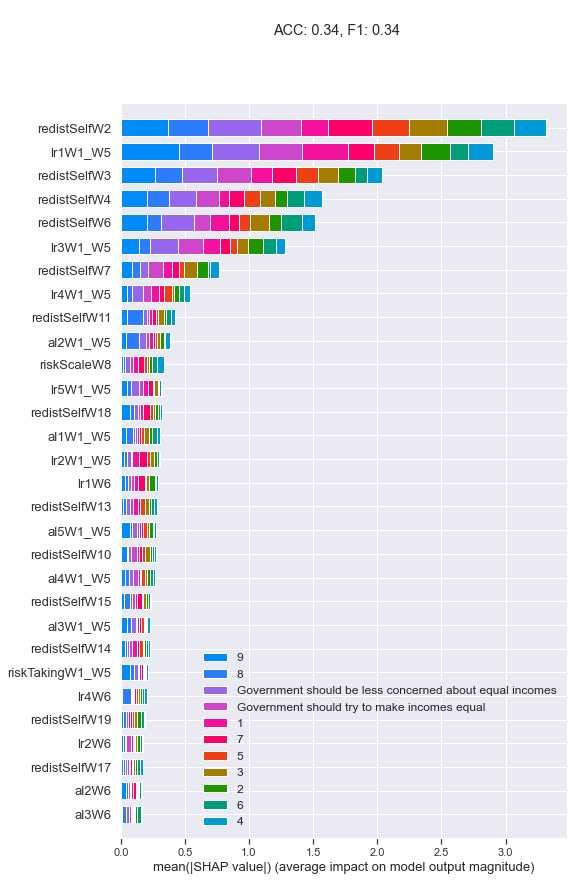

********


Government should try to make incomes equal                0.807044
1                                                          0.011859
2                                                          0.015168
3                                                          0.017101
4                                                          0.018047
5                                                          0.063034
6                                                          0.017202
7                                                          0.016328
8                                                          0.007075
9                                                          0.007591
Government should be less concerned about equal incomes    0.019551
dtype: float64

err_dist: 0.3937426399360876
Wall time: 4min 54s


In [1140]:
%%time
target_var = fuller_columns[0]

mask = df_simp[target_var].notnull()

# target_var = fuller_columns[0]
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = None

var_stub = target_var
min_features = 30
#     drop_std_thresh = .1
drop_vars = []
specific_vars = []
inv_wt_classes = True


# ### def on variable type
# if df_simp[target_var].dtype.name=="category":
#     alg = get_xgboost_alg(classification_problem=True)
#     multi_class_target = True
# else:
#     alg = get_xgboost_alg(classification_problem=False)
#     multi_class_target = False

multi_class_target = True
eval_metric = 'mlogloss'
alg = get_xgboost_alg(classification_problem=multi_class_target)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_dataset_only(df_simp,
                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                            multi_class_target=multi_class_target,)

# only wave variants of variable
# df_pred = df_pred[search(df_pred,"redistSelf").index]
# drop all nan columns
df_pred = df_pred.drop(search(df_pred,"nan").index,axis=1)


# df_pred["test_var"] = df_pred[target_var]+.2

# if multi_class_target:
#     corrs = df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan))
# else:
#     corrs = df_pred.corrwith(df_pred[target_var])
# print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.1].index))
# df_pred = df_pred[list(set(list(corrs[corrs.abs()>.1].index)+[target_var]))]


colname = var_stub
if target_var_title_pair is not None:
    title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
else:
    title = ""
var_list = [var_stub]
var_stub_list = []   

# eval_metric = 'merror'
alg = get_xgboost_alg(classification_problem=multi_class_target)
# alg = get_xgboost_alg(classification_problem=multi_class_target,
#                      colsample_bylevel=1.0,colsample_bynode=1.0, colsample_bytree=1.0,subsample=1.0,
#                      objective='multi:softmax',learning_rate=.01)
# alg = XGBRegressor(n_estimators=1000)

if inv_wt_classes:
    freq = df_pred.loc[mask,target_var].value_counts(normalize=True)
    wts = df_pred.loc[mask,target_var].apply(lambda x: 1/freq[x]).astype(float)
else:
    wts = df_pred.loc[mask,target_var].notnull().astype(float)
# wts=None
(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
    xgboost_run(subdir=colname,dataset=df_pred[mask],
            var_list=var_list,var_stub_list=var_stub_list,
            use_specific_weights=wts,
            min_features = min(df_pred.shape[1]-1,min_features),verbosity=0,
            skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
            title = title,print_shap_chart=True,threshold=0)
print("********")

if multi_class_target:
    predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories,ordered=True)
else:    
    predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).round()
#
pred_dist = predictions[df_simp[target_var].isnull()].value_counts(normalize=True).sort_index()
gt_dist = df_pred[target_var].value_counts(normalize=True).sort_index()

err_dist = (pred_dist - gt_dist).apply(lambda x: x**2).sum()/gt_dist.shape[0]    
#     MSE = mean_squared_error(y_test, predictions)
#     MAE = mean_absolute_error(y_test, predictions)
#     EV = explained_variance_score(y_test, predictions)
#     R2 = r2_score(y_test, predictions)

#     print("MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2) )        
# print(params)
display(pred_dist)
#     display(gt_dist)
print("err_dist:",err_dist*10)
# return -metrics[0]+(err_dist*10)

In [1136]:
# df_pred

In [1129]:
def create_train(dataset,drop_other_waves,var_stub_list,mask,target_var):
    keep_list = dataset.columns
    
    if drop_other_waves:
        # drop variables from other waves
        other_waves = get_other_wave_pattern(wave_no, max_wave, num_to_wave)
        keep_list = [x for x in keep_list if not re.search( other_waves, x )]
     
    keep_list = list(keep_list)
    keep_list.remove(target_var)
    # drop key variables
    keep_list = [x for x in keep_list if not any([var_stub in x for var_stub in var_stub_list])] 
    
    
    
    return dataset[keep_list][mask]

#global var_list
def xgboost_run(title, dataset, var_list,var_stub_list=[], subdir=None, min_features=30, dependence_plots=False , output_folder=".."+os.sep+"Output"+os.sep,Treatment="default",
                use_specific_weights = None, automatic_weights_from_wave_no = False, alg = None,verbosity=1,skip_bar_plot=False,
                eval_metric = ['rmse'],minimum_sample=50,dont_stop_on_sample_size_err=False,print_shap_chart=True,plot_validation=False,
                threshold=.1,drop_other_waves=False):
    if alg is None:
        alg = get_xgboost_alg()
        alg.verbosity=verbosity
    if verbosity>=1:
        verbose=True
    else:
        verbose=False
    # global BES_Panel
    # for target_var,base_var in zip(var_list,base_list):
    treatment_subfolder = create_subdir(output_folder,Treatment)

    
    for target_var in var_list:
        if automatic_weights_from_wave_no:
            wave_no = get_wave_no( target_var )
            weight_var = num_to_weight[wave_no]    
            print( target_var, wave_no )

        target = create_target(dataset,target_var)
        mask   = target.notnull()
        if optional_mask & automatic_weights_from_wave_no:
            mask = mask&optional_mask_fn(wave_no)
        else:
            mask = mask&optional_mask_fn()
        target = target[mask]

        if sum(mask) < minimum_sample:
            print("Skipping - sample size beneath minimum: ",minimum_sample)
            skipping = True
            if not dont_stop_on_sample_size_err:
                raise Exception("fgflgf")
            continue
        skipping=False

        train = create_train(dataset,drop_other_waves,var_stub_list,mask,target_var)

        if subdir is None:
            output_subfolder = create_subdir(treatment_subfolder,target_var)
        else:
            output_subfolder = create_subdir(treatment_subfolder,subdir)

        if use_specific_weights is not None:
            sample_weights = use_specific_weights[mask].fillna(use_specific_weights[mask].median())




        elif automatic_weights_from_wave_no:
            sample_weights = weights[weight_var][mask]
            print("missing vals in sample weights: "+ str( sample_weights.isnull().sum() ) )
            sample_weights = sample_weights.fillna(sample_weights.median())
        
        else:
            sample_weights = None
    #         get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, sample_weights )
    #         # fit to full dataset at non-overfitting level
    #         alg.fit(train, target, verbose = True, sample_weight = sample_weights)        
    #     else:

        if target.dtype.name == 'category':
            (ACC,  F1, alg_best_iteration) = get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, eval_metric, verbose = verbose,
                                      sample_weights=sample_weights,plot_validation=plot_validation)
            pd.Series([ACC,  F1,  alg_best_iteration],index = ["ACC",  "F1", "alg_best_iteration"]).to_csv(output_subfolder+"scores.csv")
           
        
        else:

            (MSE, MAE, EV, R2, alg_best_iteration) = get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, eval_metric, verbose = verbose,
                                      sample_weights=sample_weights,plot_validation=plot_validation)
            pd.Series([MSE, MAE, EV, R2, alg_best_iteration],index = ["MSE", "MAE", "EV", "R2", "alg_best_iteration"]).to_csv(output_subfolder+"scores.csv")
                                        
        # fit to full dataset at non-overfitting level
        alg.fit(train, target, verbose = verbose, sample_weight = sample_weights)


    #################

        explainer = shap.TreeExplainer(alg)
        shap_values = explainer.shap_values(train)
        
#         shap_values = shap.TreeExplainer(alg).shap_values(train);

        shap_problem = np.isnan(np.abs(shap_values).mean(0)).any()
        if shap_problem:
            print("hit problem!")
            shap_values = shap.TreeExplainer(alg).shap_values(train, approximate=True);

        pickle.dump( explainer, open( output_subfolder+"explainer.pkl", "wb" ) )
        pickle.dump( explainer, open( output_subfolder+"alg.pkl", "wb" ) )

        if target.dtype.name == 'category':
            subtitle = "ACC: %.2f, F1: %.2f" % (ACC, F1)
            metrics = (ACC, F1)
        else:
            subtitle = "MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2)
            metrics = (MSE, MAE, EV, R2)
            
        
            
        if target.dtype.name == 'category':
            multiclass = True
            class_names = list(target.cat.categories)
        else:
            multiclass = False
            class_names = None
#         raise Exception
        if print_shap_chart:
            shap_outputs(shap_values, train, target_var, output_subfolder, threshold = threshold,
                     min_features = min_features, title=title+"\n"+subtitle,
                     dependence_plots=dependence_plots,skip_bar_plot=False,multiclass=multiclass,class_names=class_names)        

    if skipping:
        return (None,None,None,None,None,None,None)
    else:
        return (explainer, shap_values, train.columns, train.index, alg,output_subfolder,metrics)


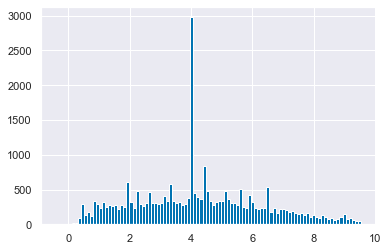

In [1131]:
pd.Series(alg.predict(df_pred.loc[df_pred[target_var].notnull(),train_columns])).hist(bins=100)

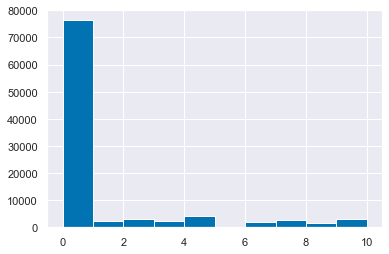

In [1085]:
pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).hist()

In [1120]:
wts

id
1         5.474627
2        16.289395
3         6.798450
4         6.798450
5        16.289395
           ...    
30586    13.786511
30587     6.798450
30588     5.474627
30589    12.698272
30590    12.698272
Name: redistSelfW1, Length: 27187, dtype: float64

In [1076]:
pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).round().value_counts()

5.0    61525
4.0     9814
3.0     8760
6.0     5997
2.0     4300
7.0     2925
8.0     1660
1.0     1418
9.0      607
dtype: int64

In [1077]:
df_pred[target_var].value_counts()

0.0     4966
5.0     3999
3.0     2937
7.0     2725
10.0    2392
2.0     2160
4.0     2141
6.0     1972
8.0     1669
1.0     1569
9.0      657
Name: redistSelfW1, dtype: int64

In [1063]:
df_pred = prep_dataset_only(df_simp,
                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                            multi_class_target=False,)
df_pred

,redistSelfW1,redistSelfW2,redistSelfW3,redistSelfW4,redistSelfW6,lr1W6,lr2W6,lr3W6,lr4W6,lr5W6,...,lr2W10_W12,lr3W10_W12,lr4W10_W12,lr5W10_W12,al1W10_W12,al2W10_W12,al3W10_W12,al4W10_W12,al5W10_W12,zeroSumIRTW14
id,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,NaN,0.0,0.0,4.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,4.0,NaN
2,8.0,NaN,9.0,8.0,7.0,1.0,1.0,2.0,1.0,1.0,...,NaN,2.0,2.0,2.0,2.0,0.0,3.0,1.0,3.0,NaN
3,5.0,6.0,4.0,3.0,6.0,2.0,3.0,4.0,4.0,3.0,...,3.0,3.0,4.0,3.0,3.0,3.0,4.0,2.0,3.0,NaN
4,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,8.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1064]:
alg

XGBRegressor(base_score=None, booster=None, colsample_bylevel=0.9,
             colsample_bynode=0.85, colsample_bytree=0.7, gamma=0.00065,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=0.05, max_delta_step=None, max_depth=6,
             min_child_weight=6, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=8, nthread=8, num_parallel_tree=None,
             random_state=729, refresh_leaf=0, reg_alpha=1.075,
             reg_lambda=1.011, scale_pos_weight=None, sketch_eps=0.0,
             subsample=0.8, tree_method=None, validate_parameters=None,
             verbosity=None)

In [998]:
predictions[df_simp[target_var].notnull()]

id
1        Government should try to make incomes equal
2                                                  8
3                                                  6
4                                                  5
5                                                  8
                            ...                     
30586    Government should try to make incomes equal
30587    Government should try to make incomes equal
30588    Government should try to make incomes equal
30589                                              8
30590    Government should try to make incomes equal
Length: 27187, dtype: category
Categories (11, object): ['Government should try to make incomes equal', '1', '2', '3', ..., '7', '8', '9', 'Government should be less concerned about equ...]

In [1002]:
df_simp[target_var][df_simp[target_var].notnull()].value_counts(normalize=True).sort_index()

Government should try to make incomes equal                0.182661
1                                                          0.057711
2                                                          0.079450
3                                                          0.108030
4                                                          0.078751
5                                                          0.147092
6                                                          0.072535
7                                                          0.100232
8                                                          0.061390
9                                                          0.024166
Government should be less concerned about equal incomes    0.087983
Name: redistSelfW1, dtype: float64

In [1004]:
predictions[df_simp[target_var].notnull()].value_counts(normalize=True).sort_index()

Government should try to make incomes equal                0.225806
1                                                          0.077427
2                                                          0.076434
3                                                          0.082760
4                                                          0.084452
5                                                          0.111524
6                                                          0.069960
7                                                          0.064847
8                                                          0.072902
9                                                          0.040902
Government should be less concerned about equal incomes    0.092986
dtype: float64

In [1023]:
predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories,ordered=True)
(df_simp[target_var][df_simp[target_var].notnull()]==predictions[df_simp[target_var].notnull()]).mean()

0.39636591017765843

In [1031]:
misses = (df_simp[target_var][df_simp[target_var].notnull()]!=predictions[df_simp[target_var].notnull()])
miss_df = pd.concat([df_simp[target_var][df_simp[target_var].notnull()][misses],predictions[df_simp[target_var].notnull()][misses]],axis=1)
miss_df

,redistSelfW1,0
id,,
3,5,6
6,2,Government should try to make incomes equal
7,2,4
13,6,5
14,7,8
...,...,...
30584,4,6
30587,5,6
30588,Government should try to make incomes equal,6


In [1027]:
(miss_df[miss_df.columns[0]].cat.codes - miss_df[miss_df.columns[1]].cat.codes).value_counts()

-1     3065
 1     2696
-2     2152
 2     1785
-3     1299
-5     1133
 3     1040
-4      780
 5      730
 4      530
 6      205
-6      195
-7      141
-10     132
 7      124
 10     110
-8      108
 8       69
-9       65
 9       52
dtype: int64

In [1007]:
predictions[df_simp[target_var].notnull()]

id
1        Government should try to make incomes equal
2                                                  8
3                                                  6
4                                                  5
5                                                  8
                            ...                     
30586    Government should try to make incomes equal
30587    Government should try to make incomes equal
30588    Government should try to make incomes equal
30589                                              8
30590    Government should try to make incomes equal
Length: 27187, dtype: category
Categories (11, object): ['Government should try to make incomes equal', '1', '2', '3', ..., '7', '8', '9', 'Government should be less concerned about equ...]

In [992]:
60*60/11

327.27272727272725

In [990]:
df_pred[search(df_pred,"redistSelf").index]#
# .replace("Don't know",np.nan).isnull().all(axis=1).sum()

,redistSelfW2|Government should try to make incomes equal,redistSelfW2|1,redistSelfW2|2,redistSelfW2|3,redistSelfW2|4,redistSelfW2|5,redistSelfW2|6,redistSelfW2|7,redistSelfW2|8,redistSelfW2|9,...,redistSelfW19|3,redistSelfW19|4,redistSelfW19|5,redistSelfW19|6,redistSelfW19|7,redistSelfW19|8,redistSelfW19|9,redistSelfW19|Government should be less concerned about equal incomes,redistSelfW19|nan,redistSelfW1
id,,,,,,,,,,,,,,,,,,,,,
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,Government should try to make incomes equal
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,8
3,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,5
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,5
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,NaN
98448,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,NaN
98449,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,NaN


In [960]:
# 100%|███████████████████████████████████████████████| 30/30 [20:15<00:00, 40.51s/trial, best loss: -0.3296923762817655]
# best:
# {'learning_rate': 0.00859983317209172, 'max_depth': 2.0, 'min_child_weight': 3.0, 'subsample': 0.21193506099500023}
# Wall time: 20min 18s

# horrible result, ridiculous distribution in unseen values!

0.0

In [969]:
df_simp["redistSelfW1"].value_counts(normalize=True).sort_index()

Government should try to make incomes equal                0.182661
1                                                          0.057711
2                                                          0.079450
3                                                          0.108030
4                                                          0.078751
5                                                          0.147092
6                                                          0.072535
7                                                          0.100232
8                                                          0.061390
9                                                          0.024166
Government should be less concerned about equal incomes    0.087983
Name: redistSelfW1, dtype: float64

In [972]:
# predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories)

In [977]:
# trials.trials

In [951]:
# 1hr long walk, -> 
60*60/154

23.376623376623378

In [976]:
# 154.26s/trial

In [971]:
# pd.Series(alg.predict(df_pred[train_columns]),index = df_simp.index)

In [667]:
# 1                                                          0.025529
# 2                                                          0.060443
# 3                                                          0.110499
# 4                                                          0.053060
# 5                                                          0.219247
# 6                                                          0.036166
# 7                                                          0.108872
# 8                                                          0.049556
# 9                                                          0.008635
# Government should be less concerned about equal incomes    0.103742
# Government should try to make incomes equal                0.224252

[{'state': 2,
  'tid': 0,
  'spec': None,
  'result': {'loss': -0.33965125094768767, 'status': 'ok'},
  'misc': {'tid': 0,
   'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'workdir': None,
   'idxs': {'inv_wt_classes': [0]},
   'vals': {'inv_wt_classes': [1]}},
  'exp_key': None,
  'owner': None,
  'version': 0,
  'book_time': datetime.datetime(2022, 6, 5, 19, 51),
  'refresh_time': datetime.datetime(2022, 6, 5, 19, 53, 43, 191000)},
 {'state': 2,
  'tid': 1,
  'spec': None,
  'result': {'loss': -0.37263078089461715, 'status': 'ok'},
  'misc': {'tid': 1,
   'cmd': ('domain_attachment', 'FMinIter_Domain'),
   'workdir': None,
   'idxs': {'inv_wt_classes': [1]},
   'vals': {'inv_wt_classes': [0]}},
  'exp_key': None,
  'owner': None,
  'version': 0,
  'book_time': datetime.datetime(2022, 6, 5, 19, 53, 43, 194000),
  'refresh_time': datetime.datetime(2022, 6, 5, 19, 56, 47, 326000)}]

In [637]:
# best loss: -0.37452615617892343]
# best:
# # {'reg_lambda': 0.028743300034560573}

id
2                                                      NaN
3                                                        6
7                                                        4
8        Government should be less concerned about equa...
15       Government should be less concerned about equa...
                               ...                        
50916                                                  NaN
50919                                                  NaN
50971                                                  NaN
50998                                                  NaN
51026                                                  NaN
Name: redistSelfW2, Length: 11587, dtype: category
Categories (11, object): ['Government should try to make incomes equal' < '1' < '2' < '3' ... '7' < '8' < '9' < 'Government should be less concerned about equ...]

In [638]:
%debug

> <ipython-input-635-2f1666a78c92>(2)<module>()
      1 # df_pred["redistSelfW1"]
----> 2 taret_var

ipdb> quit


id
2        False
3        False
7        False
8        False
15        True
         ...  
50916     True
50919     True
50971     True
50998     True
51026     True
Name: redistSelfW1, Length: 11587, dtype: bool

In [641]:
#???

from sklearn.utils import compute_sample_weight
sample_weight = compute_sample_weight('balanced', y_train)

id
15       Government should be less concerned about equa...
130                                                      5
240                                                      3
405                                                      3
429                                                      1
                               ...                        
50916                                                    5
50919                                                    5
50971                                                    5
50998                                                    5
51026                                                    5
Name: redistSelfW1, Length: 3596, dtype: object

In [642]:
df_simp_imp[["redistSelfW1","redistSelfW2"]][df_simp["redistSelfW1"].isnull()]

,redistSelfW1,redistSelfW2
id,,
15,Government should be less concerned about equa...,Government should be less concerned about equa...
130,5,7
240,3,3
405,3,3
429,1,1
...,...,...
50916,5,5
50919,5,5
50971,5,Government should try to make incomes equal


In [ ]:
pd.Series(alg.predict(df_pred[train_columns]),index = df_simp.index)[df_simp["redistSelfW1"].isnull()].value_counts(normalize=True)

In [705]:
df_simp_imp["redistSelfW1"][df_simp["redistSelfW1"].isnull()].value_counts(normalize=True).sort_index()

1                                                          0.008065
2                                                          0.026418
3                                                          0.102892
4                                                          0.018632
5                                                          0.471079
6                                                          0.015851
7                                                          0.063404
8                                                          0.021969
9                                                          0.001390
Government should be less concerned about equal incomes    0.052836
Government should try to make incomes equal                0.217464
Name: redistSelfW1, dtype: float64

In [703]:
df_simp_imp["redistSelfW1"][df_simp["redistSelfW1"].notnull()].value_counts(normalize=True).sort_index()

1                                                          0.025529
2                                                          0.060443
3                                                          0.110499
4                                                          0.053060
5                                                          0.219247
6                                                          0.036166
7                                                          0.108872
8                                                          0.049556
9                                                          0.008635
Government should be less concerned about equal incomes    0.103742
Government should try to make incomes equal                0.224252
Name: redistSelfW1, dtype: float64

In [694]:
# taking it as a scale variables
df_simp_imp["redistSelfW1"] = df_simp_imp["redistSelfW1"].round().astype(int)
df_simp_imp["redistSelfW1"][df_simp["redistSelfW1"].notnull()].value_counts(normalize=True).sort_index()

-1     0.000125
 0     0.042923
 1     0.091728
 2     0.094982
 3     0.131648
 4     0.176073
 5     0.143036
 6     0.112877
 7     0.089351
 8     0.058065
 9     0.041171
 10    0.017895
 11    0.000125
Name: redistSelfW1, dtype: float64

In [693]:
BES_Panel["redistSelfW1"].value_counts(normalize=True).sort_index()

Government should try to make incomes equal                0.162724
1                                                          0.051412
2                                                          0.070778
3                                                          0.096238
4                                                          0.070155
5                                                          0.131037
6                                                          0.064618
7                                                          0.089292
8                                                          0.054689
9                                                          0.021528
Government should be less concerned about equal incomes    0.078380
Don't know                                                 0.109149
Name: redistSelfW1, dtype: float64

In [646]:
alg

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.9,
              colsample_bynode=0.85, colsample_bytree=0.7, gamma=0.00065,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=6, missing=nan, monotone_constraints='()',
              n_estimators=168, n_jobs=8, nthread=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=729, refresh_leaf=0,
              reg_alpha=1.075, reg_lambda=1.011, scale_pos_weight=1.09,
              sketch_eps=0.0, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [1060]:
dk_dict = {"Don't know":np.nan}

def prep_dataset_only(dataset,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=False,
       drop_vars = [],demo_var_only=True,
        multi_class_target=False,dummy_na=True,specific_vars = False, drop_after_dummying = []):


#     labels = BES_label_list[ge]
    df_simp = dataset.drop(drop_vars,axis=1)

    df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)
    # prep nominal and ordinal as categorical to be dummied
    
    old_demo_vars = [x for x in df_simp.columns if x!=target_var]
    
    
    scale_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [1]]
    num_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [0]]
    old_demo_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [5]]
#     raise Exception
    if not multi_class_target:
        df_simp[target_var] = df_simp[target_var].replace(dk_dict).cat.codes.replace(-1,np.nan).astype('float')  
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
        df_simp[num_vars] = df_simp[num_vars].astype('float')  
        df_simp = pd.get_dummies(df_simp,prefix_sep='|',dummy_na=dummy_na).drop(target_var_drop_list,axis=1)
        if target_var+"|nan" in df_simp.columns:
            df_simp.loc[df_simp[target_var+"|nan"]==1,var_stub]=np.nan
            df_simp.drop(target_var+"|nan",axis=1,inplace=True,)
    else:
        old_demo_vars = [x for x in old_demo_vars if x !=target_var]
        scale_vars = [x for x in scale_vars if x !=target_var]   
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
        df_simp[num_vars] = df_simp[num_vars].astype('float')   
        df_simp[target_var] = df_simp[target_var].astype('category')
        target_var_drop_list = [x for x in target_var_drop_list if x in df_simp[target_var].cat.categories]
        df_simp[target_var] = df_simp[target_var].cat.remove_categories(target_var_drop_list)        
        all_but_target = [x for x in df_simp.columns if x !=target_var]
        target_temp = df_simp[target_var].copy()
        df_simp = pd.get_dummies(df_simp[all_but_target],prefix_sep='|',dummy_na=dummy_na)
        df_simp[target_temp.name] = target_temp
        

    
#     df_simp = df_simp.rename(columns = replace_var_names( BES_label_list[ge] , df_simp ))  
    
    df_simp = df_simp.drop(drop_after_dummying , axis=1)

    Treatment = var_stub

    var_list = [var_stub]
    var_stub_list = []
    if not multi_class_target:
        df_simp = df_simp.select_dtypes('number')
        df_simp = df_simp.astype('float')
#     mask = df_simp[var_stub].notnull() & df_simp["wt"].notnull()
    return df_simp


# def prep_dataset(dataset,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
#        var_stub,min_features,dependence_plots=False,
#        drop_vars = [],demo_var_only=True,alg=alg,
#         multi_class_target=False,dummy_na=True,specific_vars = False, drop_after_dummying = []):


# #     labels = BES_label_list[ge]
#     df_simp = dataset.drop(drop_vars,axis=1)

#     df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)
#     # prep nominal and ordinal as categorical to be dummied
    
#     old_demo_vars = [x for x in df_simp.columns if x!=target_var]
    
    
#     scale_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [1]]
#     num_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [0]]
#     old_demo_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [5]]
        
        
        
#     if not multi_class_target:
#         df_simp[target_var] = df_simp[target_var].replace(dk_dict).cat.codes.replace(-1,np.nan).astype('float')  
#         df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
#         df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
#         df_simp[num_vars] = df_simp[num_vars].astype('float')  
#         df_simp = pd.get_dummies(df_simp,prefix_sep='|',dummy_na=dummy_na).drop(target_var_drop_list,axis=1)
#         if target_var+"|nan" in df_simp.columns:
#             df_simp.loc[df_simp[target_var+"|nan"]==1,var_stub]=np.nan
#             df_simp.drop(target_var+"|nan",axis=1,inplace=True,)
#     else:
#         old_demo_vars = [x for x in old_demo_vars if x !=target_var]
#         scale_vars = [x for x in scale_vars if x !=target_var]   
#         df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
#         df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
#         df_simp[num_vars] = df_simp[num_vars].astype('float')   
#         df_simp[target_var] = df_simp[target_var].astype('category')
#         target_var_drop_list = [x for x in target_var_drop_list if x in df_simp[target_var].cat.categories]
#         df_simp[target_var] = df_simp[target_var].cat.remove_categories(target_var_drop_list)        
#         all_but_target = [x for x in df_simp.columns if x !=target_var]
#         target_temp = df_simp[target_var].copy()
#         df_simp = pd.get_dummies(df_simp[all_but_target],prefix_sep='|',dummy_na=dummy_na)
#         df_simp[target_temp.name] = target_temp
        

# #     df_simp = df_simp.rename(columns = replace_var_names( BES_label_list[ge] , df_simp ))  
    
#     df_simp = df_simp.drop(drop_after_dummying , axis=1)

#     Treatment = var_stub

#     var_list = [var_stub]
#     var_stub_list = [var_stub,]
#     if not multi_class_target:
#         df_simp = df_simp.select_dtypes('number')
#         df_simp = df_simp.astype('float')

#     colname = var_stub
#     if target_var_title_pair is not None:
#         title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
#     else:
#         title = ""
        
# #     if wt_col =="wt":
# #         wt_cols = ["wt"]
# #         wt_ser = df_simp["wt"]
# #     else:
# #         wt_cols = ["wt",wt_col]
# #         wt_ser = df_simp[wt_col]        
#     mask = df_simp[var_stub].notnull()# & df_simp[wt_col].notnull()
    
#     (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
#         xgboost_run(subdir=colname,dataset=df_simp[mask],
# #                     .drop(wt_cols,axis=1),
#                 var_list=var_list,var_stub_list=var_stub_list,
#                 use_specific_weights=None,
#                 min_features = min(df_simp.shape[1]-1,min_features),verbosity=0,
#                 skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
#                 title = title)
    
#     return (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)        


df_pred = prep_dataset_only(df_simp,
                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                            multi_class_target=multi_class_target,)
df_pred

,redistSelfW2,redistSelfW3,redistSelfW4,redistSelfW6,lr1W6,lr2W6,lr3W6,lr4W6,lr5W6,al1W6,...,lr3W10_W12,lr4W10_W12,lr5W10_W12,al1W10_W12,al2W10_W12,al3W10_W12,al4W10_W12,al5W10_W12,zeroSumIRTW14,redistSelfW1
id,,,,,,,,,,,,,,,,,,,,,
1,0.0,NaN,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,0.0,4.0,NaN,Government should try to make incomes equal
2,NaN,9.0,8.0,7.0,1.0,1.0,2.0,1.0,1.0,2.0,...,2.0,2.0,2.0,2.0,0.0,3.0,1.0,3.0,NaN,8
3,6.0,4.0,3.0,6.0,2.0,3.0,4.0,4.0,3.0,3.0,...,3.0,4.0,3.0,3.0,3.0,4.0,2.0,3.0,NaN,5
4,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
5,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1059]:
%debug

> <ipython-input-1058-ce35d5068c47>(20)prep_dataset_only()
     18     scale_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [1]]
     19     num_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [0]]
---> 20     raise Exception
     21     if not multi_class_target:
     22         df_simp[target_var] = df_simp[target_var].replace(dk_dict).cat.codes.replace(-1,np.nan).astype('float')

ipdb> scale_vars
[]
ipdb> old_demo_vars 
[]
ipdb> quit


In [1054]:
df_simp

,redistSelfW1,redistSelfW2,redistSelfW3,redistSelfW4,redistSelfW6,lr1W6,lr2W6,lr3W6,lr4W6,lr5W6,...,lr2W10_W12,lr3W10_W12,lr4W10_W12,lr5W10_W12,al1W10_W12,al2W10_W12,al3W10_W12,al4W10_W12,al5W10_W12,zeroSumIRTW14
id,,,,,,,,,,,,,,,,,,,,,
1,Government should try to make incomes equal,Government should try to make incomes equal,NaN,Government should try to make incomes equal,Government should try to make incomes equal,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,...,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly disagree,Strongly agree,NaN
2,8,NaN,9,8,7,Disagree,Disagree,Neither agree nor disagree,Disagree,Disagree,...,NaN,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Strongly disagree,Agree,Disagree,Agree,NaN
3,5,6,4,3,6,Neither agree nor disagree,Agree,Strongly agree,Strongly agree,Agree,...,Agree,Agree,Strongly agree,Agree,Agree,Agree,Strongly agree,Neither agree nor disagree,Agree,NaN
4,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,8,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
